## Importing the relevant libraries

In [124]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings, gc, joblib
warnings.filterwarnings('ignore')
from sklearnex import patch_sklearn
patch_sklearn()
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, LabelEncoder, OneHotEncoder
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, PrecisionRecallDisplay, precision_score, accuracy_score, recall_score, f1_score, roc_auc_score, RocCurveDisplay
from scipy.stats import probplot
from sklearn.linear_model import LogisticRegression, Lasso, PassiveAggressiveClassifier, SGDClassifier, RidgeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, HistGradientBoostingClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from imblearn.over_sampling import BorderlineSMOTE
from feature_engine.outliers import Winsorizer
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFromModel, chi2, RFE, SequentialFeatureSelector
from collections import Counter
from sklearn.pipeline import Pipeline

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


## Loading the dataset

In [2]:
df = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


## Data Exploration

In [3]:
df.shape

(1470, 35)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [5]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [6]:
df.duplicated().sum()

0

In [7]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
df.std() <= 1e-2

Age                         False
DailyRate                   False
DistanceFromHome            False
Education                   False
EmployeeCount                True
EmployeeNumber              False
EnvironmentSatisfaction     False
HourlyRate                  False
JobInvolvement              False
JobLevel                    False
JobSatisfaction             False
MonthlyIncome               False
MonthlyRate                 False
NumCompaniesWorked          False
PercentSalaryHike           False
PerformanceRating           False
RelationshipSatisfaction    False
StandardHours                True
StockOptionLevel            False
TotalWorkingYears           False
TrainingTimesLastYear       False
WorkLifeBalance             False
YearsAtCompany              False
YearsInCurrentRole          False
YearsSinceLastPromotion     False
YearsWithCurrManager        False
dtype: bool

In [9]:
df.EmployeeCount.unique()

array([1], dtype=int64)

In [10]:
# Removing features with 0 standard deviation
df.drop(['StandardHours','EmployeeCount'],axis=1,inplace=True)

In [11]:
df.nunique() / len(df) * 100

Age                           2.925170
Attrition                     0.136054
BusinessTravel                0.204082
DailyRate                    60.272109
Department                    0.204082
DistanceFromHome              1.972789
Education                     0.340136
EducationField                0.408163
EmployeeNumber              100.000000
EnvironmentSatisfaction       0.272109
Gender                        0.136054
HourlyRate                    4.829932
JobInvolvement                0.272109
JobLevel                      0.340136
JobRole                       0.612245
JobSatisfaction               0.272109
MaritalStatus                 0.204082
MonthlyIncome                91.768707
MonthlyRate                  97.074830
NumCompaniesWorked            0.680272
Over18                        0.068027
OverTime                      0.136054
PercentSalaryHike             1.020408
PerformanceRating             0.136054
RelationshipSatisfaction      0.272109
StockOptionLevel         

## Exploratory Data Analysis

Skewness of Age: 0.4132863018563338
Kurtosis of Age: -0.4041451371872906


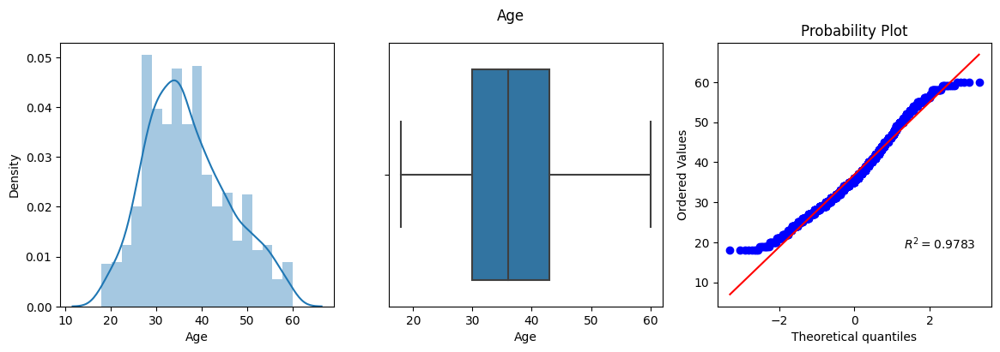

Skewness of DailyRate: -0.003518568352325854
Kurtosis of DailyRate: -1.2038228076234574


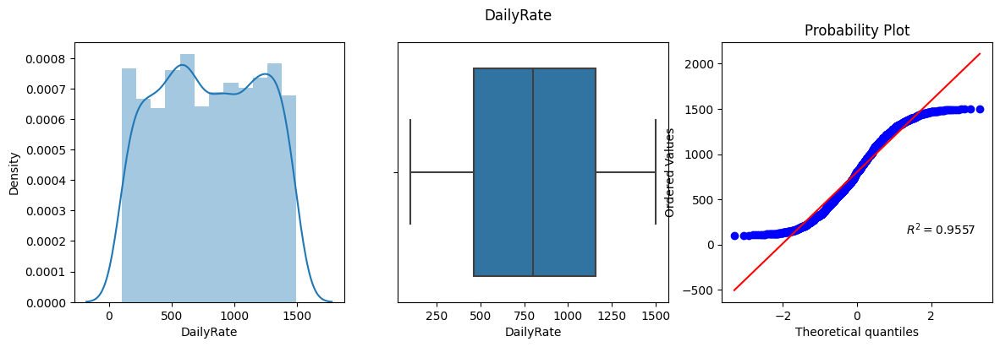

Skewness of DistanceFromHome: 0.9581179956568269
Kurtosis of DistanceFromHome: -0.22483340490405102


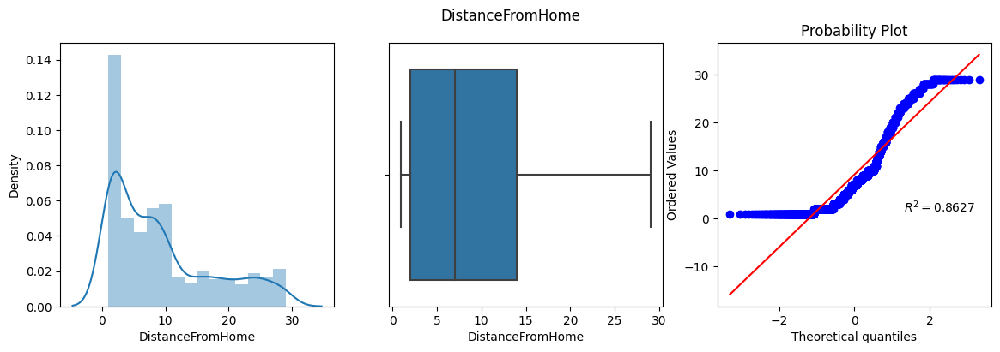

Skewness of Education: -0.2896810819684331
Kurtosis of Education: -0.5591149664143074


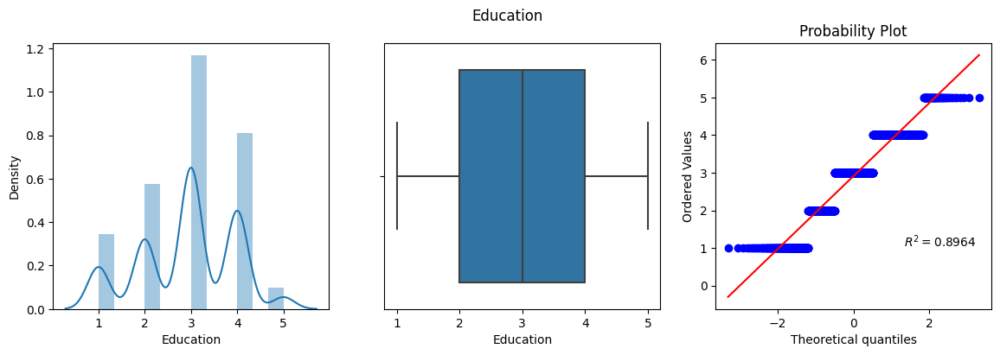

Skewness of EmployeeNumber: 0.016574019580105036
Kurtosis of EmployeeNumber: -1.2231789059146994


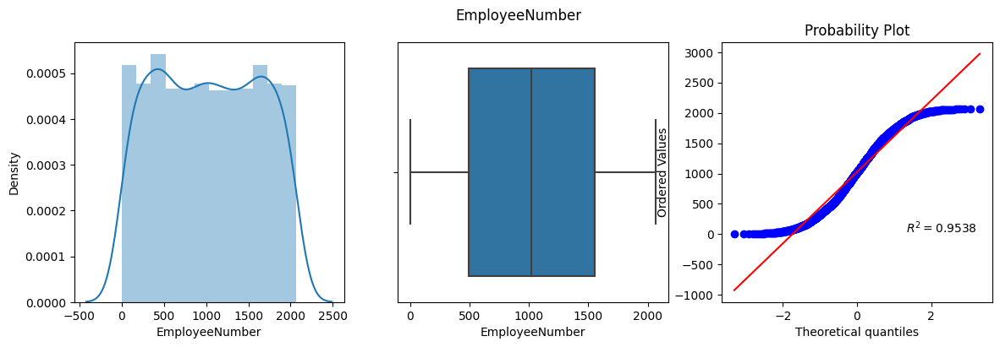

Skewness of EnvironmentSatisfaction: -0.32165444773937907
Kurtosis of EnvironmentSatisfaction: -1.2025205217966843


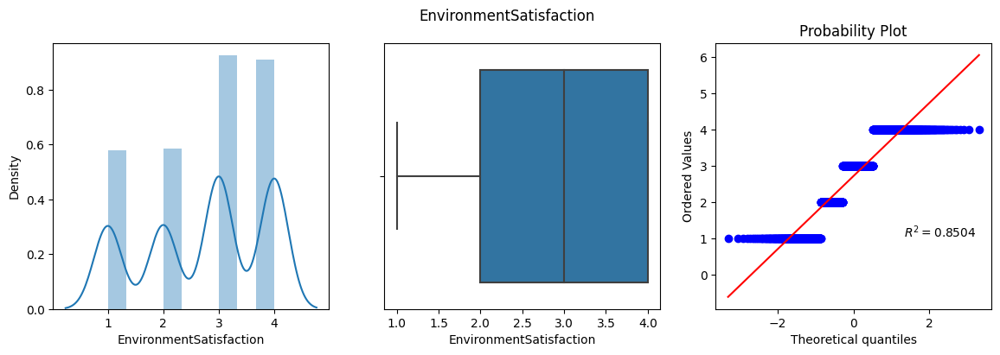

Skewness of HourlyRate: -0.03231095290044942
Kurtosis of HourlyRate: -1.1963984562565886


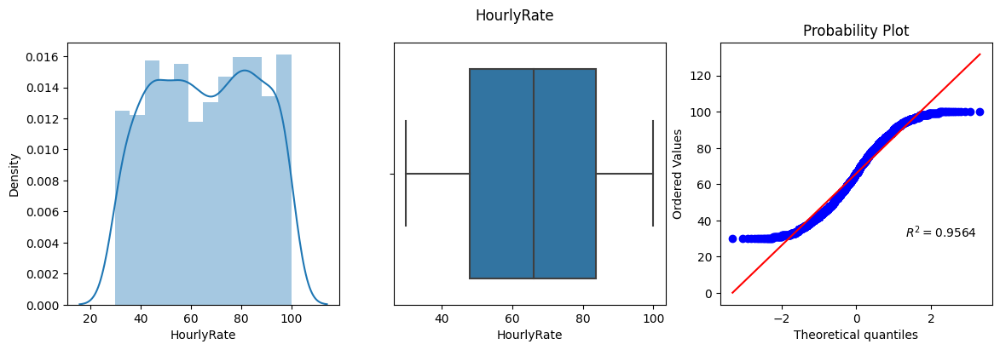

Skewness of JobInvolvement: -0.4984193640419493
Kurtosis of JobInvolvement: 0.27099876649436405


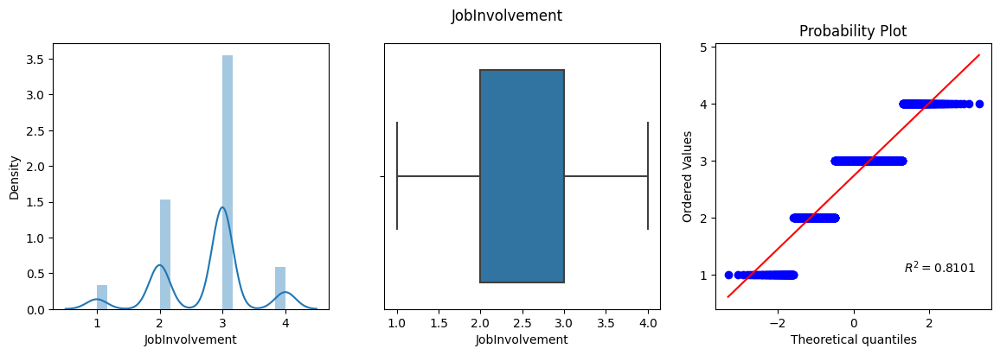

Skewness of JobLevel: 1.0254012829518246
Kurtosis of JobLevel: 0.39915205539119025


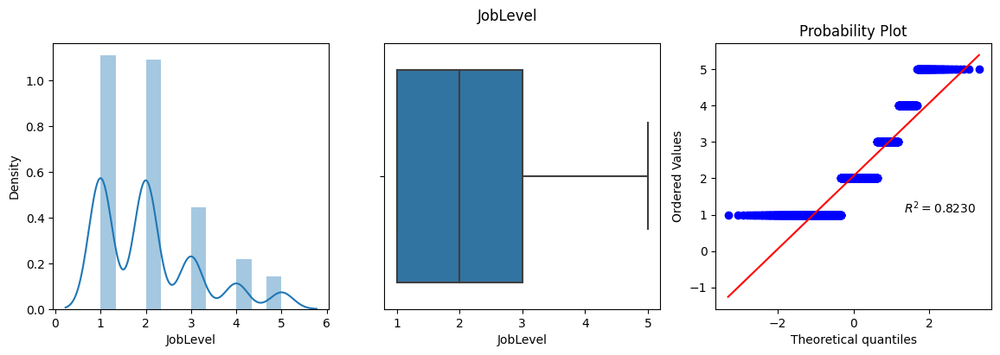

Skewness of JobSatisfaction: -0.3296719586636647
Kurtosis of JobSatisfaction: -1.2221925684964252


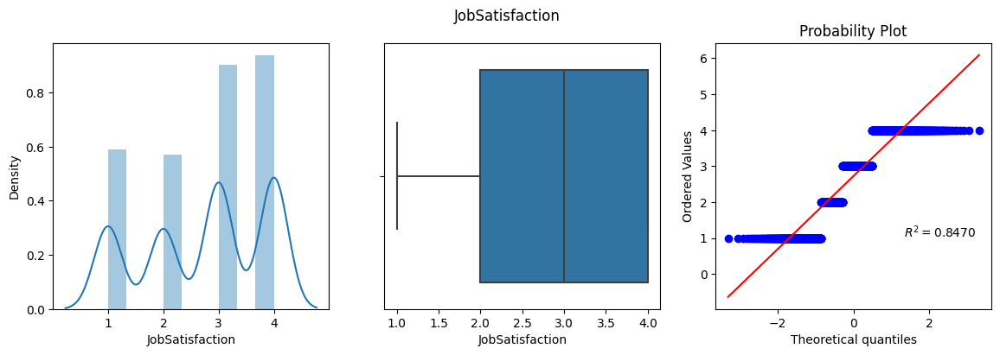

Skewness of MonthlyIncome: 1.3698166808390662
Kurtosis of MonthlyIncome: 1.005232691449859


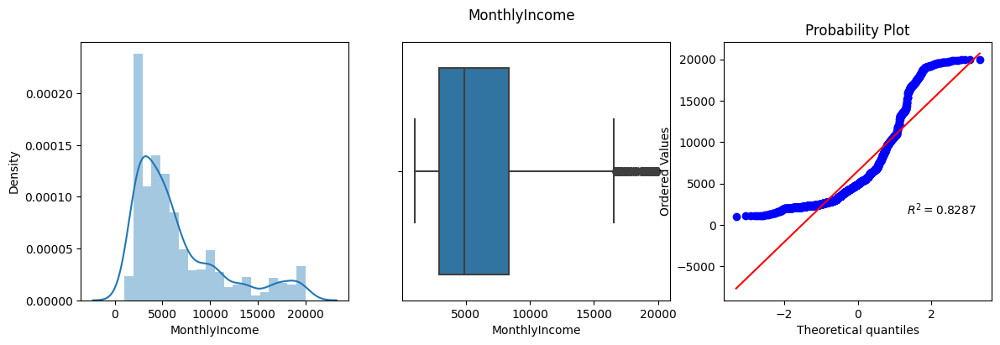

Skewness of MonthlyRate: 0.018577807891132458
Kurtosis of MonthlyRate: -1.2149560995878737


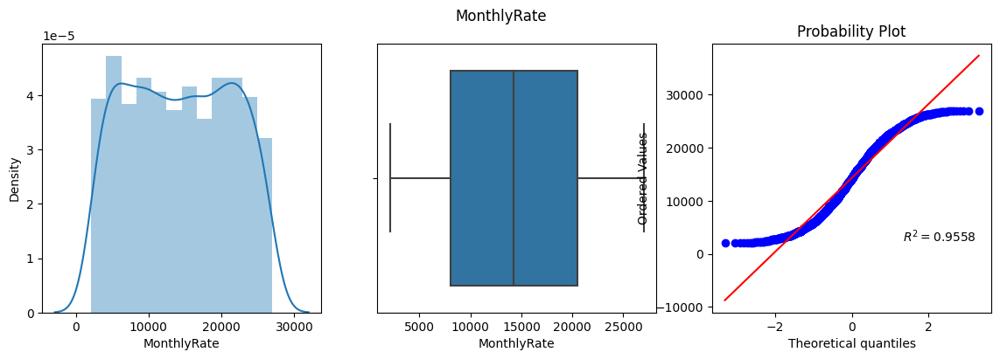

Skewness of NumCompaniesWorked: 1.026471111968205
Kurtosis of NumCompaniesWorked: 0.01021381669037602


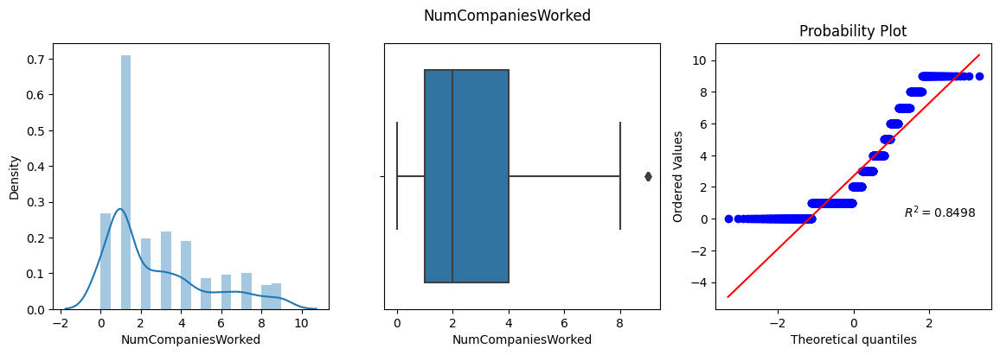

Skewness of PercentSalaryHike: 0.8211279755780908
Kurtosis of PercentSalaryHike: -0.30059822209054543


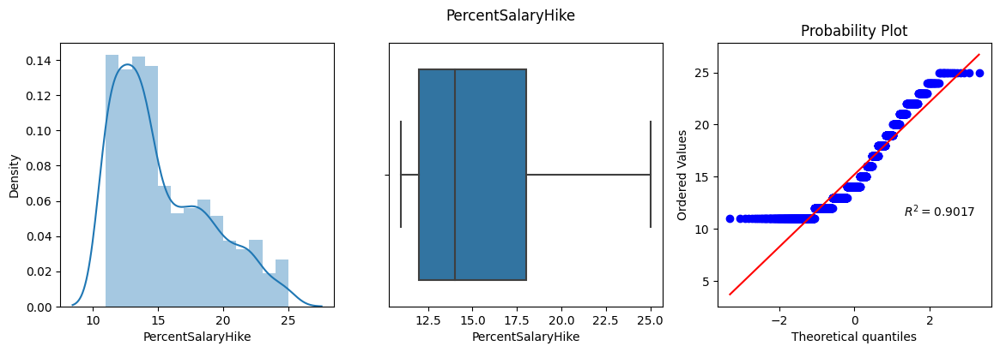

Skewness of PerformanceRating: 1.921882702142603
Kurtosis of PerformanceRating: 1.6959386701408348


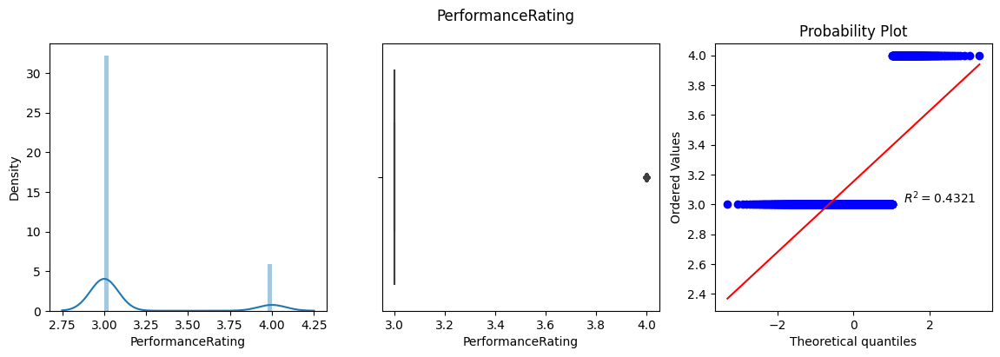

Skewness of RelationshipSatisfaction: -0.30282756517072296
Kurtosis of RelationshipSatisfaction: -1.184813981868854


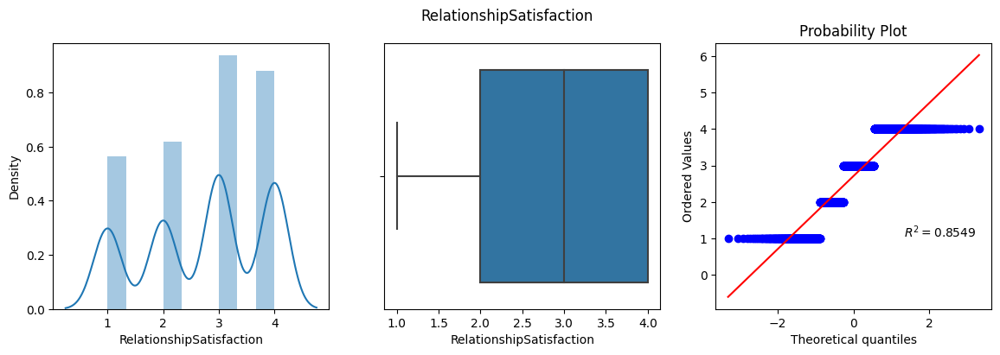

Skewness of StockOptionLevel: 0.9689803167738937
Kurtosis of StockOptionLevel: 0.3646343338026954


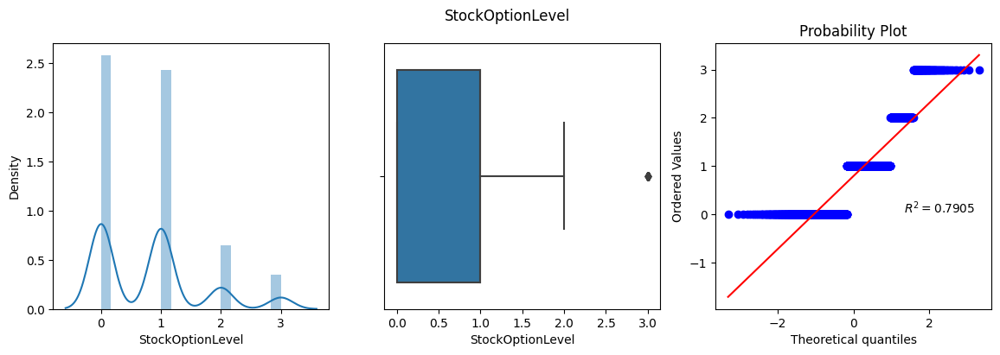

Skewness of TotalWorkingYears: 1.1171718528128527
Kurtosis of TotalWorkingYears: 0.918269536621358


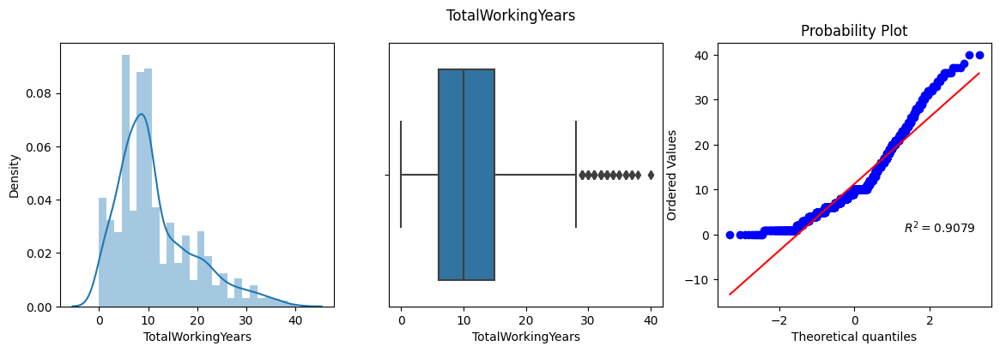

Skewness of TrainingTimesLastYear: 0.5531241710537028
Kurtosis of TrainingTimesLastYear: 0.4949929860394717


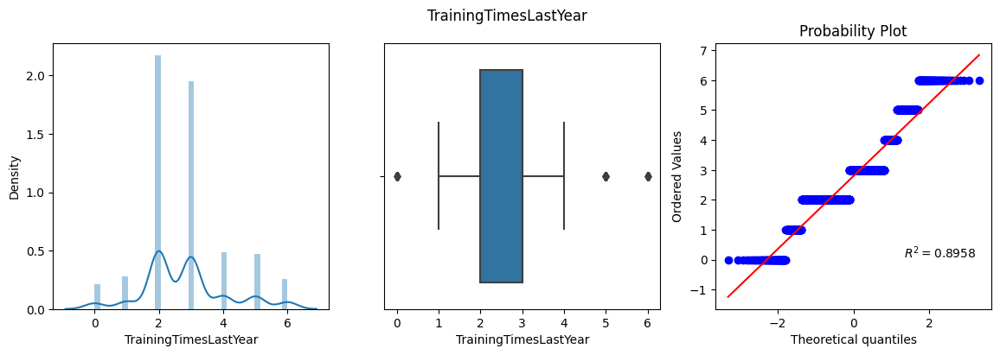

Skewness of WorkLifeBalance: -0.5524802990965146
Kurtosis of WorkLifeBalance: 0.4194604953216339


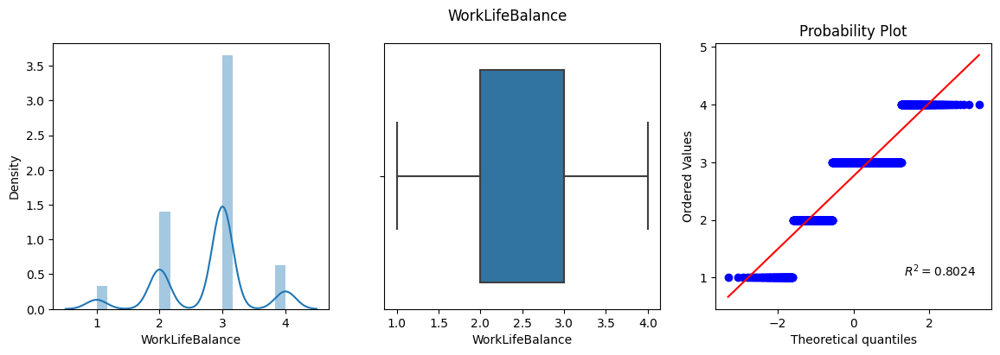

Skewness of YearsAtCompany: 1.7645294543422085
Kurtosis of YearsAtCompany: 3.93550875575465


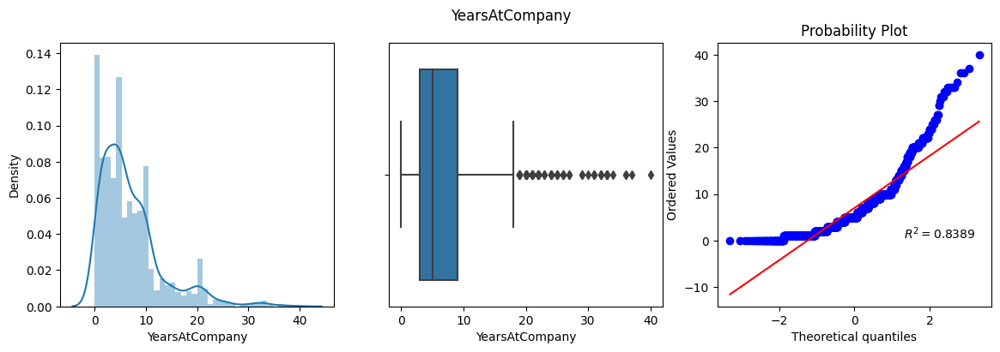

Skewness of YearsInCurrentRole: 0.9173631562908262
Kurtosis of YearsInCurrentRole: 0.47742077351356293


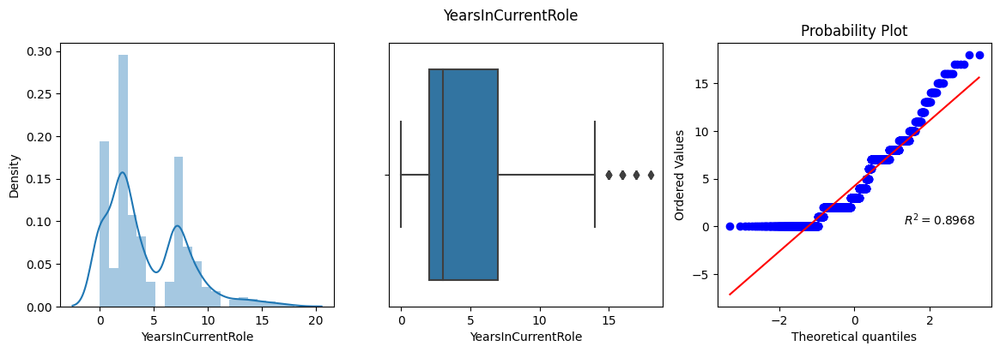

Skewness of YearsSinceLastPromotion: 1.9842899833524859
Kurtosis of YearsSinceLastPromotion: 3.612673114548667


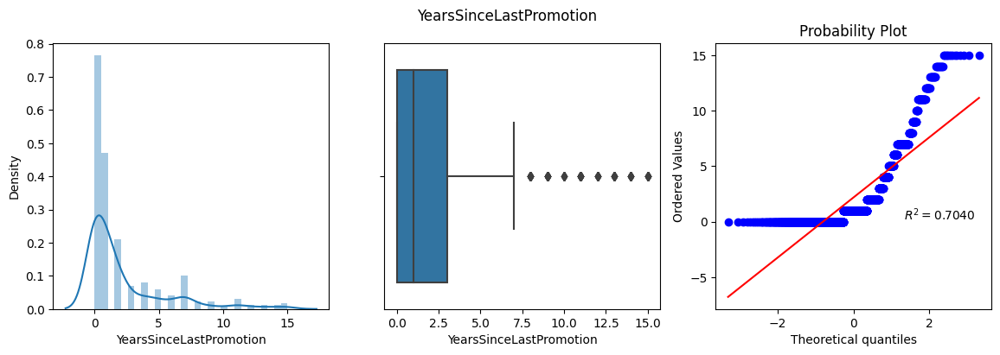

Skewness of YearsWithCurrManager: 0.8334509919918475
Kurtosis of YearsWithCurrManager: 0.17105808388335575


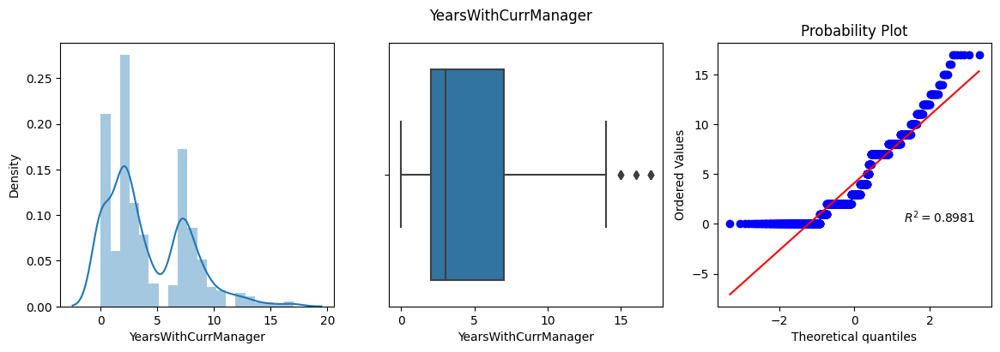

In [12]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[col])
    plt.subplot(132)
    sns.boxplot(df[col])
    plt.subplot(133)
    probplot(df[col],rvalue=True,plot=plt,dist='norm')
    plt.suptitle(col)
    plt.show()
    gc.collect()

In [13]:
skewed_cols = ['YearsWithCurrManager','YearsSinceLastPromotion','YearsInCurrentRole','YearsAtCompany','TrainingTimesLastYear','TotalWorkingYears','StockOptionLevel','PerformanceRating','NumCompaniesWorked','MonthlyIncome']

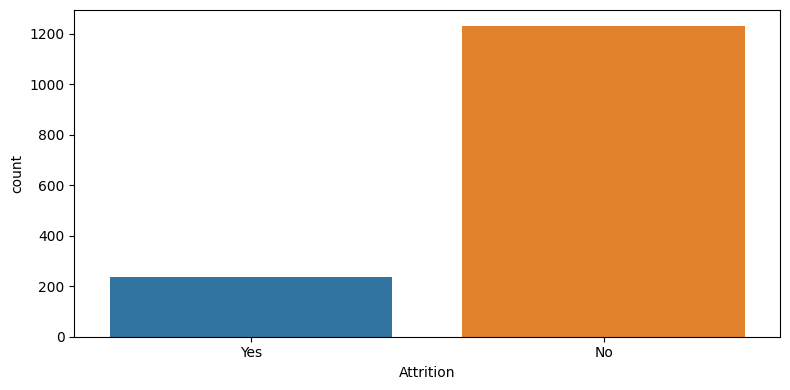

In [14]:
plt.figure(figsize=(8,4))
fig = sns.countplot(df['Attrition'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

There is a clear imbalance in the target "Attrition" class with "No" being the majority label and "Yes" being the minority label.

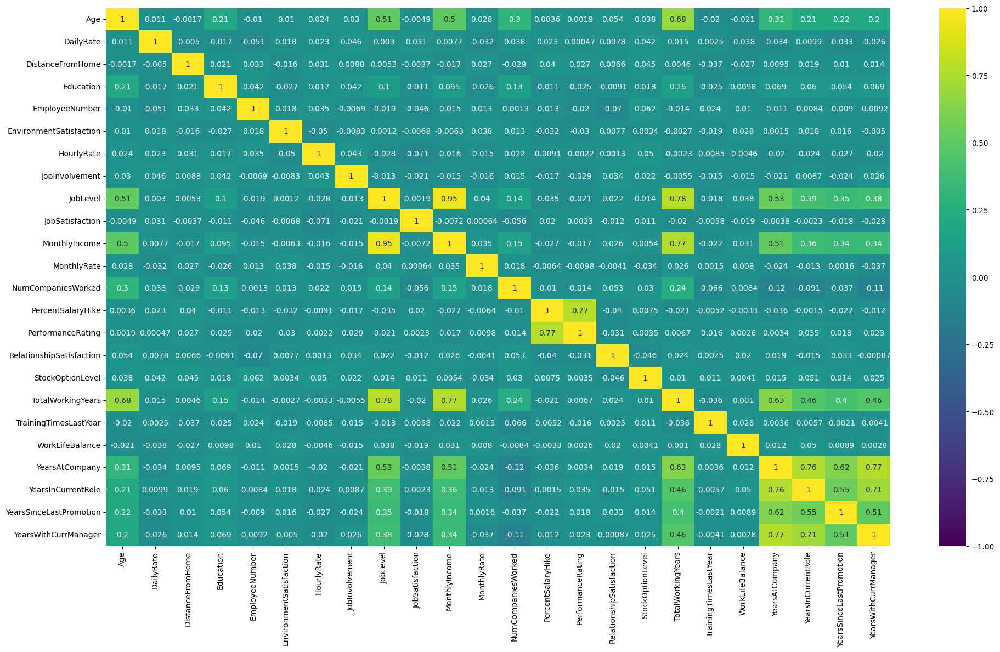

In [15]:
plt.figure(figsize=(20,12))
fig = sns.heatmap(df.corr(),annot=True,cmap='viridis',vmin=-1.0,vmax=1.0)
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

## Feature Engineering

### Feature Transformation

In [16]:
def apply_transform(transformer,col):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[col])
    plt.subplot(132)
    sns.boxplot(df[col])
    plt.subplot(133)
    probplot(df[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(df[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

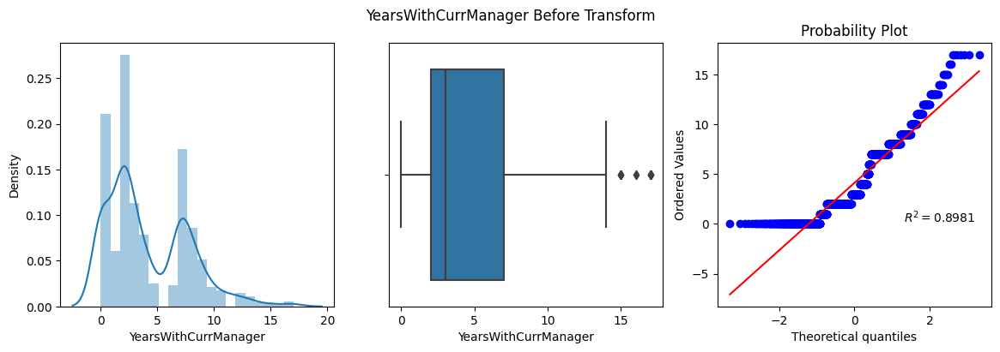

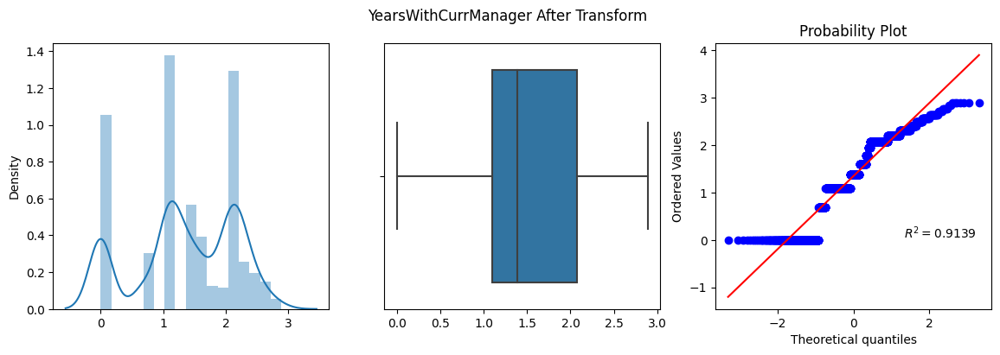

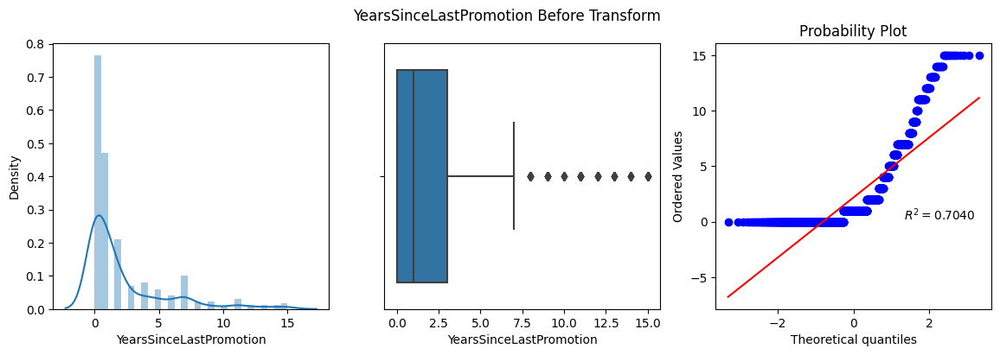

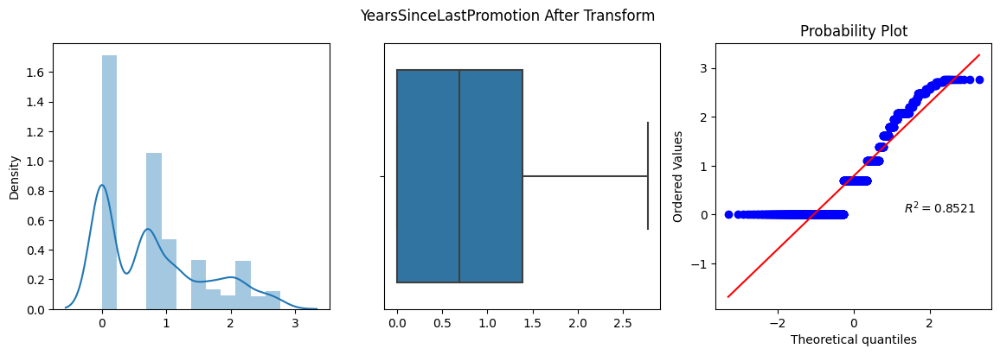

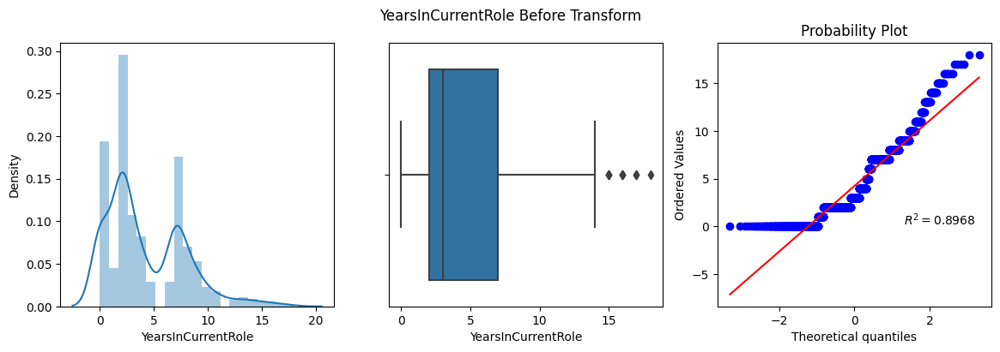

...

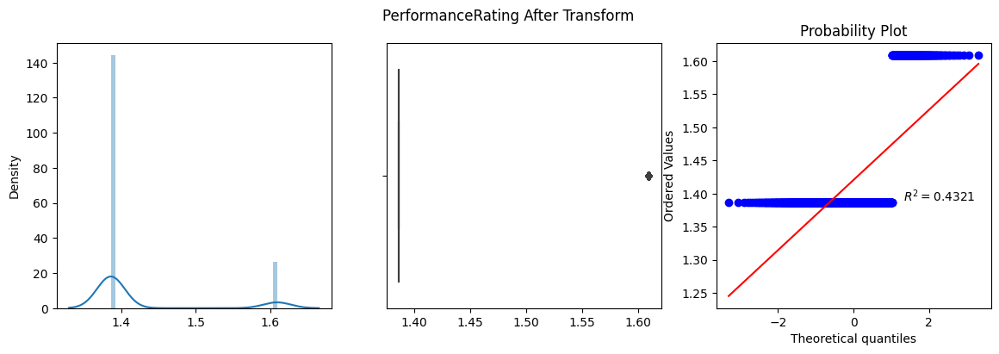

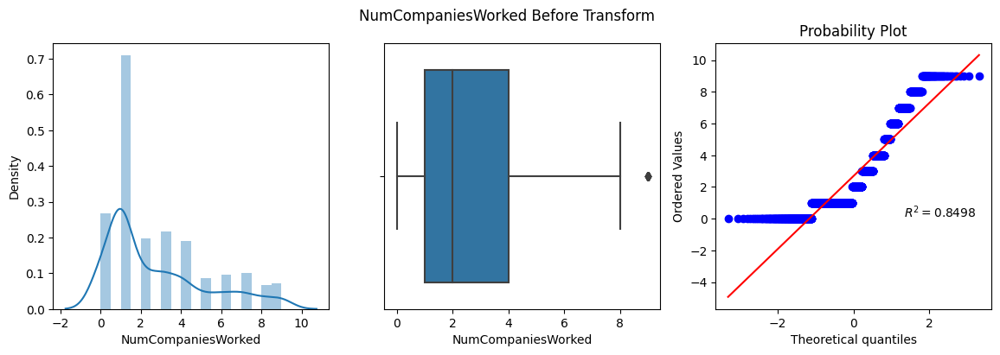

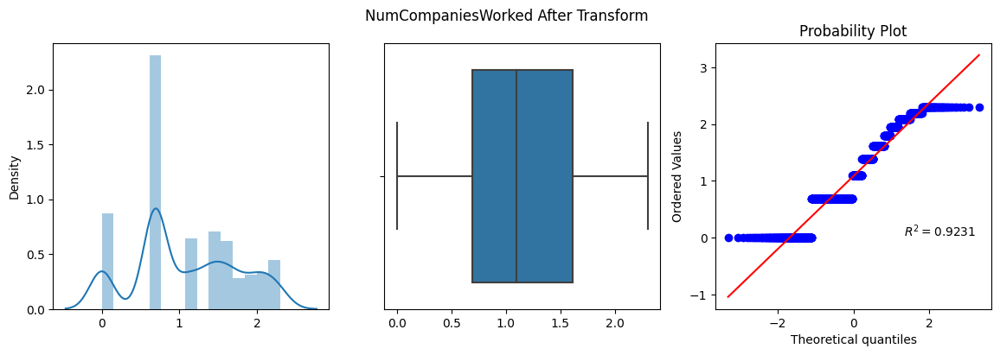

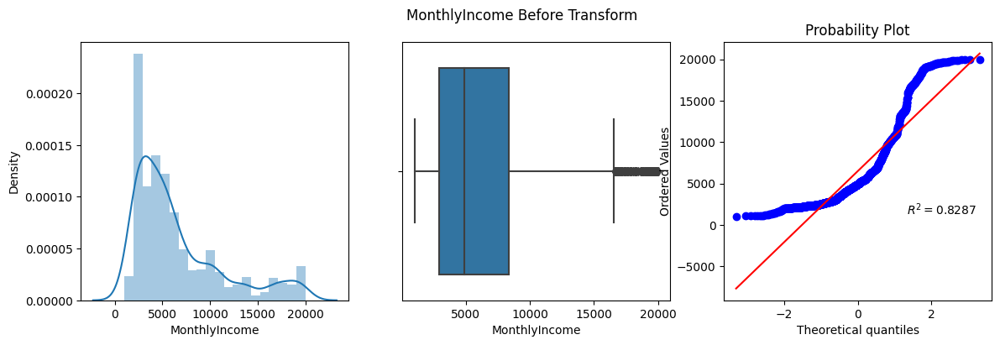

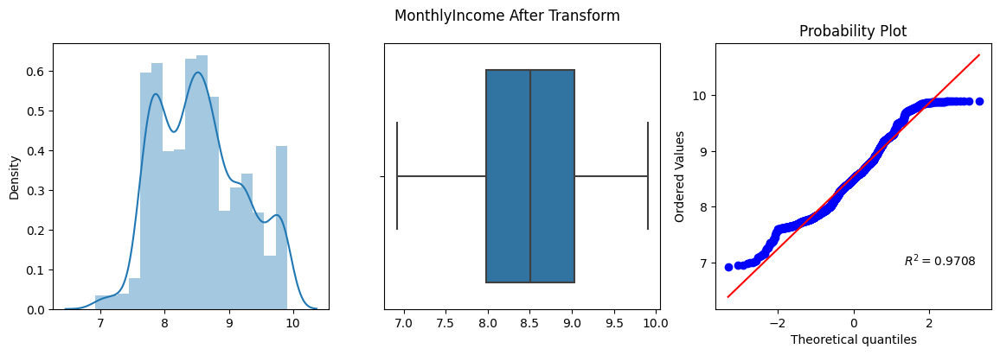

In [17]:
# Log Transform
for col in skewed_cols:
    apply_transform(FunctionTransformer(np.log1p),col)

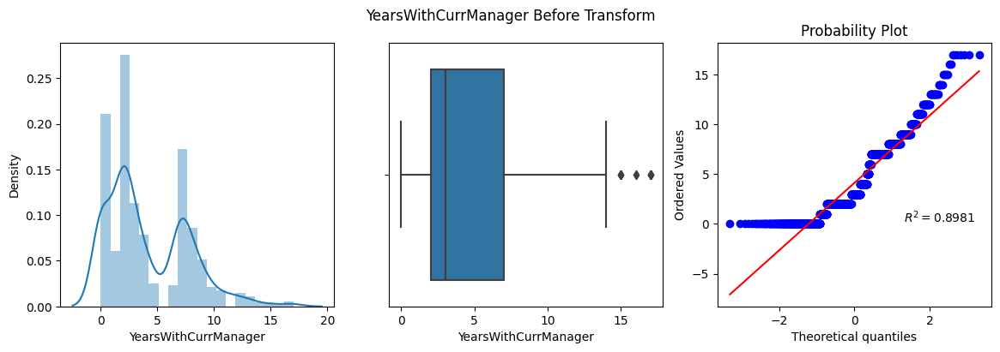

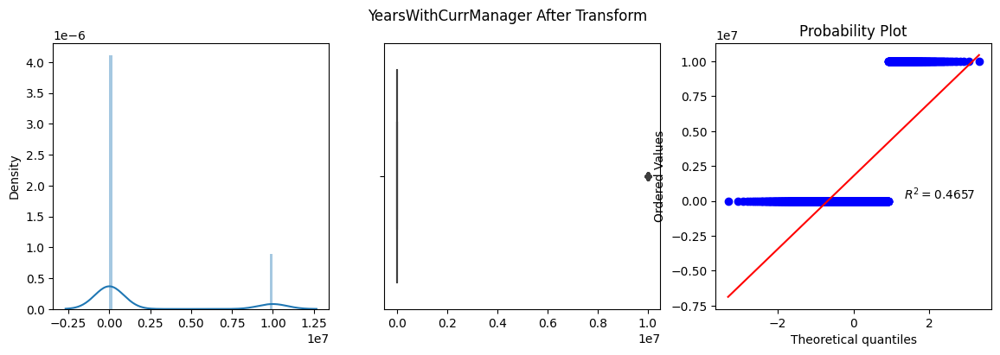

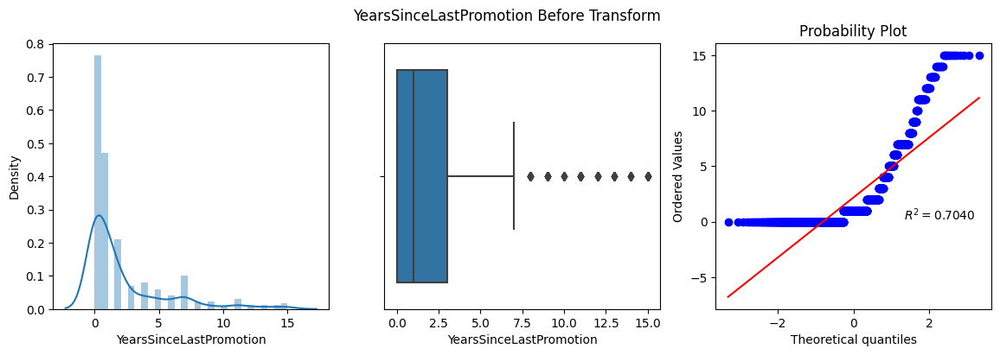

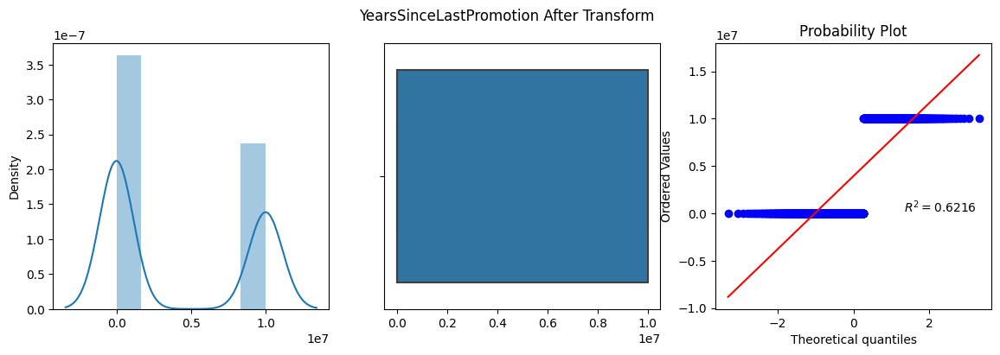

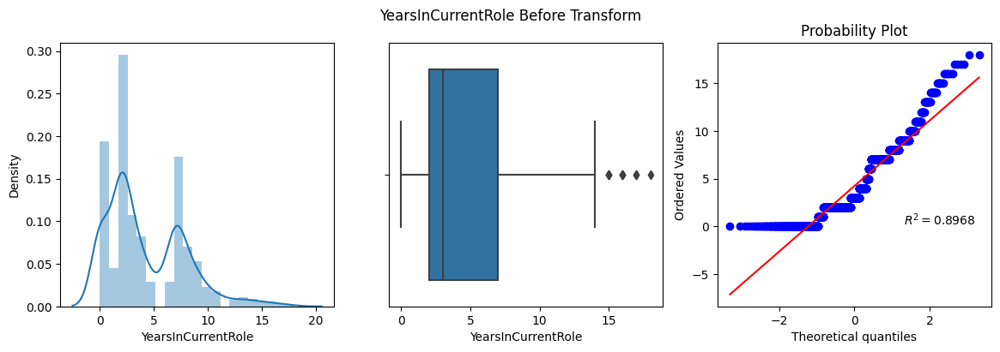

...

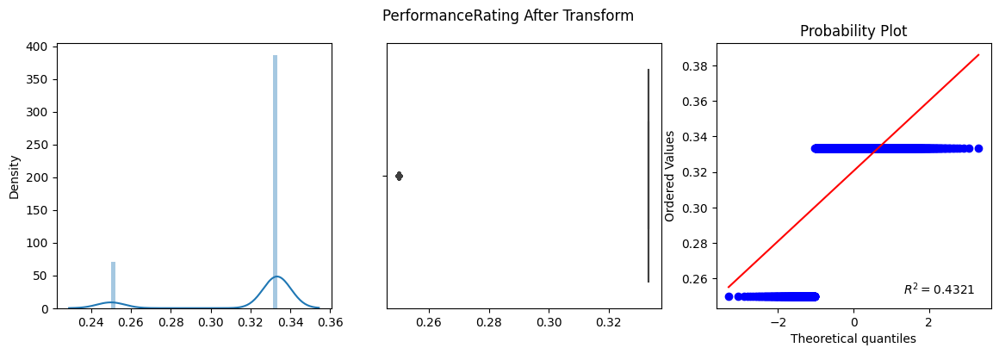

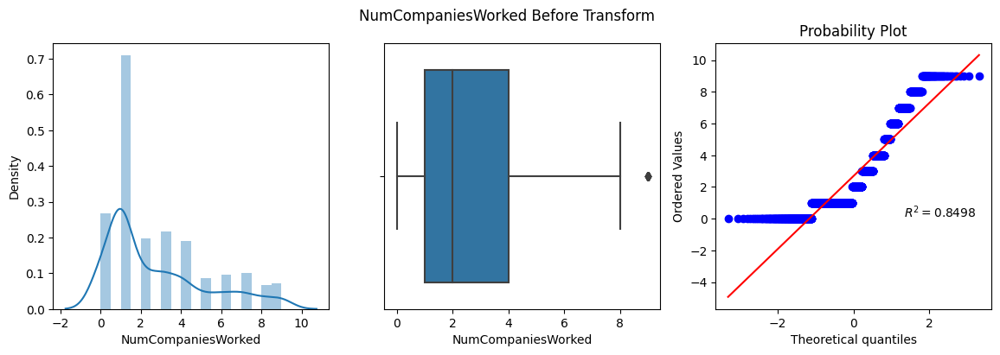

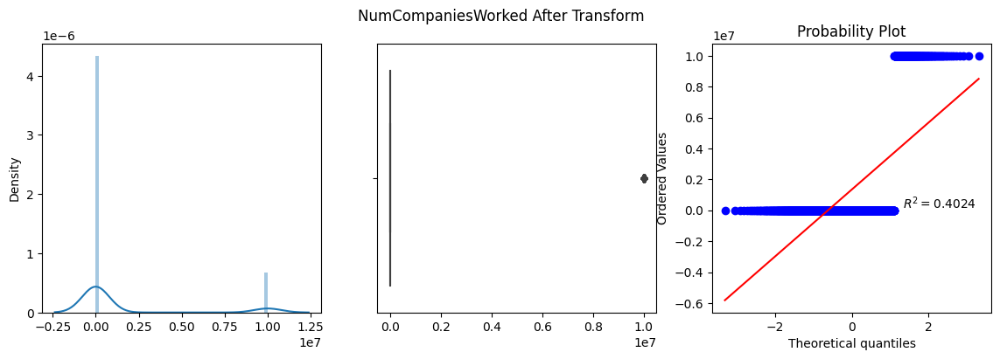

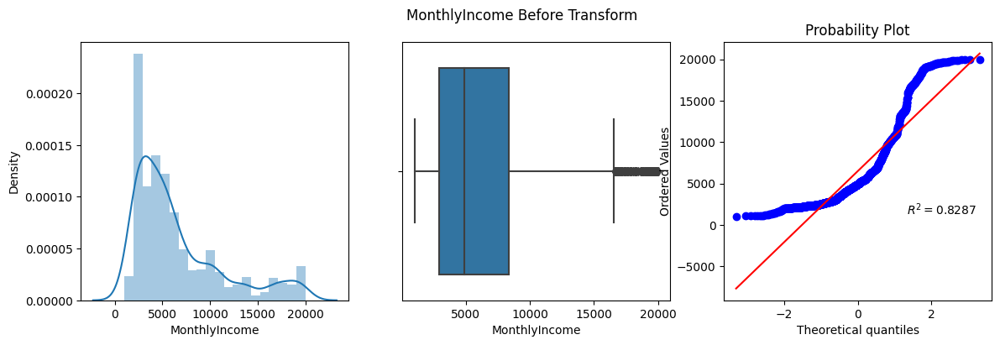

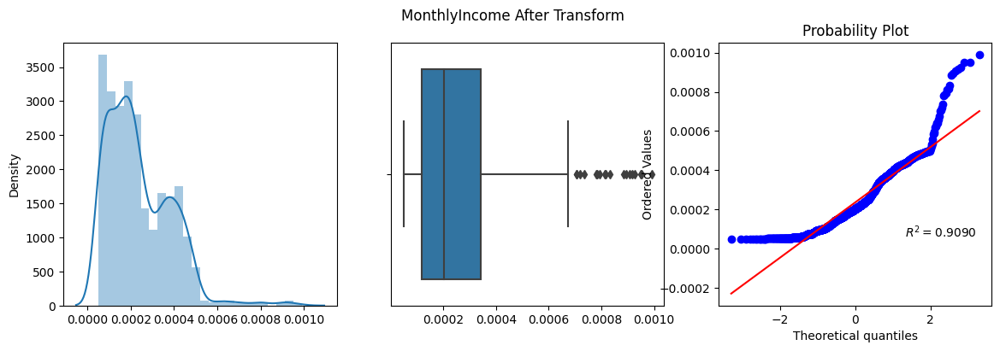

In [18]:
# Reciprocal Transform
for col in skewed_cols:
    apply_transform(FunctionTransformer(lambda x: 1/(x+0.0000001)),col)

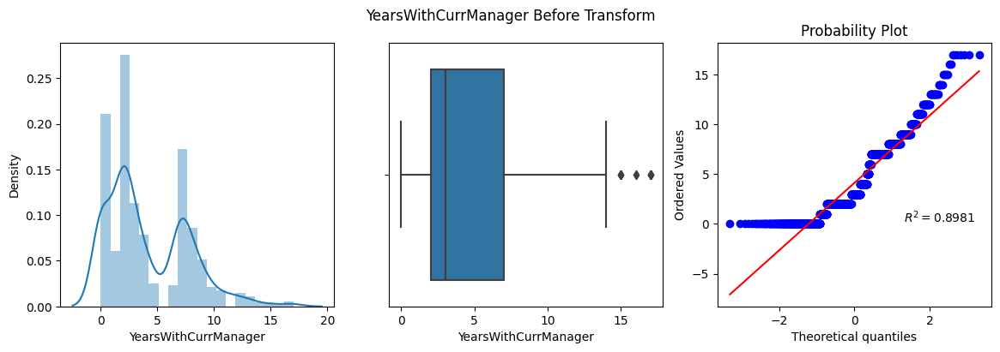

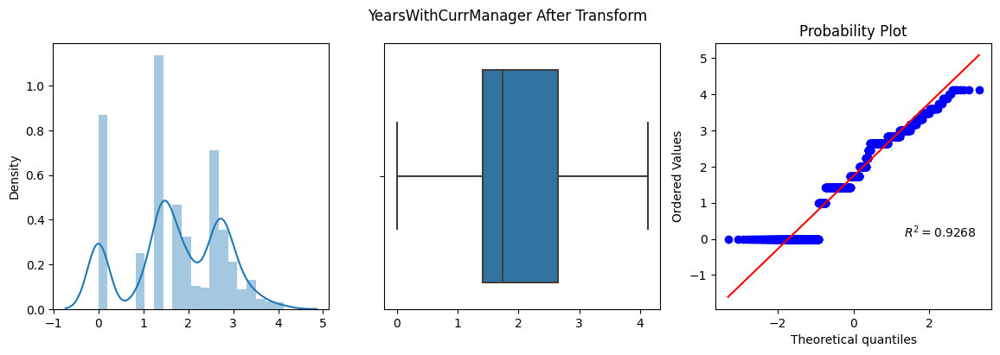

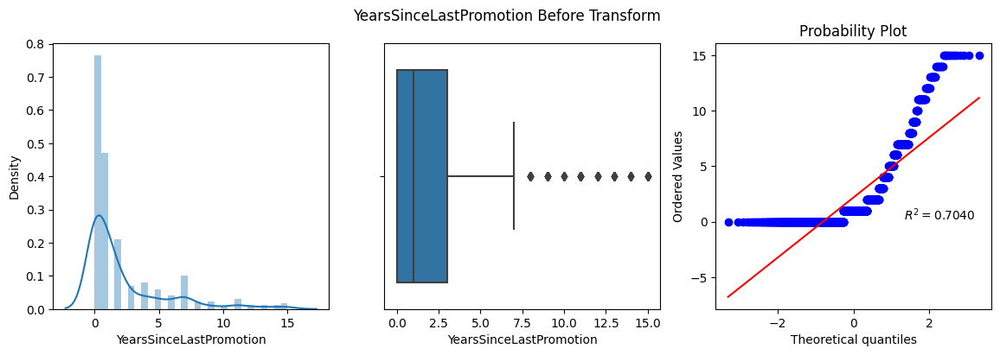

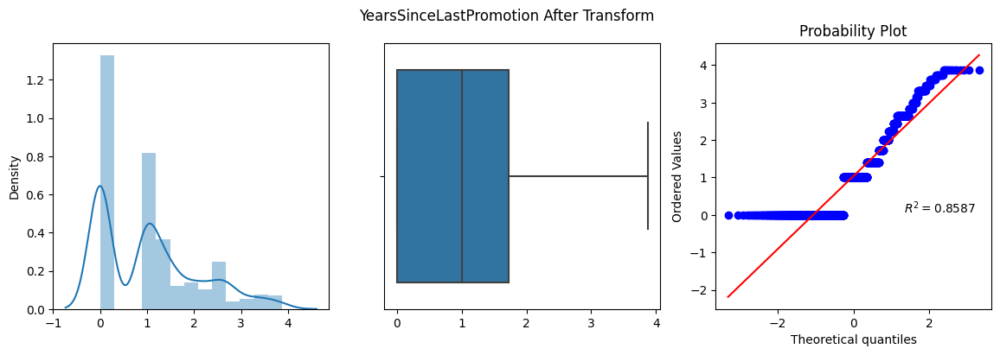

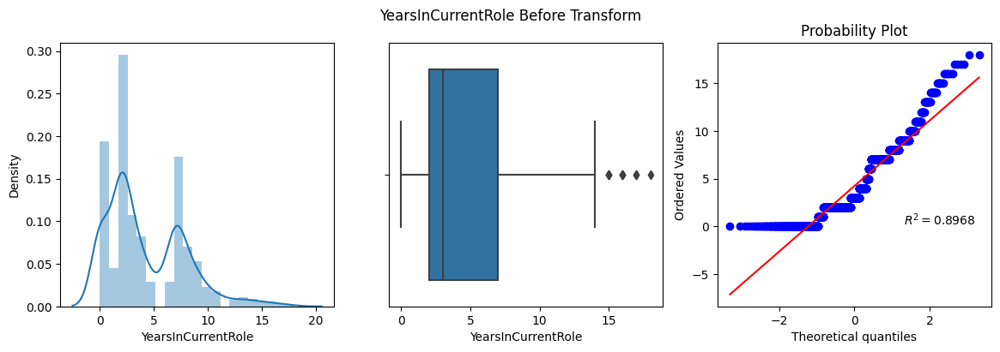

...

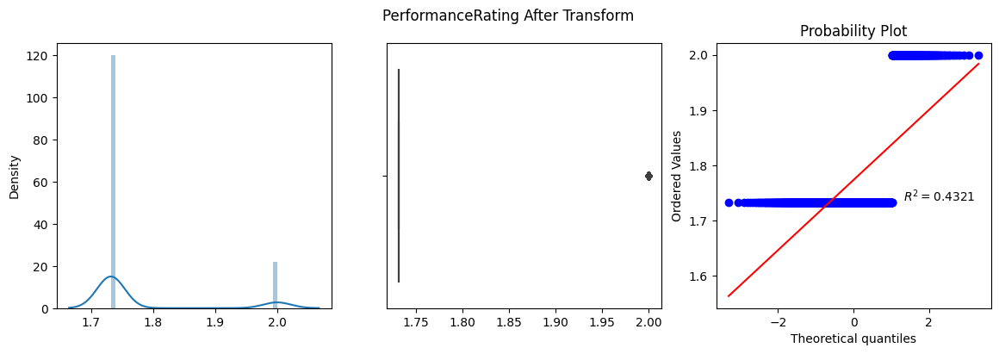

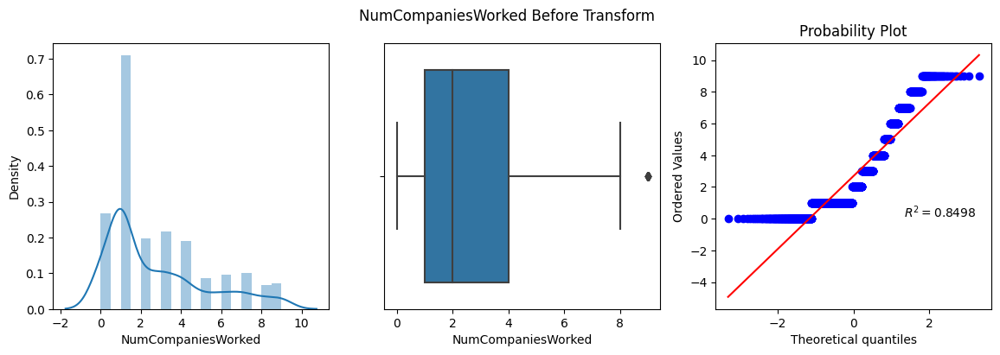

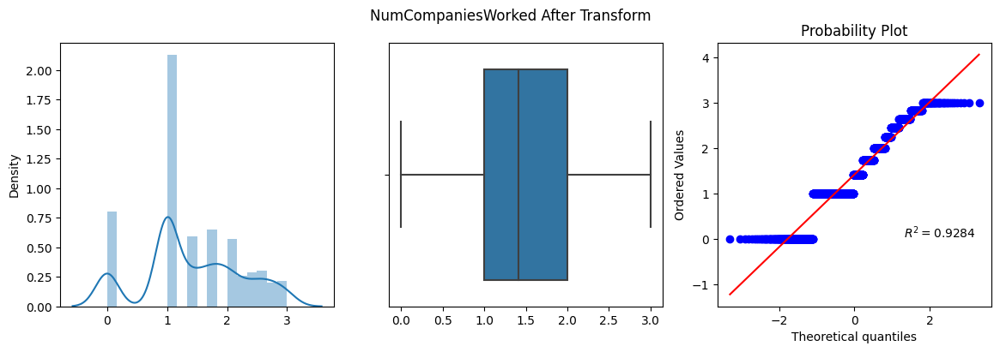

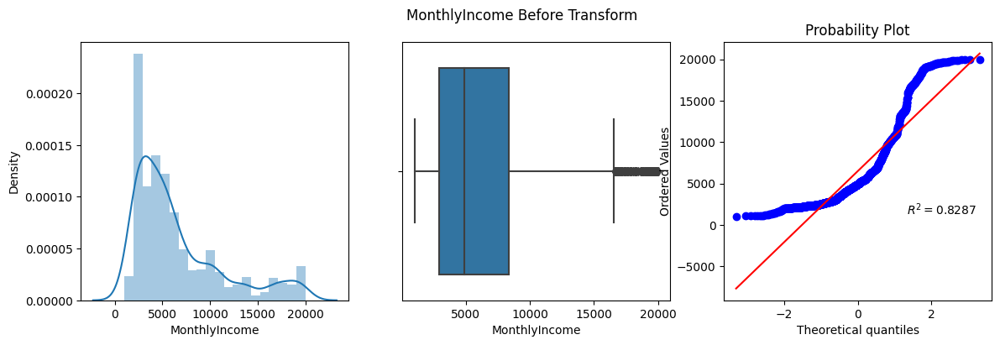

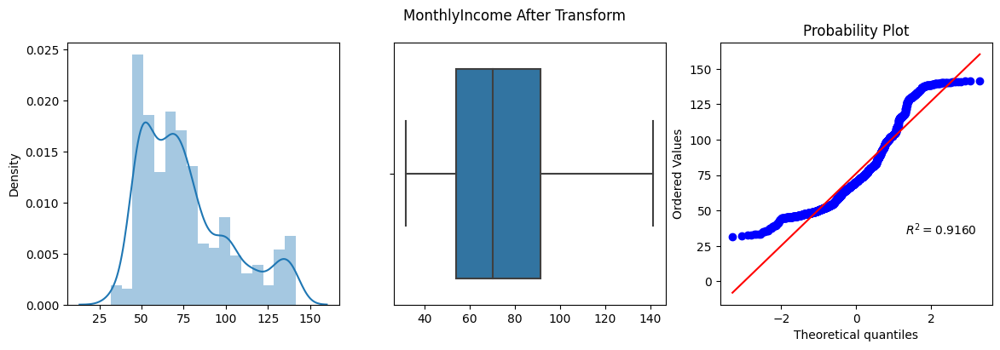

In [19]:
# Square Root Transform
for col in skewed_cols:
    apply_transform(FunctionTransformer(np.sqrt),col)

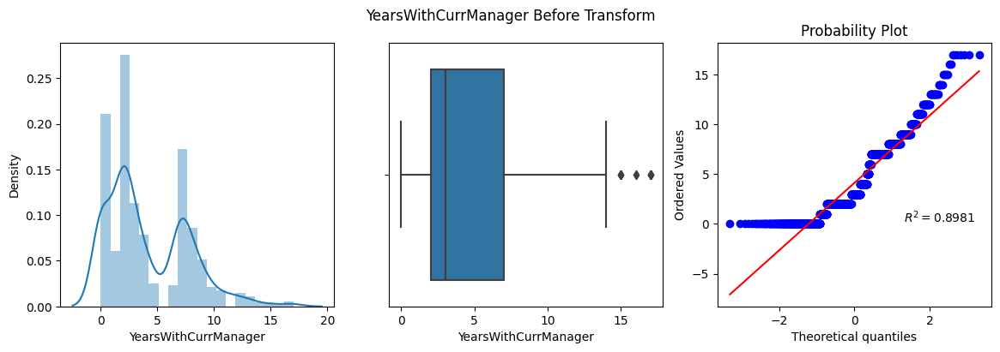

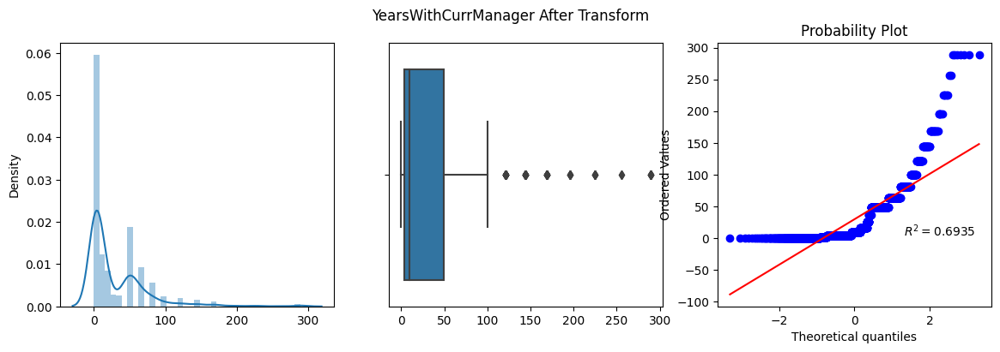

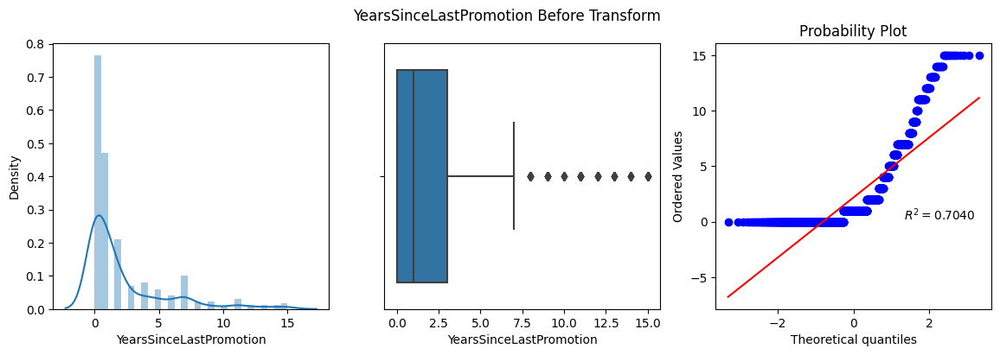

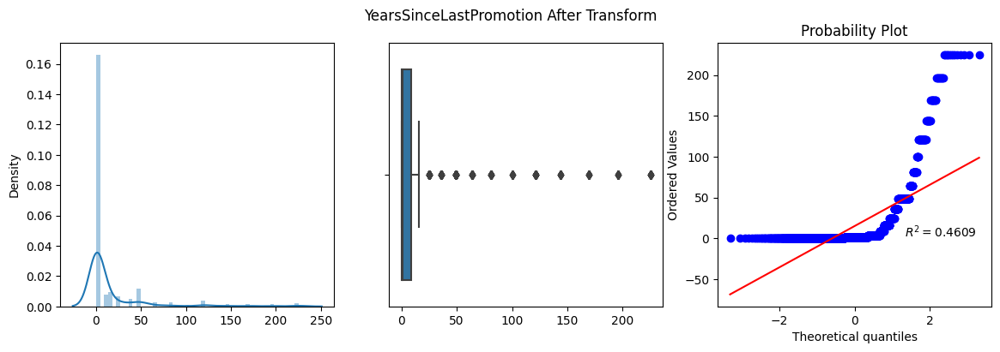

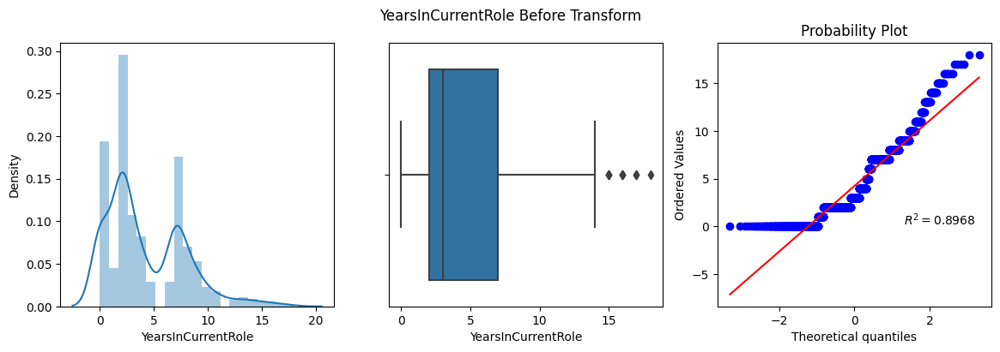

...

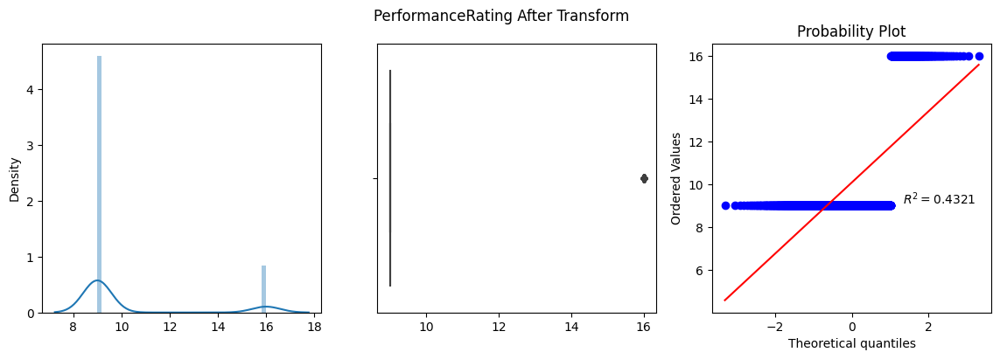

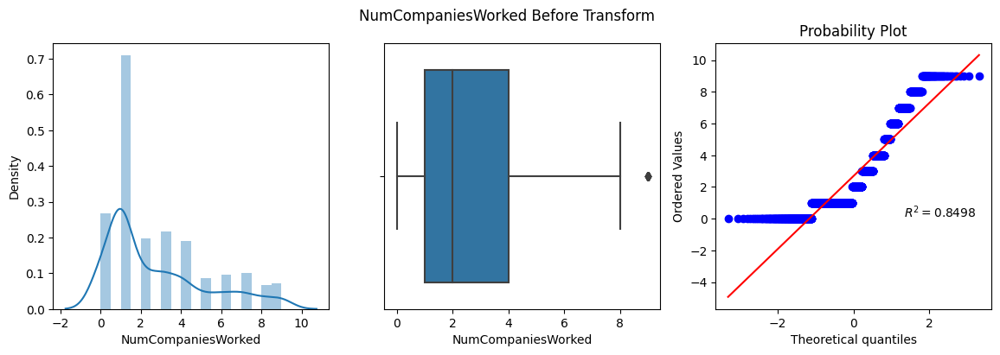

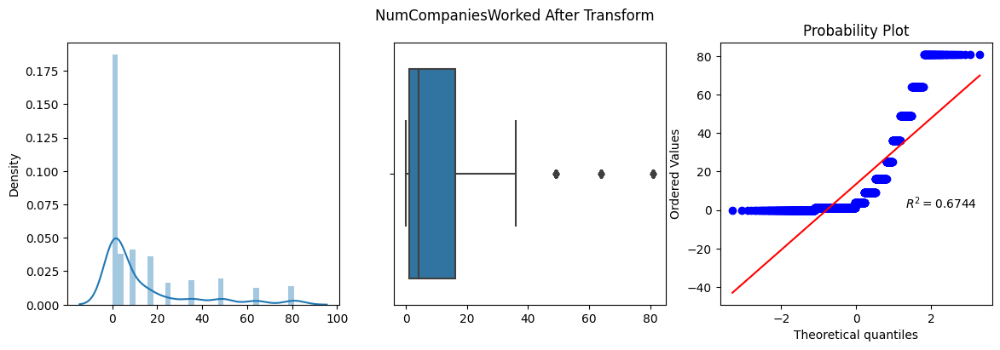

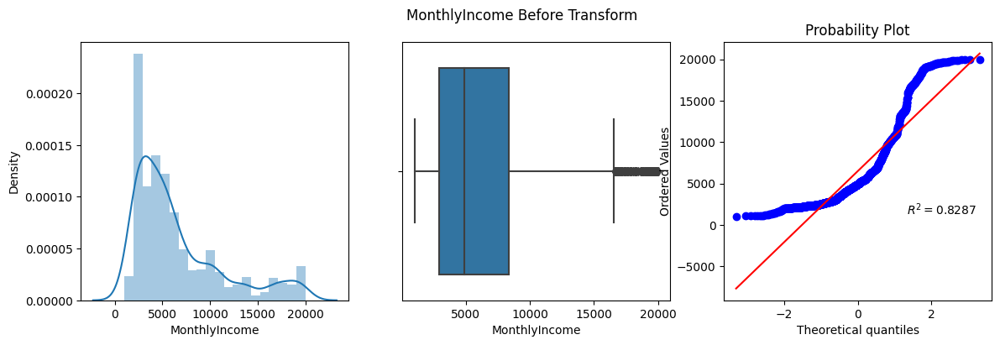

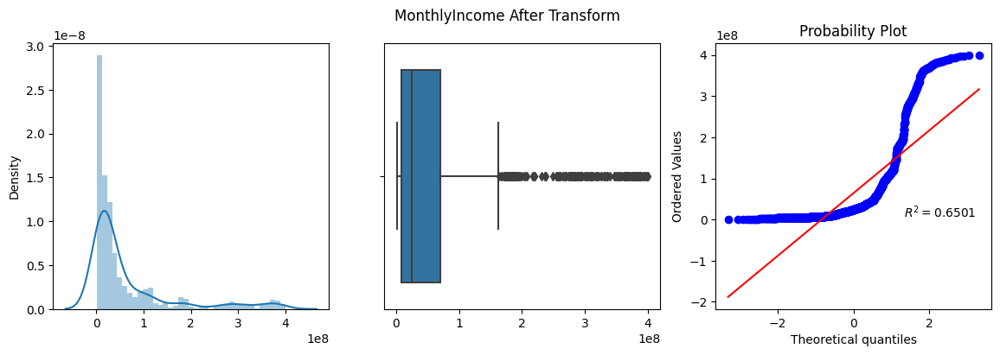

In [20]:
# Square Transform
for col in skewed_cols:
    apply_transform(FunctionTransformer(np.square),col)

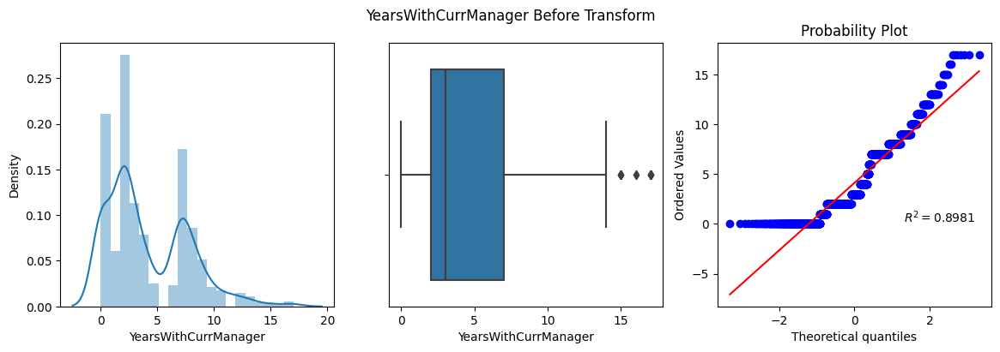

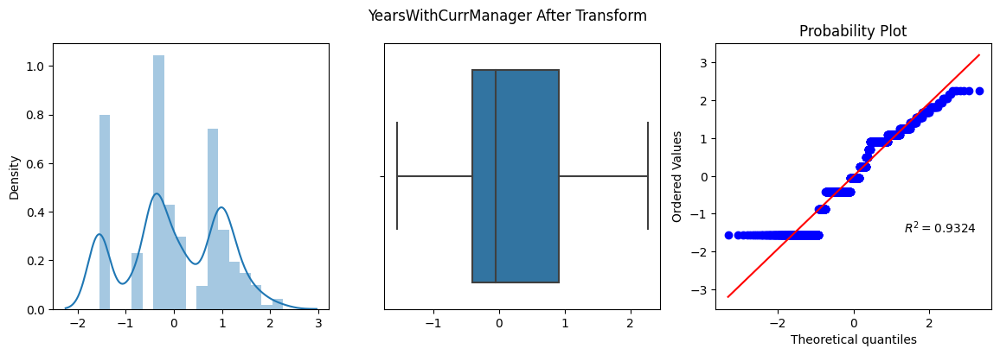

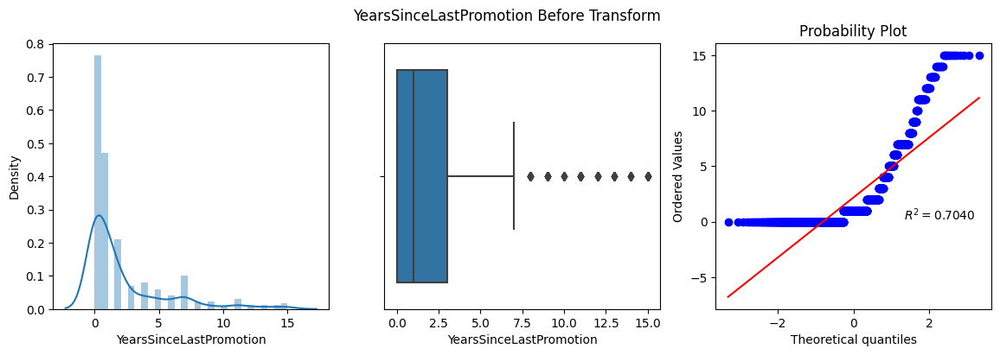

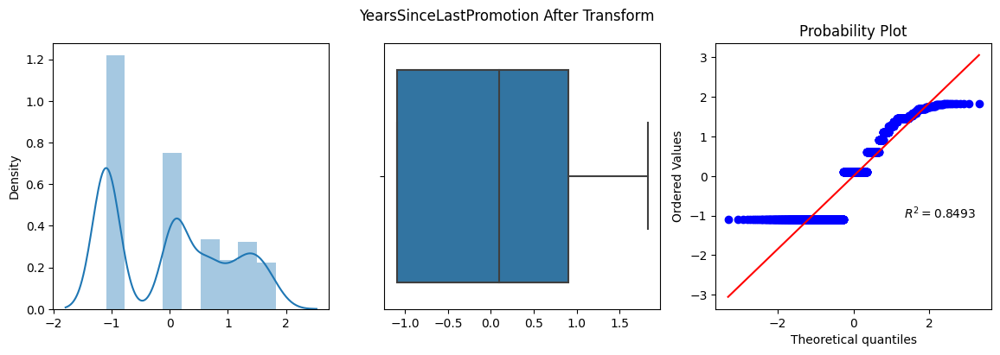

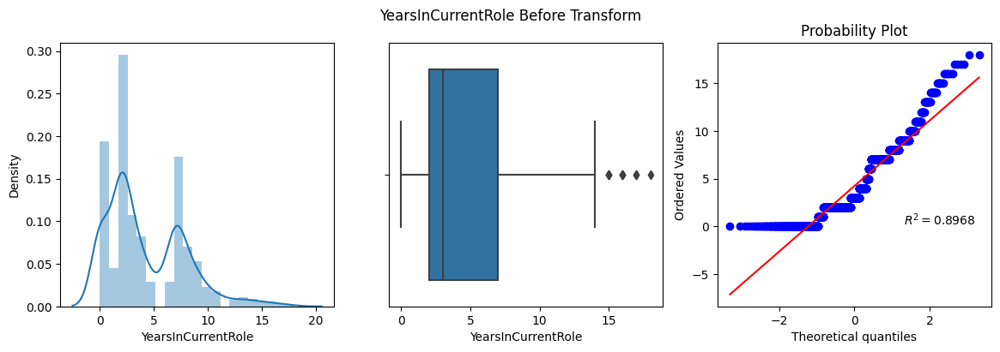

...

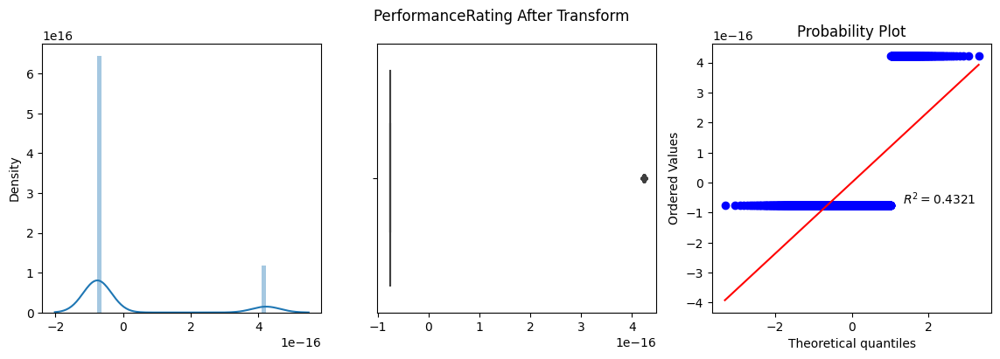

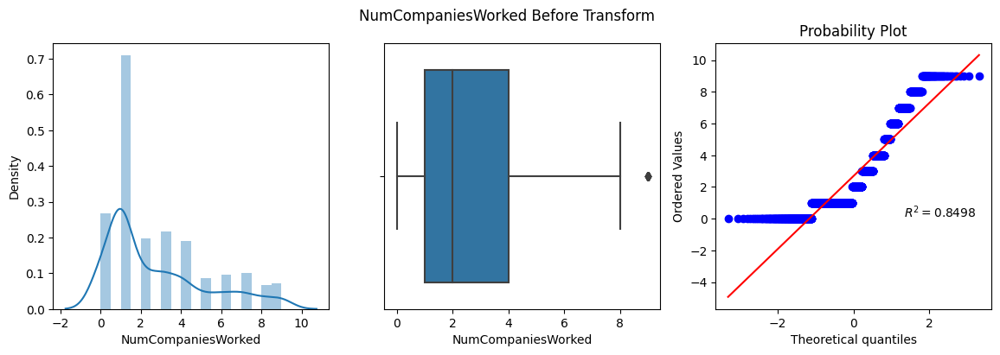

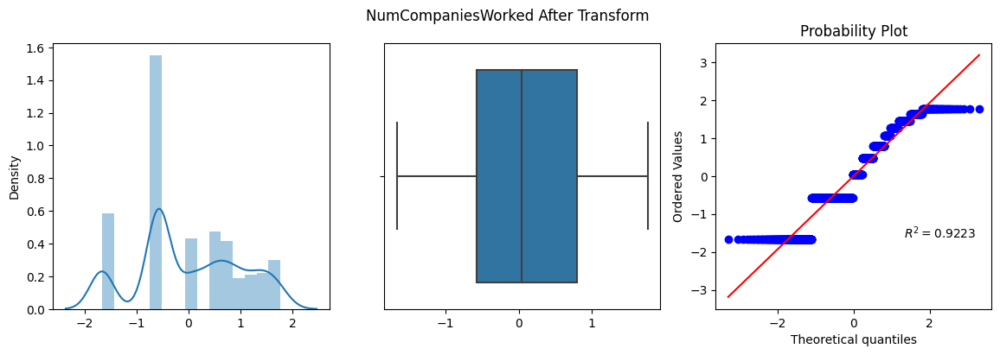

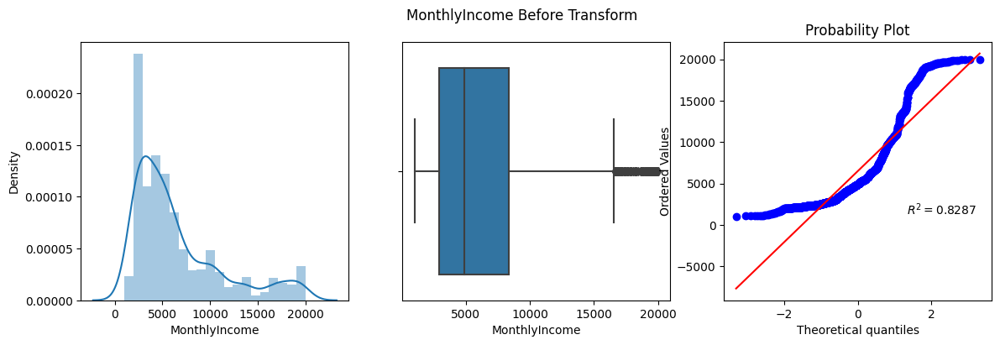

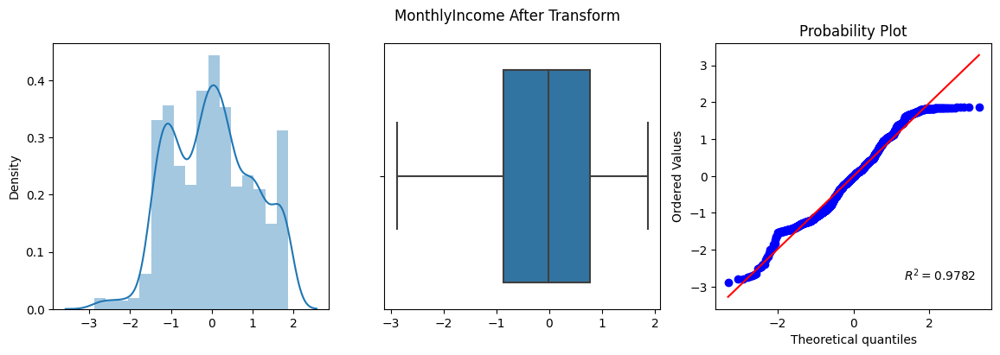

In [21]:
# Power Transform
for col in skewed_cols:
    apply_transform(PowerTransformer(),col)

YearsWithCurrManager: Power Transform <br>
YearsSinceLastPromotion: Square Root Transform <br>
YearsInCurrentRole: Power Transform <br>
YearsAtCompany: Power Transform <br>
TrainingTimesLastYear: Power Transform <br>
TotalWorkingYears: Power Transform <br>
StockOptionLevel: Log Transform <br>
PerformanceRating: None <br>
NumCompaniesWorked: Square Root Transform <br>
MonthlyIncome: Power Transform

In [22]:
skewed_cols.remove('PerformanceRating')

### Outlier Treatment

In [23]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

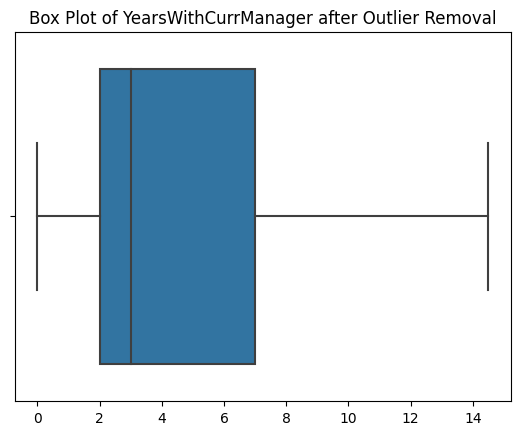

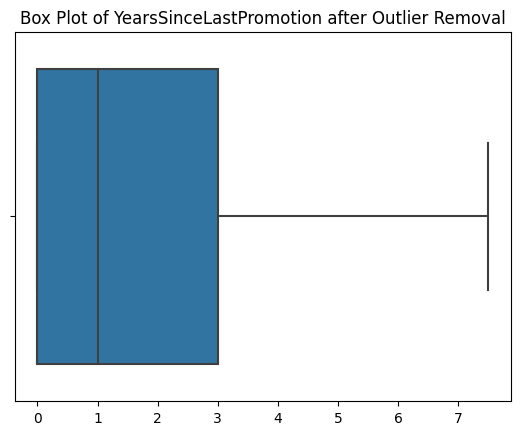

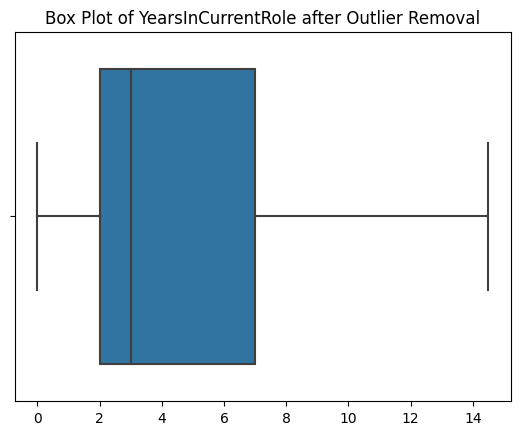

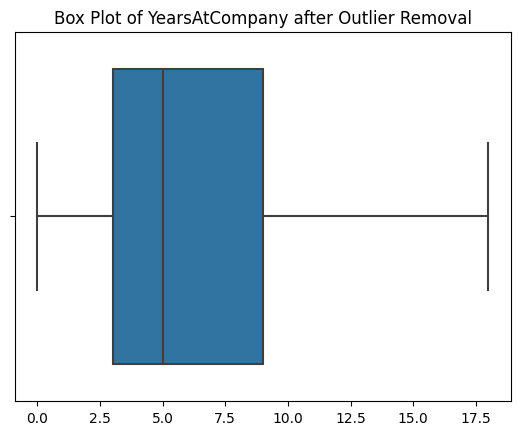

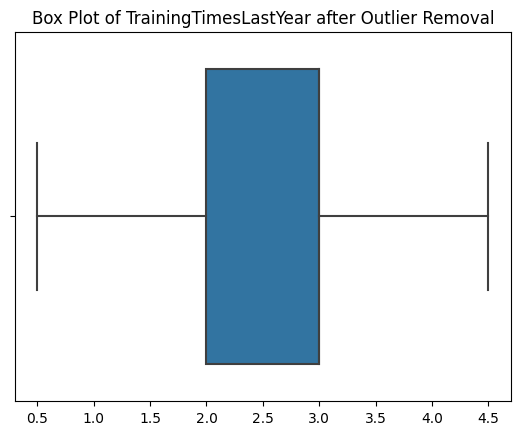

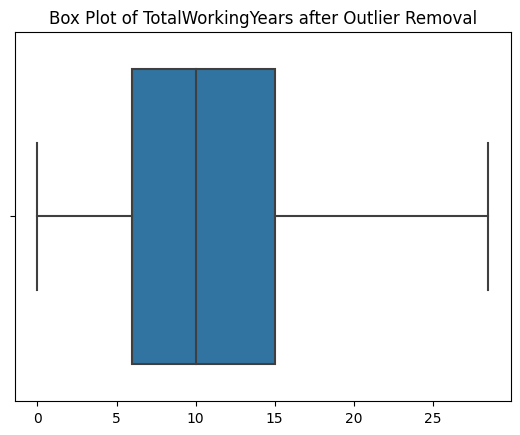

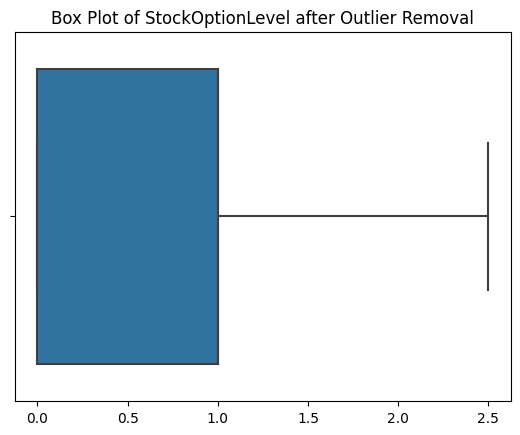

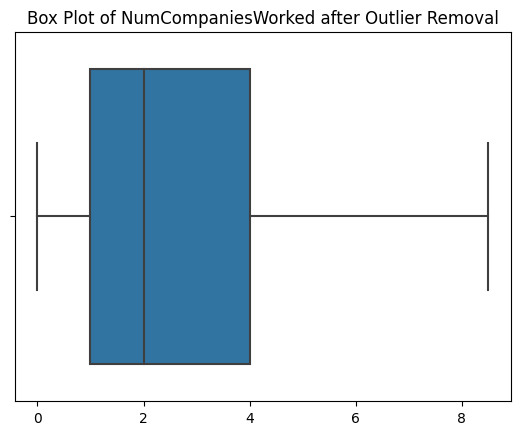

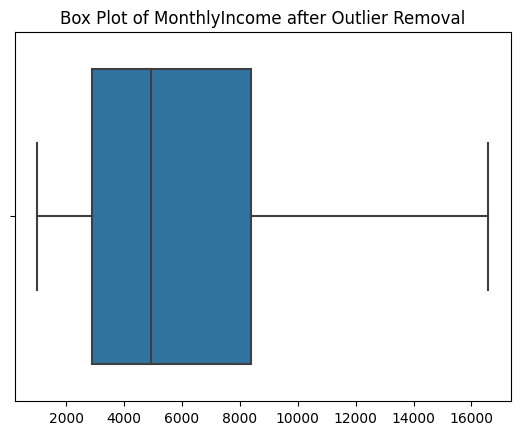

In [24]:
for col in skewed_cols:
    impute_outliers(df,col)

In [25]:
winsorizer = Winsorizer(capping_method='iqr',tail='both',fold=1.5)

for col in skewed_cols:
    df[col] = winsorizer.fit_transform(df[[col]])

### Categorical Encoding

In [26]:
df.select_dtypes(object).columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

In [27]:
df.BusinessTravel.unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [28]:
df.Department.unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [29]:
df.EducationField.unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [30]:
df.Gender.unique()

array(['Female', 'Male'], dtype=object)

In [31]:
df.JobRole.unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [32]:
df.MaritalStatus.unique()

array(['Single', 'Married', 'Divorced'], dtype=object)

In [33]:
df.Over18.unique()

array(['Y'], dtype=object)

In [34]:
# Since all employees are adults, we can drop the feature "Over18" as it has 0 variance.
df.drop('Over18',axis=1,inplace=True)

In [35]:
df.OverTime.unique()

array(['Yes', 'No'], dtype=object)

In [36]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [37]:
onehotencode_cols = ['OverTime','MaritalStatus','JobRole','Gender','EducationField','Department','BusinessTravel']

for col in onehotencode_cols:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

### Label Encoding

In [38]:
target_encoder = LabelEncoder()
df['Attrition'] = target_encoder.fit_transform(df['Attrition'])
df['Attrition']

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int32

In [39]:
label_mapping = {}

for idx, label in enumerate(target_encoder.classes_):
    label_mapping[idx] = label

label_mapping

{0: 'No', 1: 'Yes'}

### Feature Splitting

In [40]:
X = df.drop('Attrition',axis=1)
y = df['Attrition']

### Handling imbalanced target labels

In [41]:
smote = BorderlineSMOTE()
X, y = smote.fit_resample(X,y)

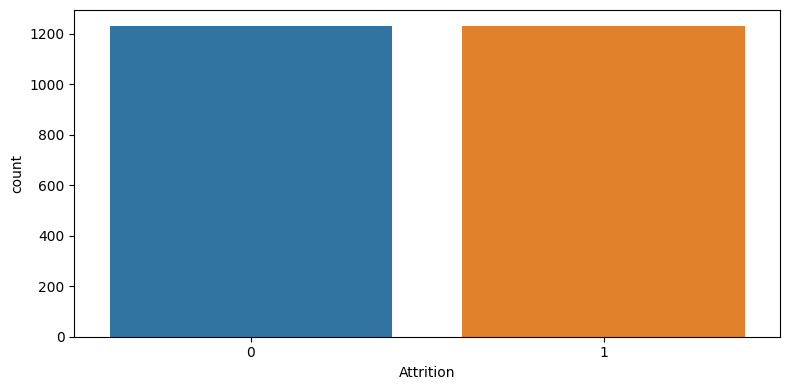

In [42]:
plt.figure(figsize=(8,4))
fig = sns.countplot(y)
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [43]:
print(Counter(y))

Counter({1: 1233, 0: 1233})


In [44]:
X.shape

(2466, 45)

### Performing train test split

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25,shuffle=True,random_state=75)

### Feature Selection

In [46]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [47]:
X_train.shape, X_test.shape

((1849, 41), (617, 41))

In [48]:
kbest = SelectKBest(k=10,score_func=chi2)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function chi2 at 0x0000017682E4EB90>)

In [49]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Age', 'DailyRate', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'JobLevel', 'MonthlyRate', 'TotalWorkingYears', 'YearsAtCompany',
       'OverTime_Yes', 'JobRole_Sales Representative'], dtype=object)

In [50]:
perc = SelectPercentile(percentile=20,score_func=chi2)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function chi2 at 0x0000017682E4EB90>)

In [51]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Age', 'DailyRate', 'EmployeeNumber', 'JobLevel', 'MonthlyRate',
       'TotalWorkingYears', 'YearsAtCompany', 'OverTime_Yes'],
      dtype=object)

In [52]:
lasso = SelectFromModel(estimator=Lasso(),max_features=10)
lasso.fit(X_train,y_train)

SelectFromModel(estimator=Lasso(), max_features=10)

In [53]:
selected_features = lasso.get_feature_names_out()
selected_features

array(['Age', 'DailyRate', 'EmployeeNumber'], dtype=object)

In [54]:
rf = RFE(estimator=RandomForestClassifier(),n_features_to_select=10,step=2,verbose=2)
rf.fit(X_train,y_train)

Fitting estimator with 41 features.
Fitting estimator with 39 features.
Fitting estimator with 37 features.
Fitting estimator with 35 features.
Fitting estimator with 33 features.
Fitting estimator with 31 features.
Fitting estimator with 29 features.
Fitting estimator with 27 features.
Fitting estimator with 25 features.
Fitting estimator with 23 features.
Fitting estimator with 21 features.
Fitting estimator with 19 features.
Fitting estimator with 17 features.
Fitting estimator with 15 features.
Fitting estimator with 13 features.
Fitting estimator with 11 features.


RFE(estimator=RandomForestClassifier(), n_features_to_select=10, step=2,
    verbose=2)

In [55]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Age', 'DailyRate', 'EmployeeNumber', 'MonthlyRate',
       'StockOptionLevel', 'TotalWorkingYears', 'OverTime_Yes',
       'MaritalStatus_Married', 'MaritalStatus_Single',
       'BusinessTravel_Travel_Frequently'], dtype=object)

In [56]:
sfs = SequentialFeatureSelector(estimator=RandomForestClassifier(),n_features_to_select=10,direction='forward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(estimator=RandomForestClassifier(),
                          n_features_to_select=10)

In [57]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['DailyRate', 'TotalWorkingYears', 'OverTime_Yes',
       'MaritalStatus_Married', 'MaritalStatus_Single',
       'JobRole_Human Resources', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'Department_Research & Development'], dtype=object)

In [58]:
xgb = XGBClassifier()
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [59]:
def plot_feature_importances(feat_imp_type):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())
    values = list(feat_imps.values())
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

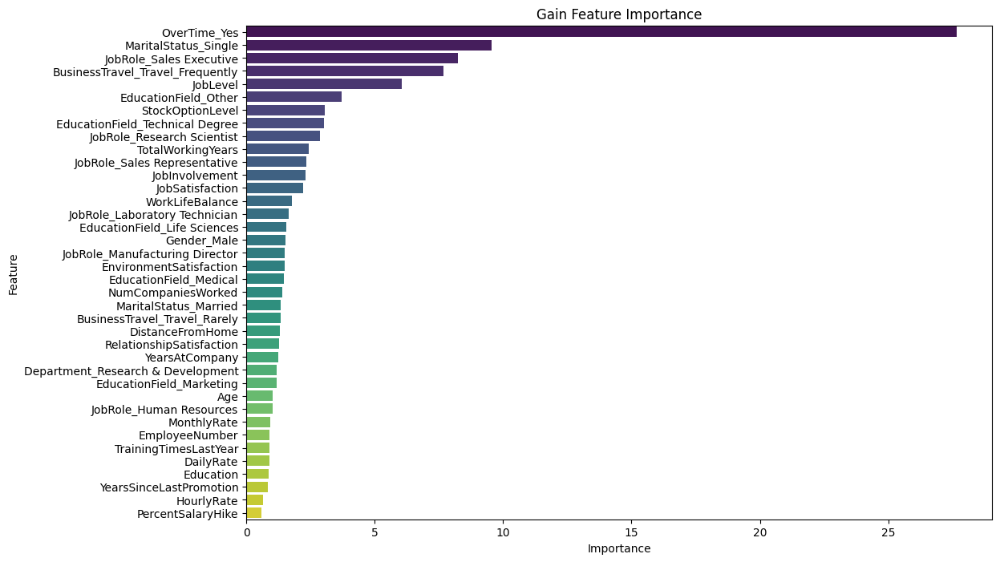

In [60]:
plot_feature_importances('gain')

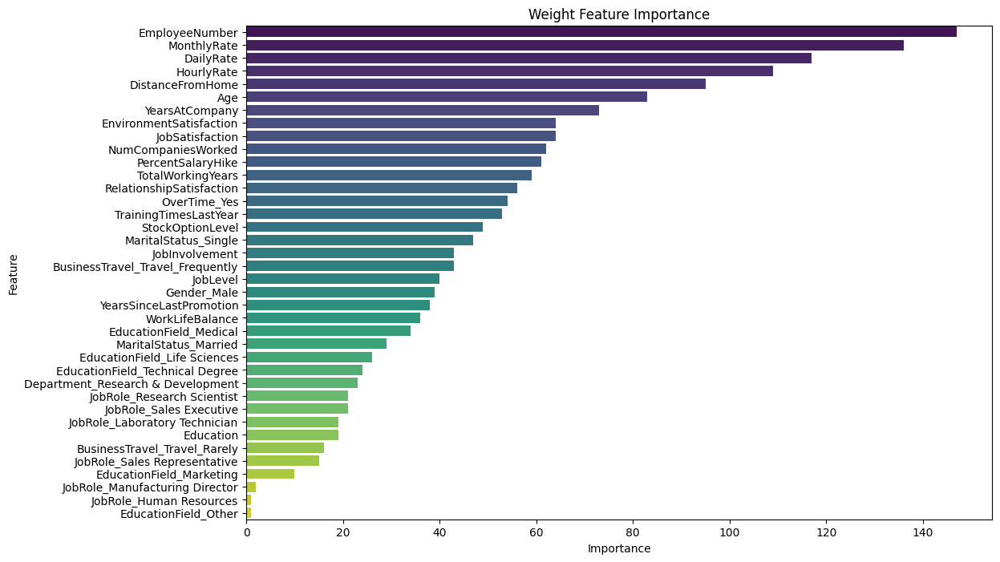

In [61]:
plot_feature_importances('weight')

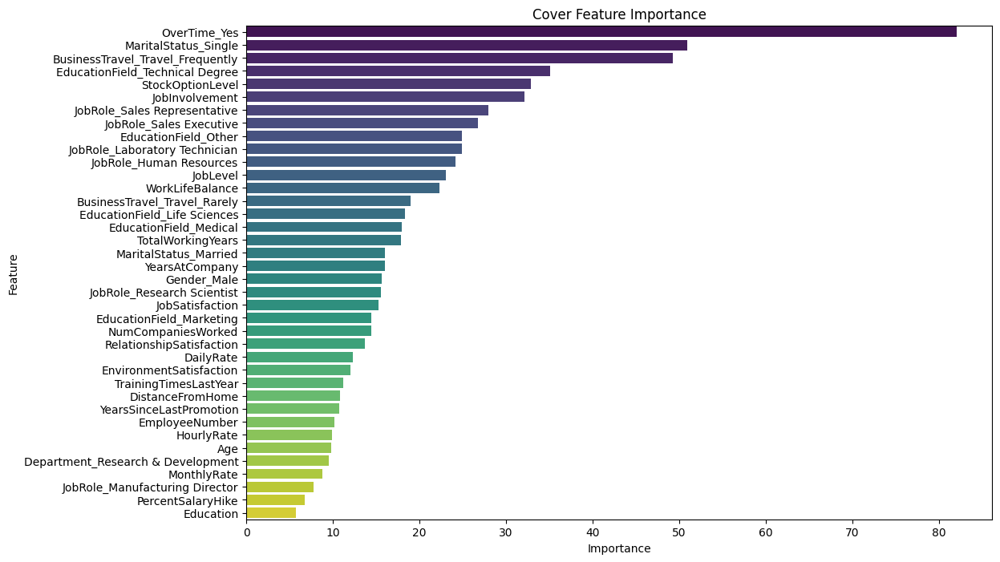

In [62]:
plot_feature_importances('cover')

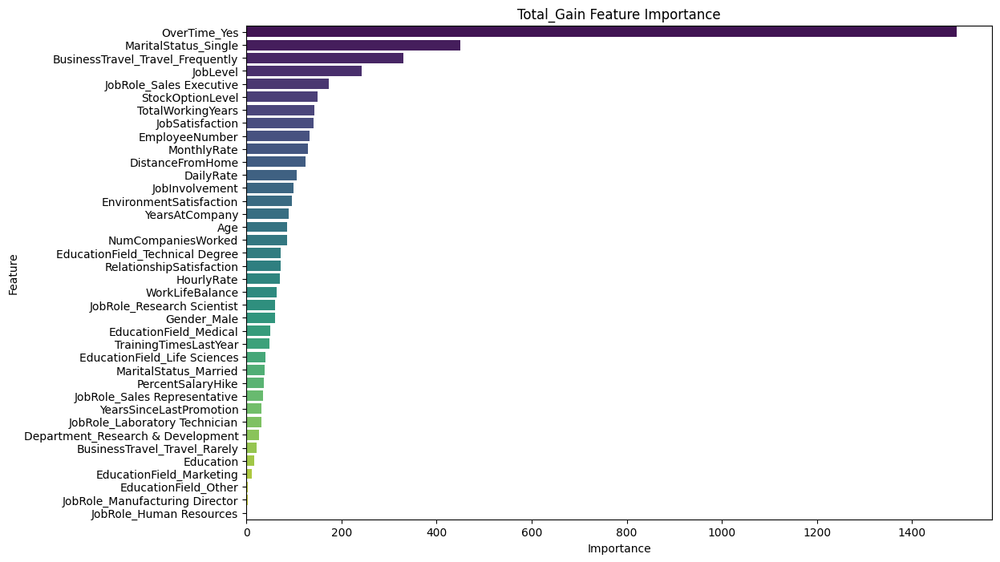

In [63]:
plot_feature_importances('total_gain')

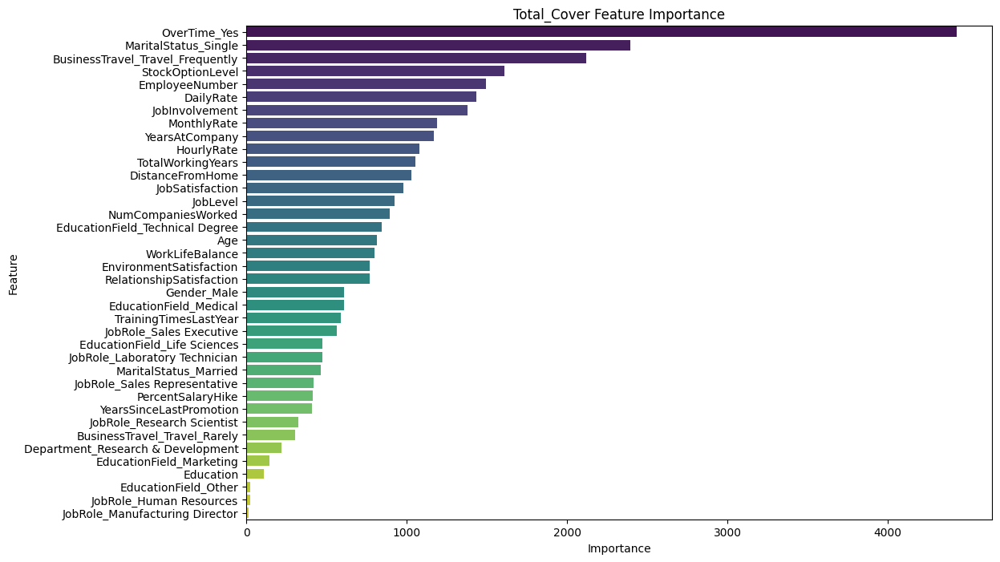

In [64]:
plot_feature_importances('total_cover')

In [65]:
final_selected_features = ['Age','DailyRate','DistanceFromHome','JobLevel','MonthlyRate','OverTime_Yes','YearsAtCompany','TotalWorkingYears','MaritalStatus_Single','StockOptionLevel']
len(final_selected_features)

10

In [66]:
final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [67]:
gc.collect()

0

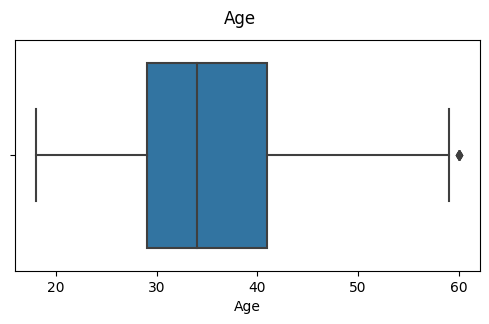

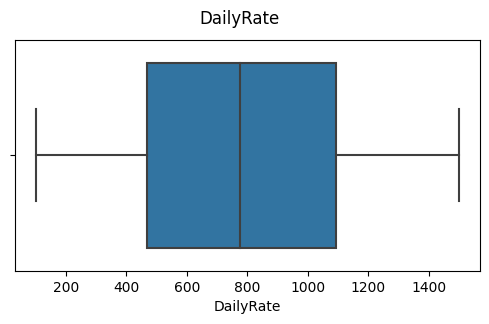

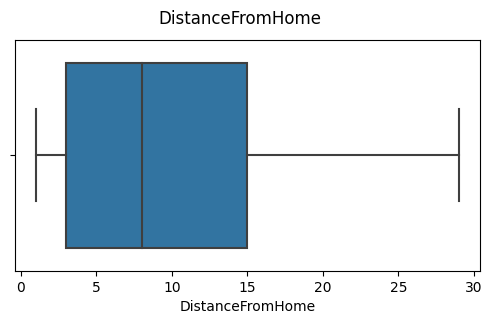

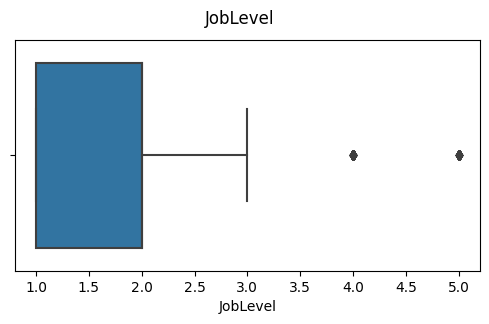

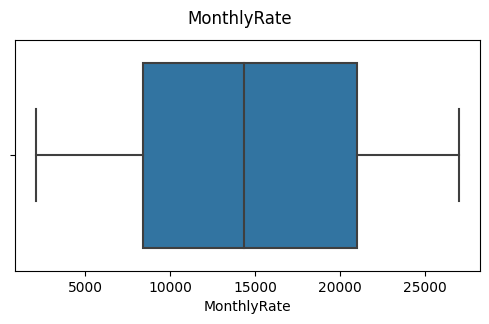

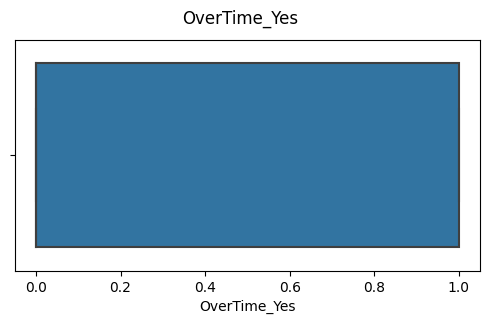

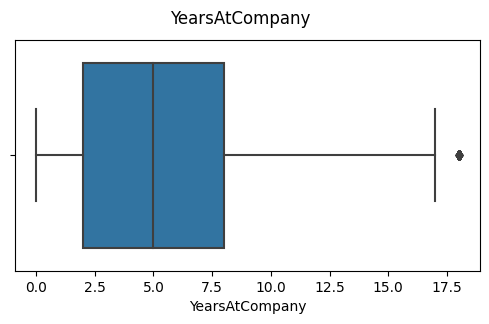

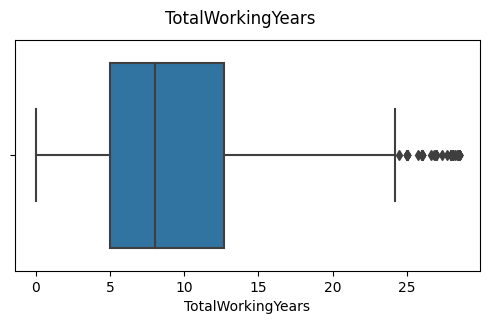

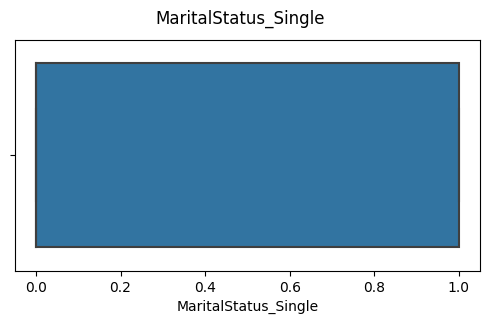

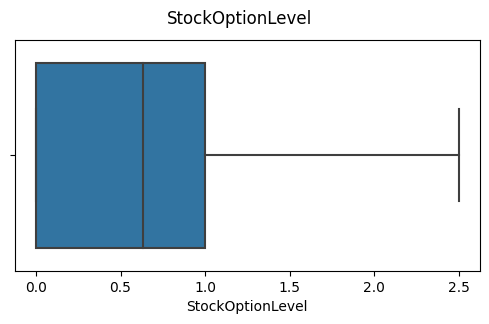

In [68]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

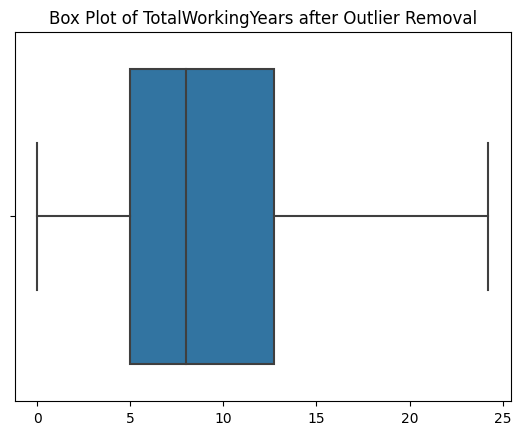

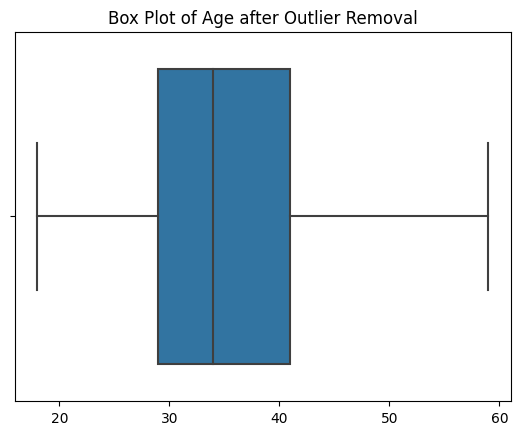

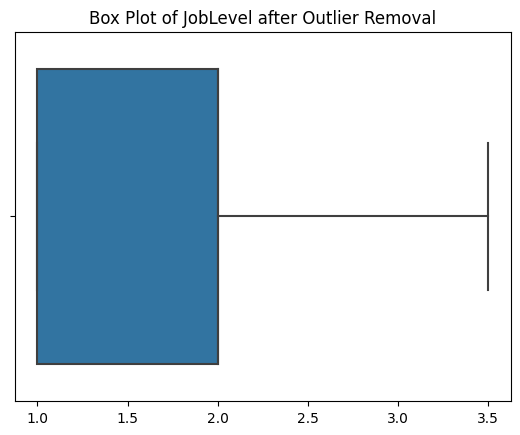

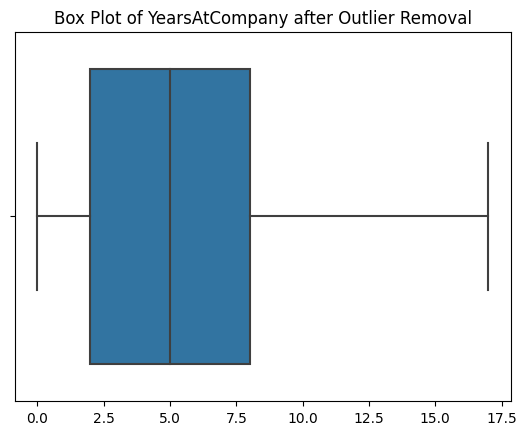

In [69]:
outlier_cols = ['TotalWorkingYears','Age','JobLevel','YearsAtCompany']

for col in outlier_cols:
    impute_outliers(final_X_train,col)

In [70]:
winsorizer = Winsorizer(capping_method='iqr',tail='both',fold=1.5)

for col in outlier_cols:
    final_X_train[col] = winsorizer.fit_transform(final_X_train[[col]])
    final_X_test[col] = winsorizer.transform(final_X_test[[col]])

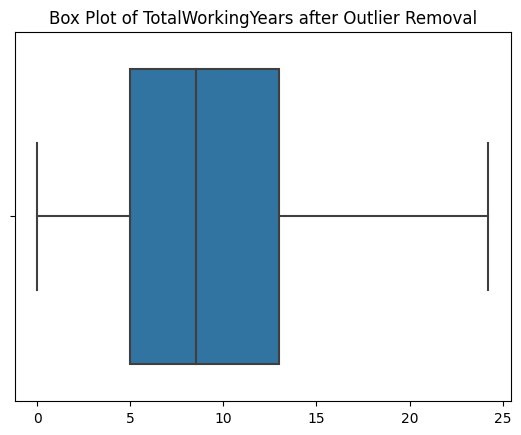

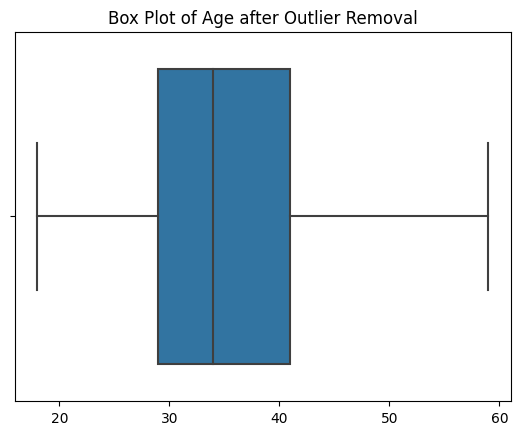

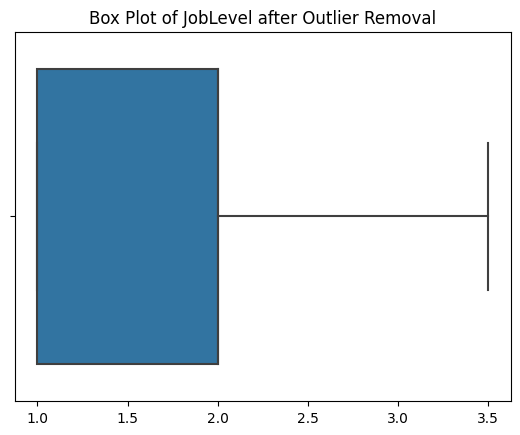

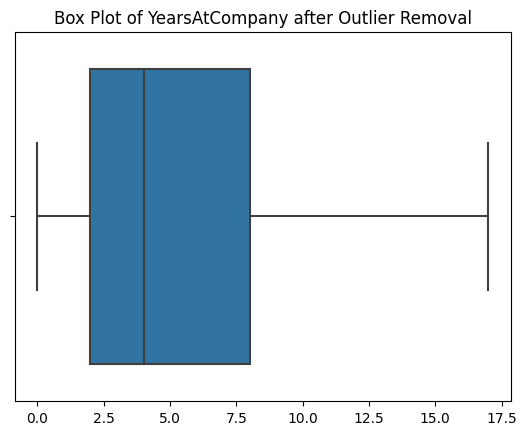

In [71]:
for col in outlier_cols:
    impute_outliers(final_X_test,col)

### Feature Scaling

In [72]:
scaler = StandardScaler()
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Age,DailyRate,DistanceFromHome,JobLevel,MonthlyRate,OverTime_Yes,YearsAtCompany,TotalWorkingYears,MaritalStatus_Single,StockOptionLevel
0,1.662849,0.484172,-0.597415,1.484097,1.009014,1.041478,0.294484,0.218473,1.071935,-0.594108
1,0.876274,-0.510597,0.580079,2.074860,-1.284969,-0.875941,-0.358395,1.953986,-0.865851,0.419790
2,0.426803,0.301135,-0.597415,0.302570,-1.544857,-0.875941,-1.011274,1.486354,-0.865851,0.419790
3,-0.696875,-0.831577,0.318414,-0.878956,-1.571612,0.969320,-0.793648,-0.900659,-0.865851,1.912918
4,-0.247404,-1.683099,-0.728247,-0.878956,-0.163479,-0.875941,-0.576021,-0.384172,-0.865851,-0.927532


In [73]:
final_X_test.head()

,Age,DailyRate,DistanceFromHome,JobLevel,MonthlyRate,OverTime_Yes,YearsAtCompany,TotalWorkingYears,MaritalStatus_Single,StockOptionLevel
0,2.112320,-0.619359,-0.204917,0.302570,1.255106,-0.875941,-1.011274,1.486354,1.345566,-0.927532
1,-0.696875,-0.990740,1.757573,1.484097,-0.454163,-0.875941,1.164989,0.239337,-0.865851,0.419790
2,-0.359771,1.484247,0.318414,0.302570,1.308477,-0.519236,-0.358395,-0.565459,-0.865851,-0.707899
3,-0.247404,-1.760028,0.841744,0.302570,1.684165,-0.875941,-0.576021,-0.540049,1.345566,-0.927532
4,0.651539,-1.417827,-0.335750,2.074860,0.816989,-0.875941,2.470747,1.798108,-0.865851,1.767112


## Model Training & Evaluation

In [74]:
models = []
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []
roc_auc_scores = []

In [75]:
def train_and_evaluate_model(model):
    model.fit(final_X_train,y_train)
    y_pred = model.predict(final_X_test)
    print("Classification Report:")
    print(classification_report(y_test,y_pred))
    print('-'*50)
    ConfusionMatrixDisplay.from_predictions(y_test,y_pred)
    PrecisionRecallDisplay.from_predictions(y_test,y_pred)
    RocCurveDisplay.from_predictions(y_test,y_pred)
    acc = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred,average='macro')
    recall = recall_score(y_test,y_pred,average='macro')
    f1 = f1_score(y_test,y_pred,average='macro')
    roc_auc = roc_auc_score(y_test,y_pred,average='macro')
    accuracy_scores.append(acc)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)
    roc_auc_scores.append(roc_auc)
    models.append(model)
    gc.collect()

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       303
           1       0.76      0.76      0.76       314

    accuracy                           0.76       617
   macro avg       0.76      0.76      0.76       617
weighted avg       0.76      0.76      0.76       617

--------------------------------------------------


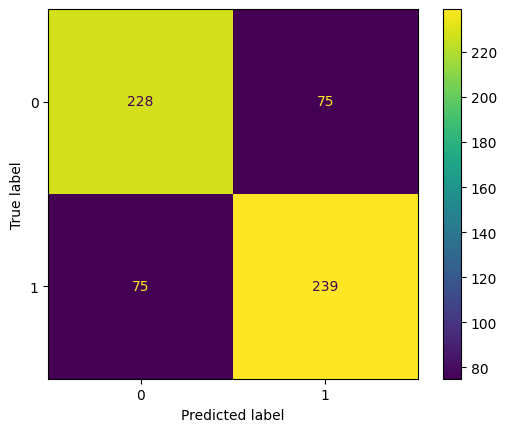

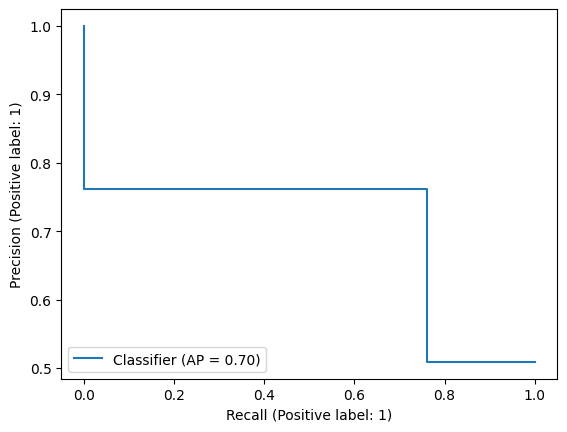

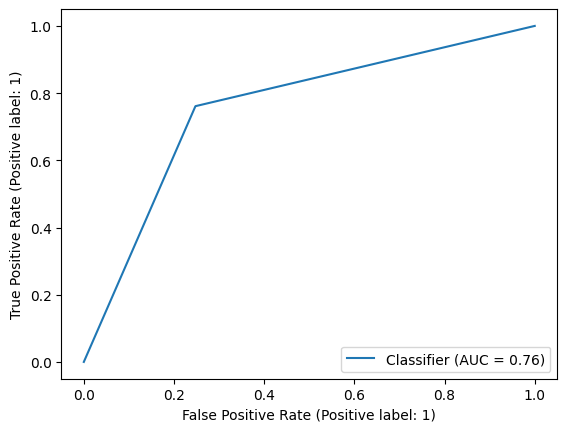

In [76]:
train_and_evaluate_model(LogisticRegression())

Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.62      0.56       303
           1       0.55      0.45      0.50       314

    accuracy                           0.53       617
   macro avg       0.54      0.53      0.53       617
weighted avg       0.54      0.53      0.53       617

--------------------------------------------------


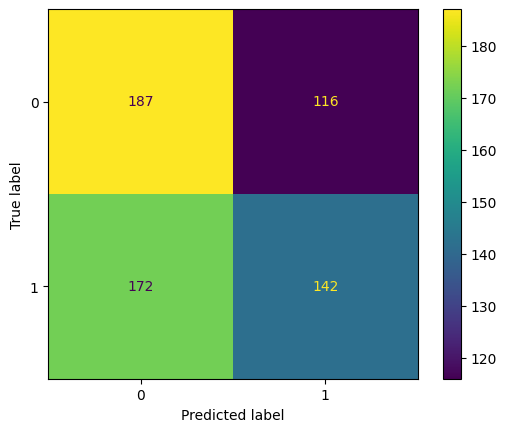

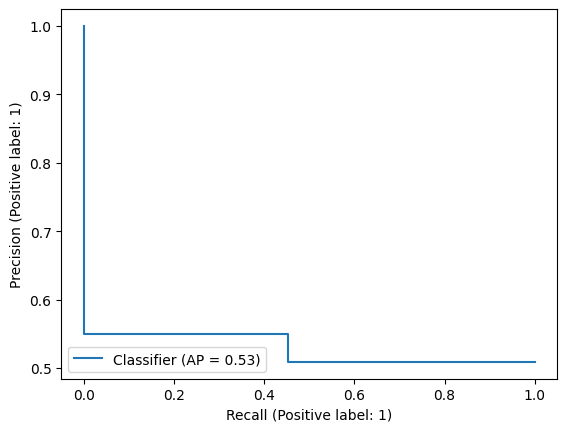

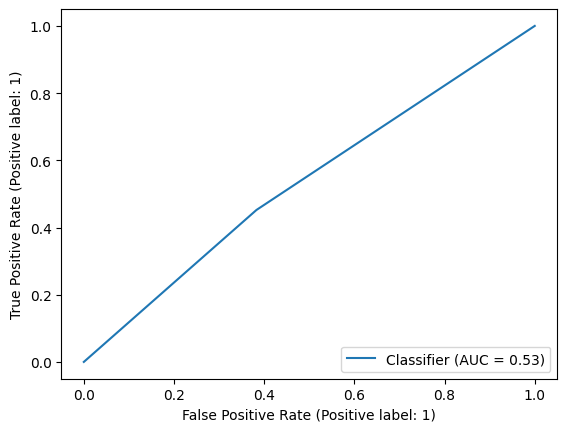

In [77]:
train_and_evaluate_model(PassiveAggressiveClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.49      0.55       303
           1       0.60      0.73      0.66       314

    accuracy                           0.61       617
   macro avg       0.62      0.61      0.60       617
weighted avg       0.62      0.61      0.61       617

--------------------------------------------------


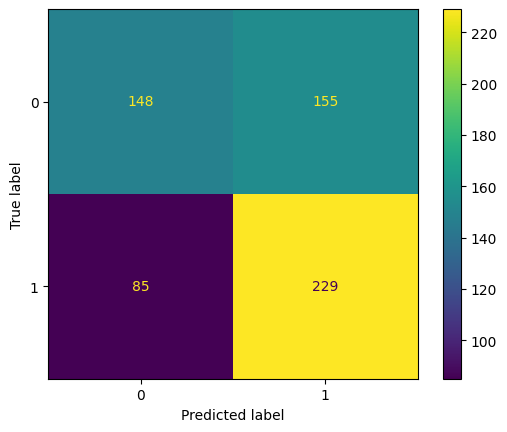

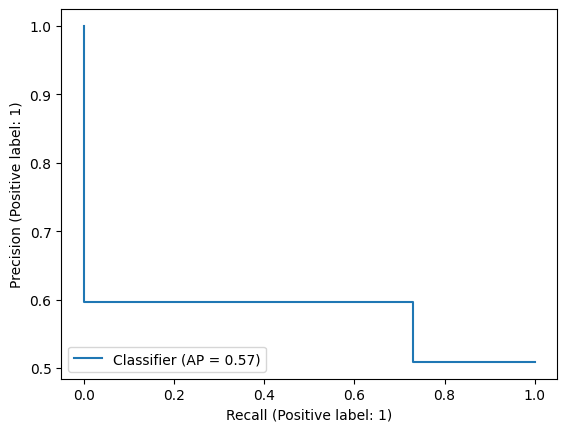

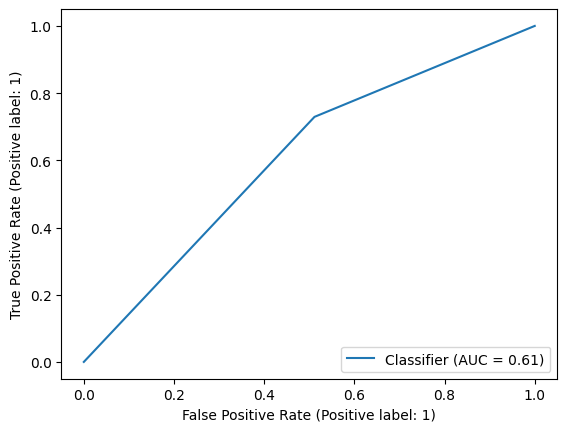

In [78]:
train_and_evaluate_model(SGDClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       303
           1       0.76      0.76      0.76       314

    accuracy                           0.76       617
   macro avg       0.76      0.76      0.76       617
weighted avg       0.76      0.76      0.76       617

--------------------------------------------------


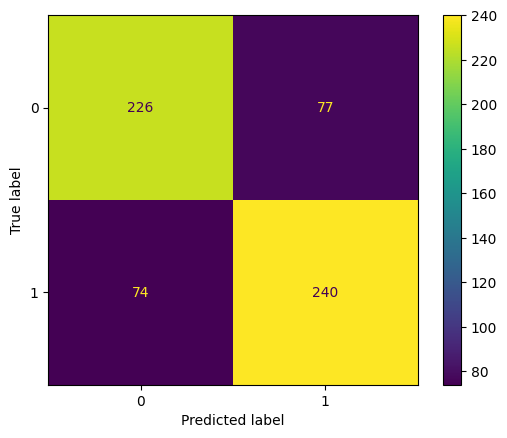

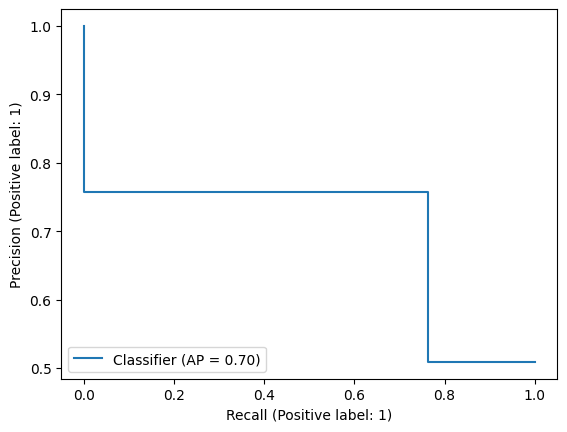

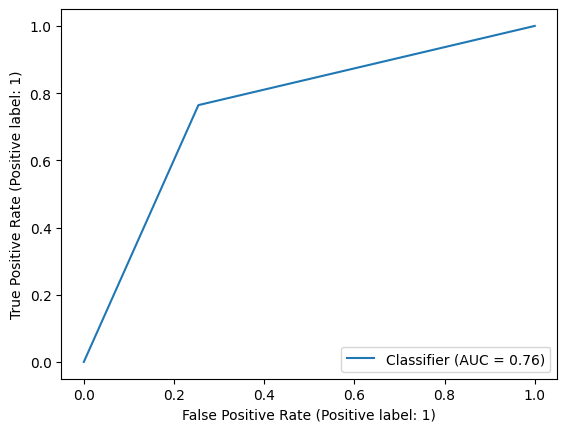

In [79]:
train_and_evaluate_model(RidgeClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.65      0.69       303
           1       0.70      0.78      0.74       314

    accuracy                           0.72       617
   macro avg       0.72      0.72      0.72       617
weighted avg       0.72      0.72      0.72       617

--------------------------------------------------


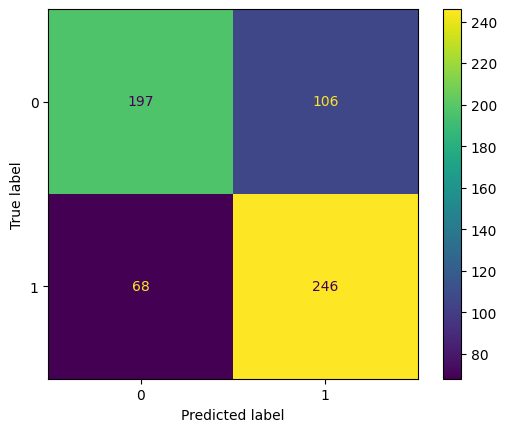

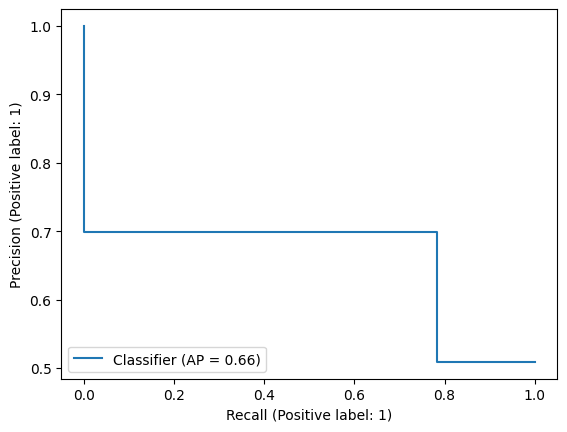

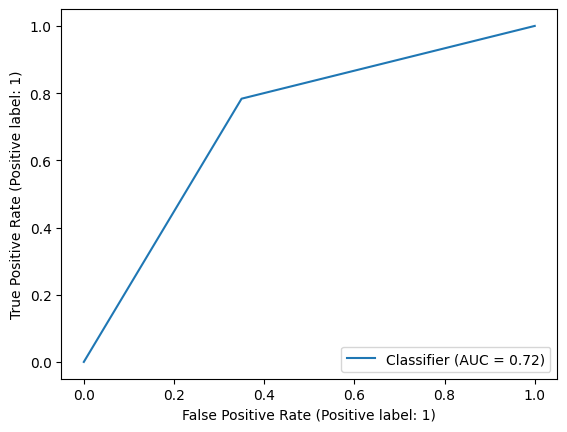

In [80]:
train_and_evaluate_model(GaussianNB())

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.68      0.70       303
           1       0.71      0.75      0.73       314

    accuracy                           0.71       617
   macro avg       0.71      0.71      0.71       617
weighted avg       0.71      0.71      0.71       617

--------------------------------------------------


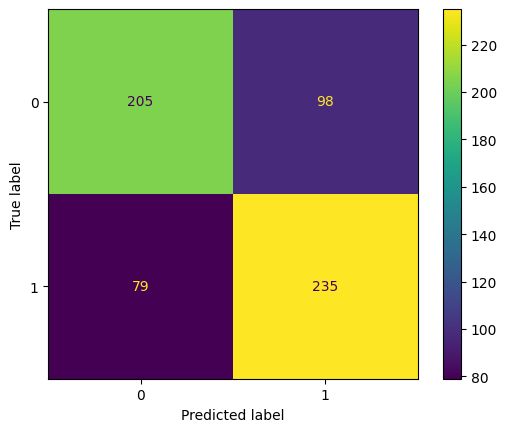

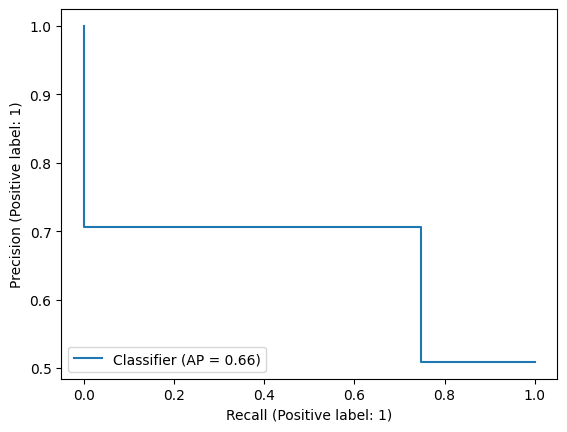

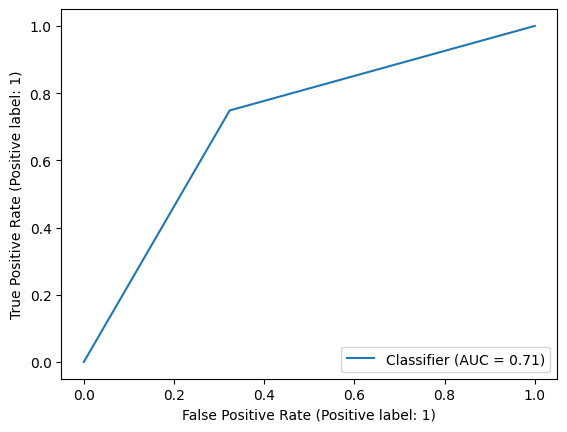

In [81]:
train_and_evaluate_model(BernoulliNB())

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.80      0.84       303
           1       0.83      0.90      0.86       314

    accuracy                           0.85       617
   macro avg       0.86      0.85      0.85       617
weighted avg       0.86      0.85      0.85       617

--------------------------------------------------


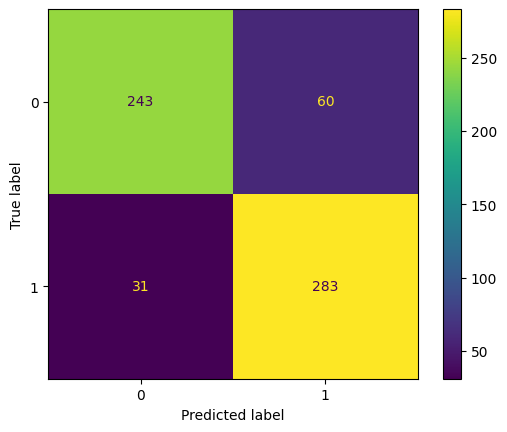

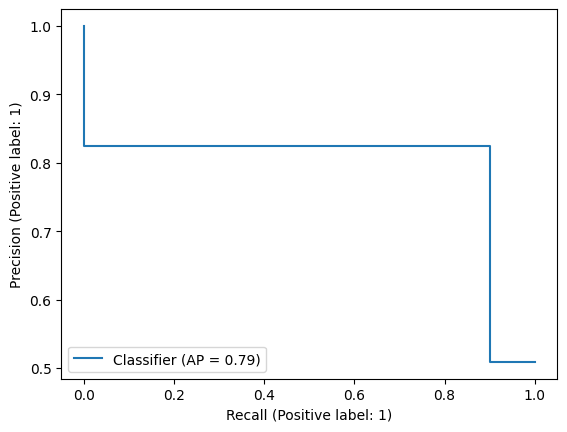

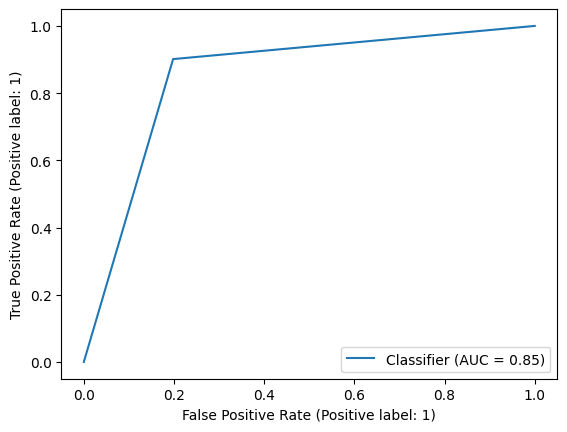

In [82]:
train_and_evaluate_model(KNeighborsClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       303
           1       0.88      0.82      0.85       314

    accuracy                           0.85       617
   macro avg       0.85      0.85      0.85       617
weighted avg       0.85      0.85      0.85       617

--------------------------------------------------


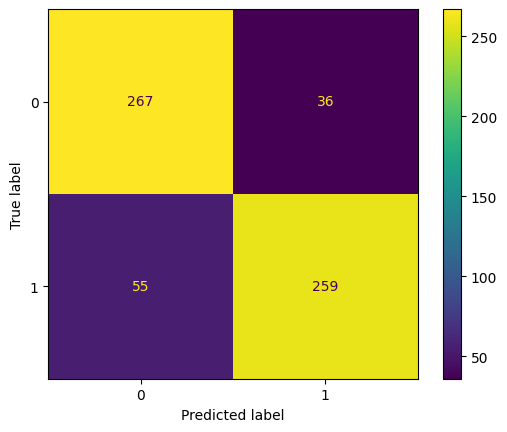

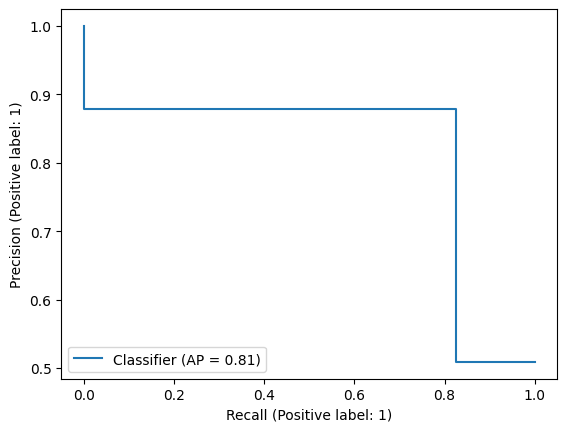

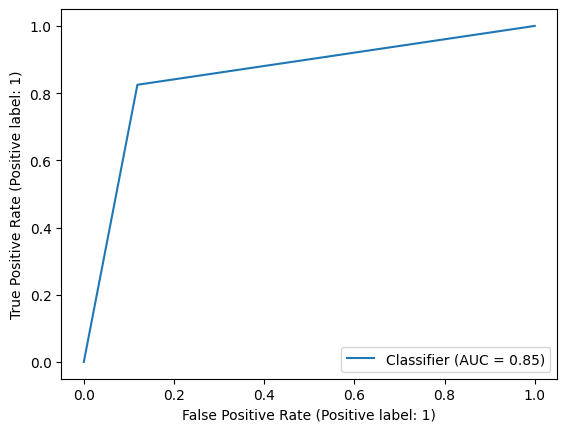

In [83]:
train_and_evaluate_model(SVC())

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       303
           1       0.76      0.76      0.76       314

    accuracy                           0.75       617
   macro avg       0.75      0.75      0.75       617
weighted avg       0.75      0.75      0.75       617

--------------------------------------------------


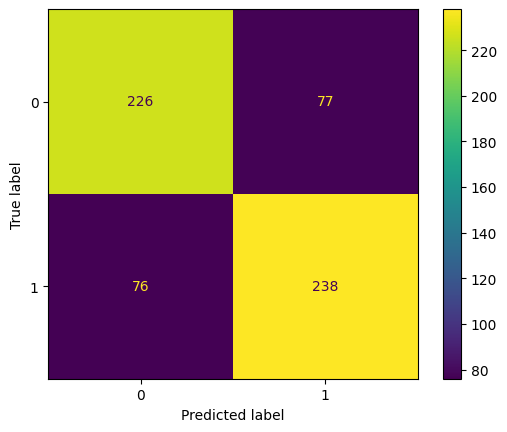

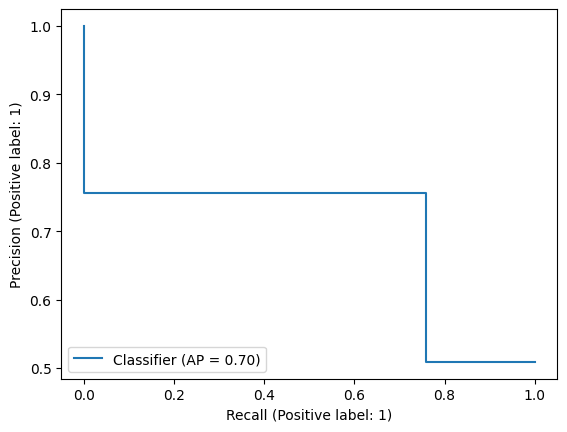

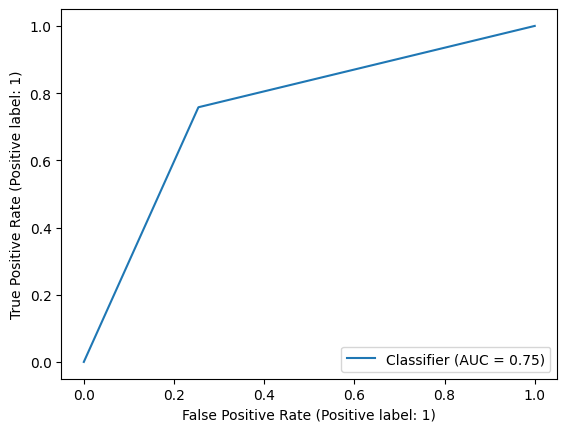

In [84]:
train_and_evaluate_model(LinearSVC())

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.85       303
           1       0.87      0.81      0.84       314

    accuracy                           0.84       617
   macro avg       0.84      0.84      0.84       617
weighted avg       0.84      0.84      0.84       617

--------------------------------------------------


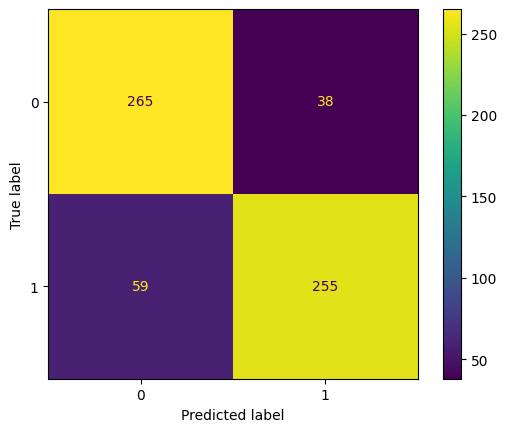

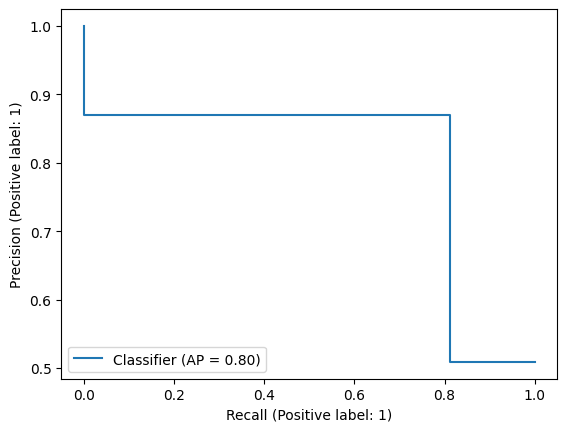

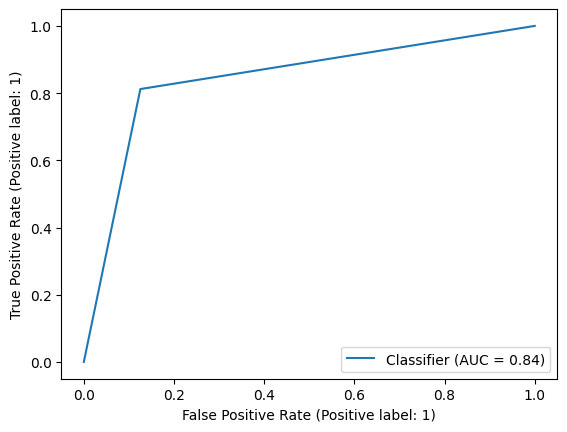

In [85]:
train_and_evaluate_model(NuSVC())

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       303
           1       0.83      0.83      0.83       314

    accuracy                           0.83       617
   macro avg       0.83      0.83      0.83       617
weighted avg       0.83      0.83      0.83       617

--------------------------------------------------


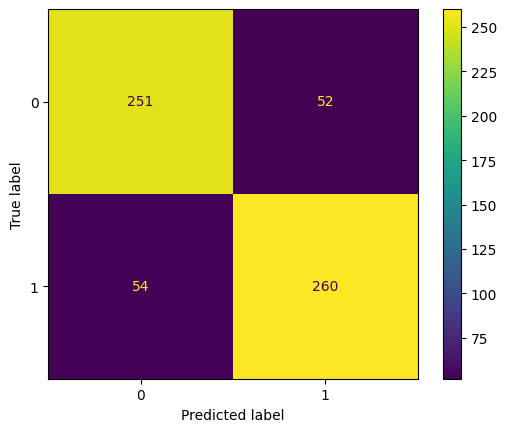

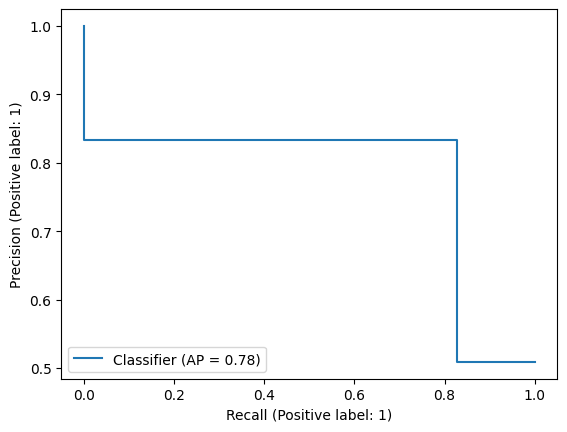

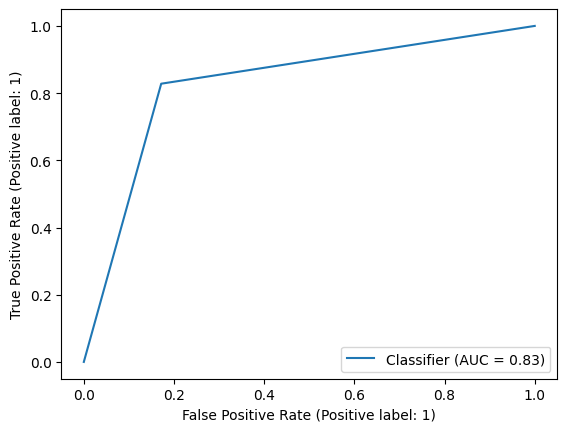

In [86]:
train_and_evaluate_model(DecisionTreeClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       303
           1       0.95      0.89      0.92       314

    accuracy                           0.92       617
   macro avg       0.92      0.92      0.92       617
weighted avg       0.92      0.92      0.92       617

--------------------------------------------------


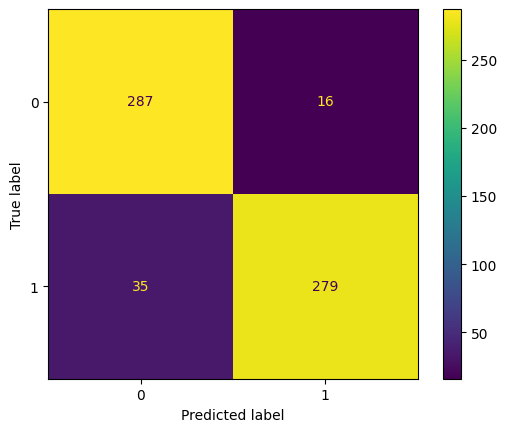

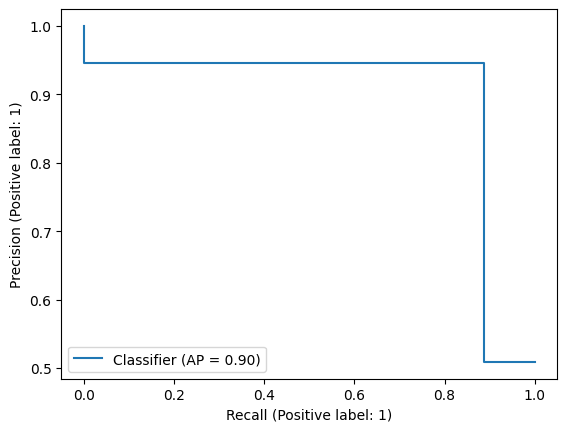

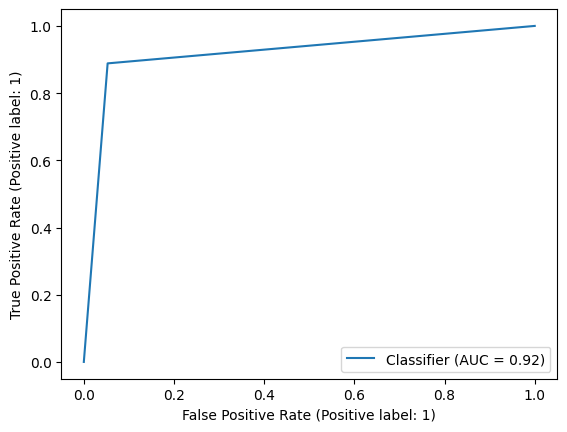

In [87]:
train_and_evaluate_model(ExtraTreesClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.96      0.91       303
           1       0.95      0.86      0.90       314

    accuracy                           0.91       617
   macro avg       0.91      0.91      0.91       617
weighted avg       0.91      0.91      0.91       617

--------------------------------------------------


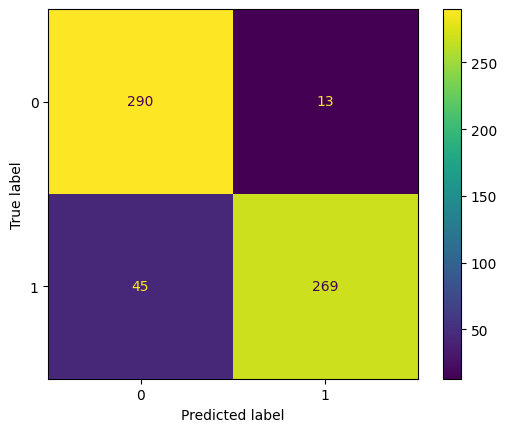

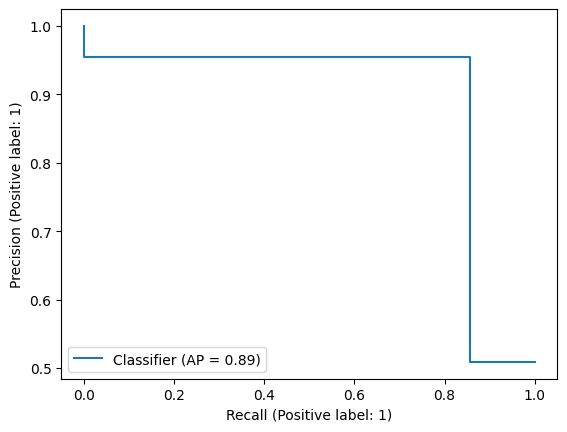

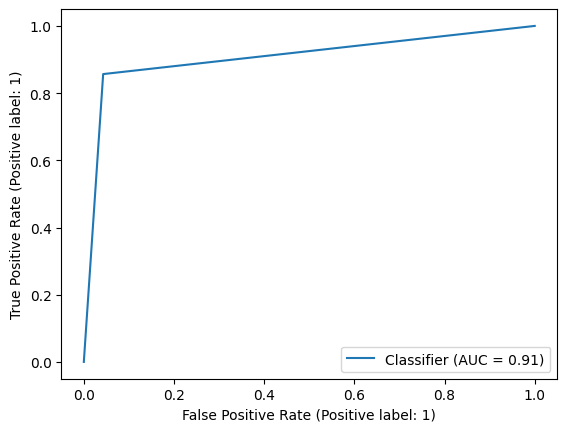

In [88]:
train_and_evaluate_model(RandomForestClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.94      0.88       303
           1       0.93      0.81      0.87       314

    accuracy                           0.87       617
   macro avg       0.88      0.87      0.87       617
weighted avg       0.88      0.87      0.87       617

--------------------------------------------------


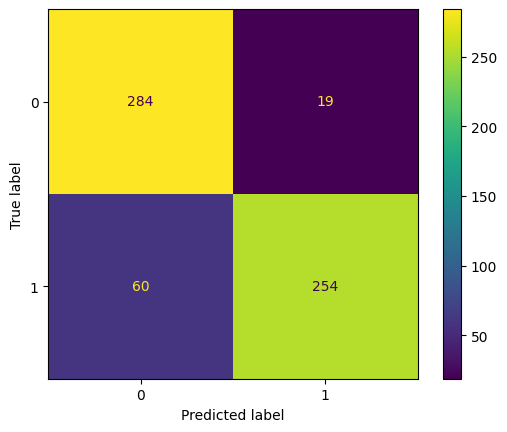

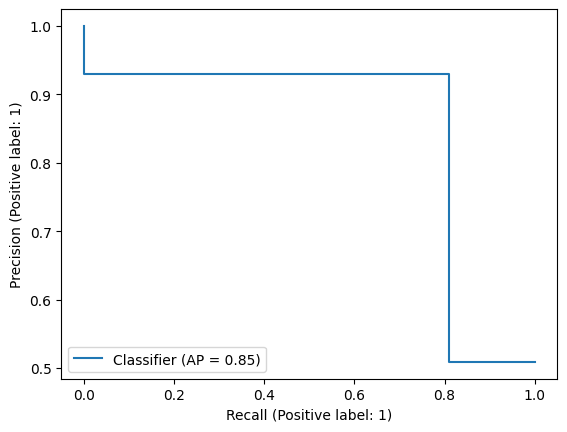

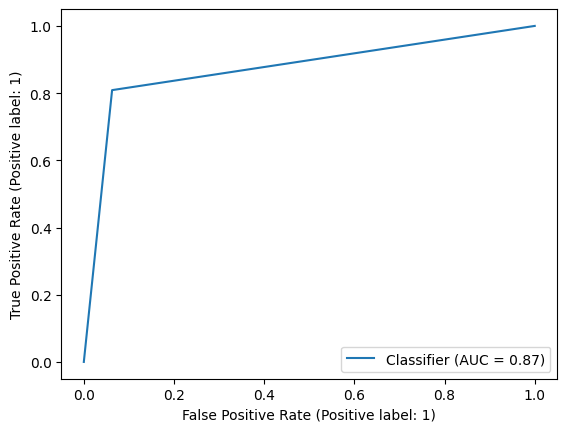

In [89]:
train_and_evaluate_model(BaggingClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.96      0.91       303
           1       0.96      0.86      0.91       314

    accuracy                           0.91       617
   macro avg       0.91      0.91      0.91       617
weighted avg       0.91      0.91      0.91       617

--------------------------------------------------


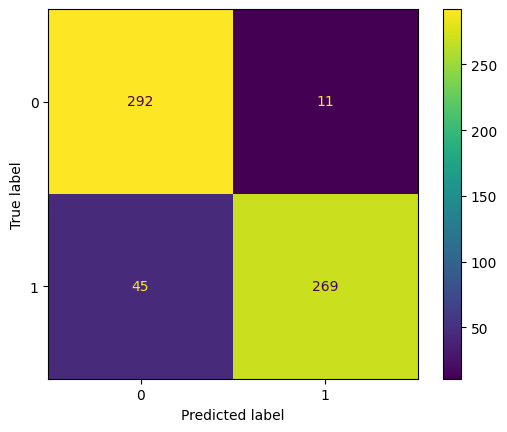

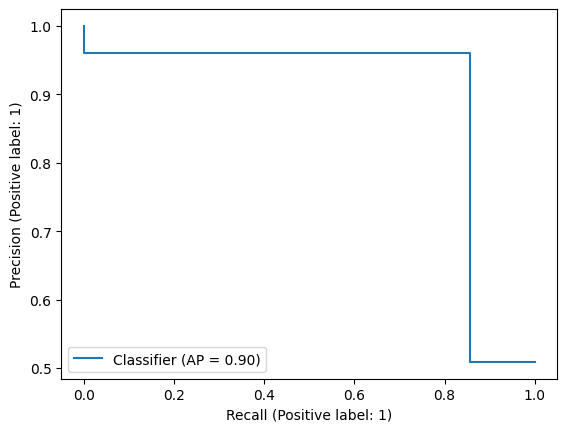

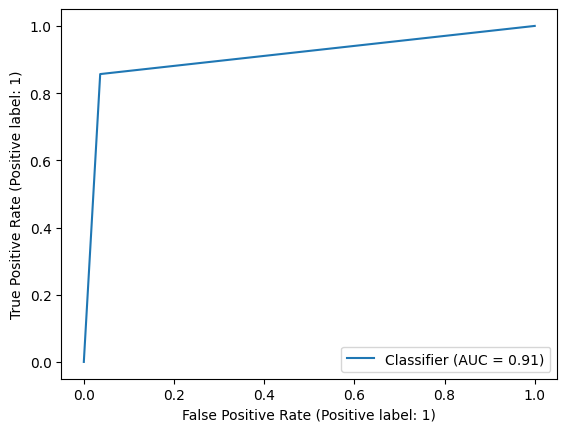

In [90]:
train_and_evaluate_model(HistGradientBoostingClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86       303
           1       0.90      0.82      0.85       314

    accuracy                           0.86       617
   macro avg       0.86      0.86      0.86       617
weighted avg       0.86      0.86      0.86       617

--------------------------------------------------


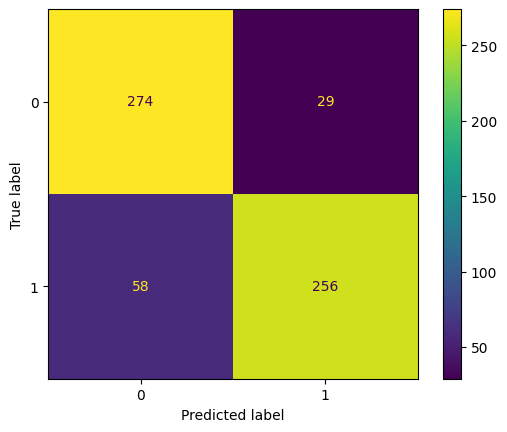

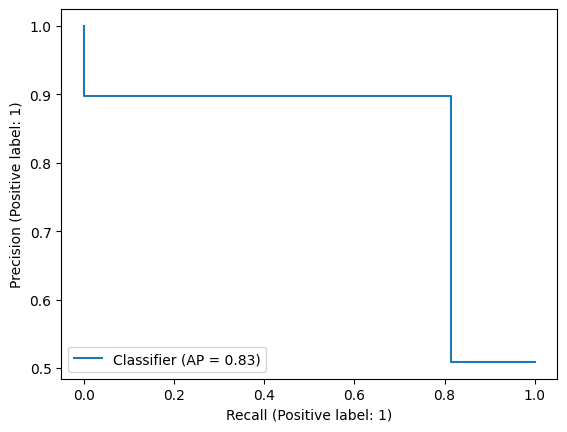

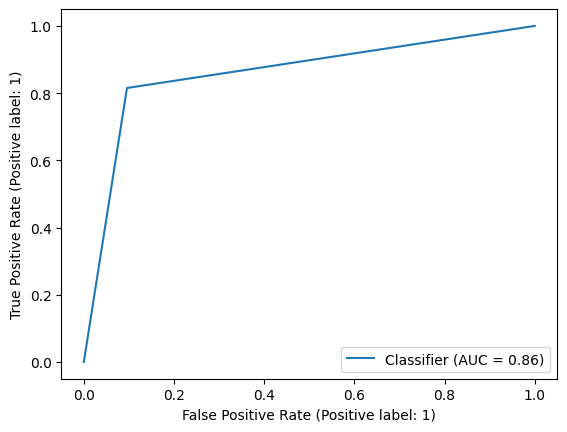

In [91]:
train_and_evaluate_model(AdaBoostClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       303
           1       0.95      0.84      0.89       314

    accuracy                           0.89       617
   macro avg       0.90      0.89      0.89       617
weighted avg       0.90      0.89      0.89       617

--------------------------------------------------


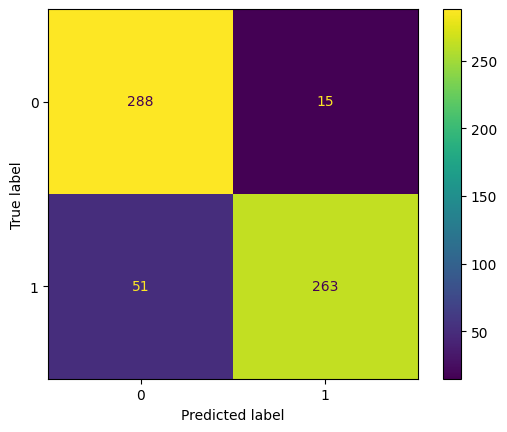

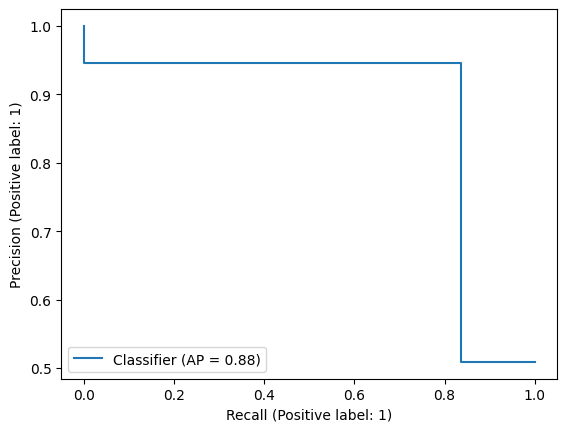

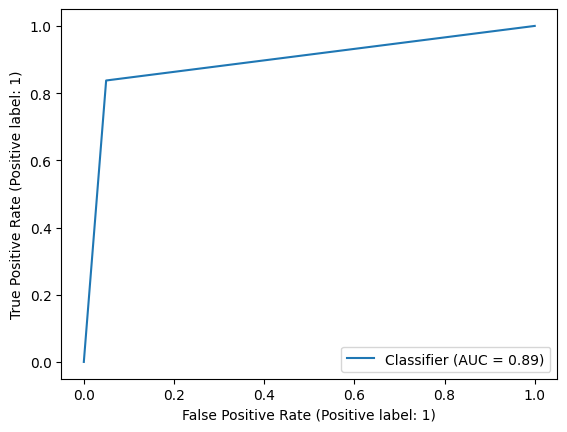

In [92]:
train_and_evaluate_model(GradientBoostingClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       303
           1       0.89      0.81      0.85       314

    accuracy                           0.85       617
   macro avg       0.86      0.85      0.85       617
weighted avg       0.86      0.85      0.85       617

--------------------------------------------------


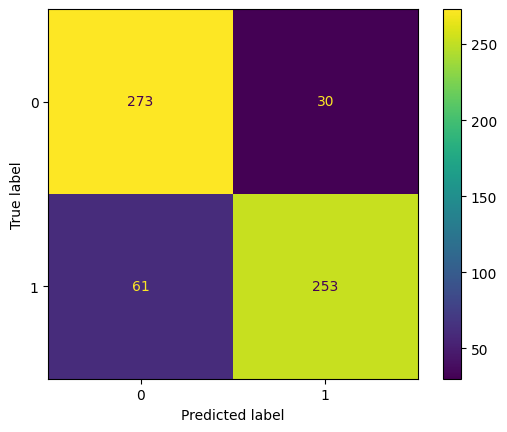

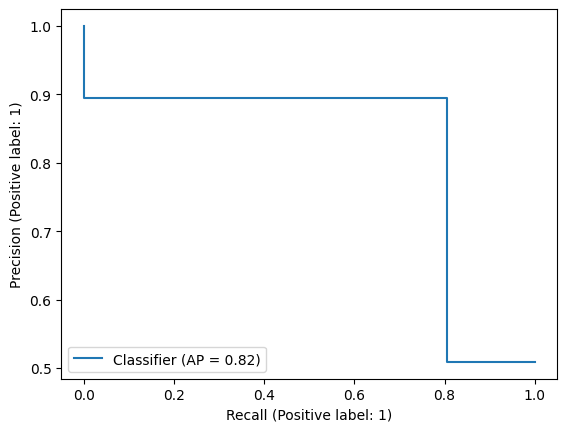

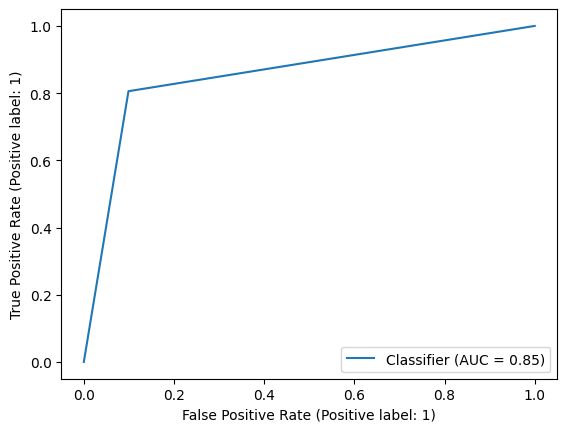

In [93]:
train_and_evaluate_model(MLPClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.95      0.91       303
           1       0.94      0.87      0.90       314

    accuracy                           0.91       617
   macro avg       0.91      0.91      0.91       617
weighted avg       0.91      0.91      0.91       617

--------------------------------------------------


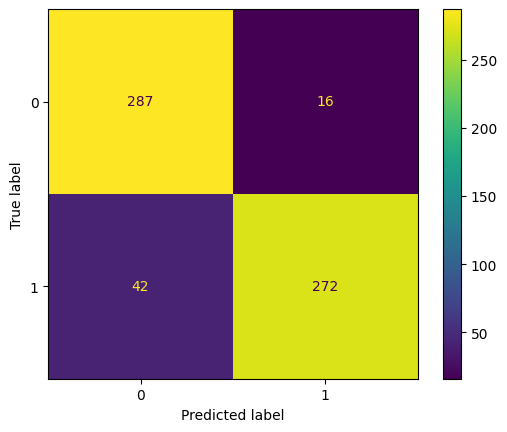

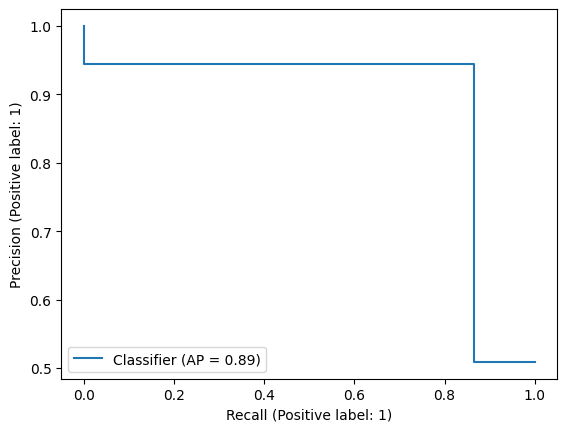

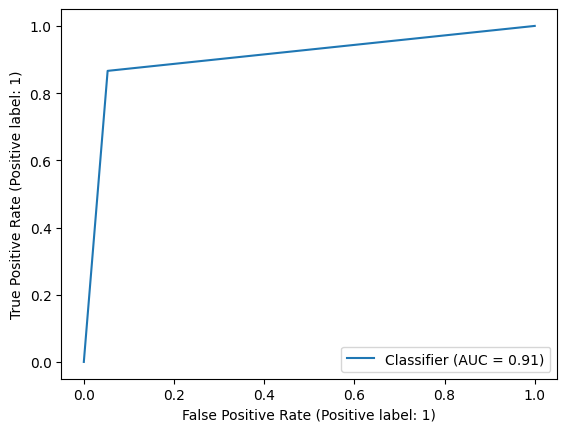

In [94]:
train_and_evaluate_model(XGBClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.93      0.88       303
           1       0.93      0.82      0.87       314

    accuracy                           0.88       617
   macro avg       0.88      0.88      0.87       617
weighted avg       0.88      0.88      0.87       617

--------------------------------------------------


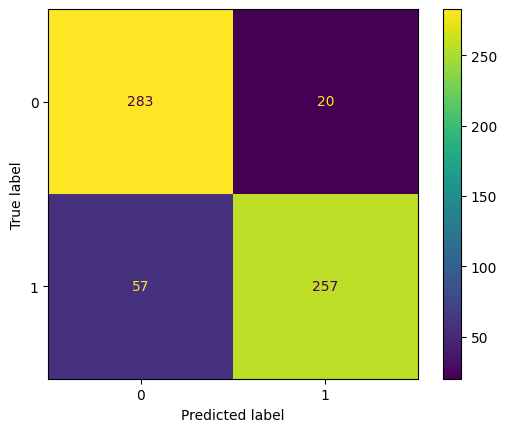

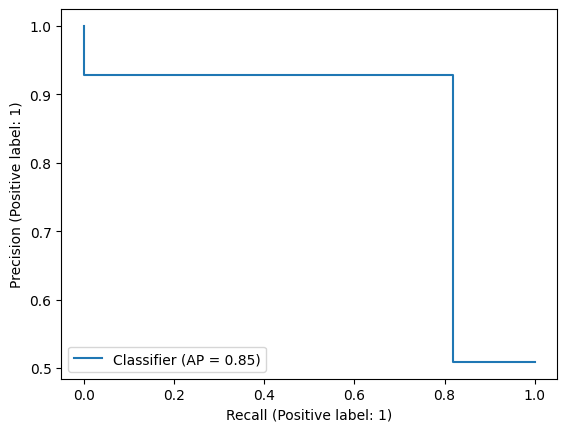

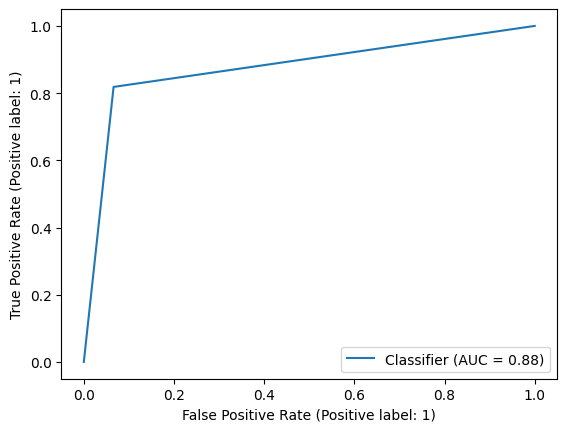

In [95]:
train_and_evaluate_model(XGBRFClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       303
           1       0.95      0.84      0.89       314

    accuracy                           0.89       617
   macro avg       0.90      0.90      0.89       617
weighted avg       0.90      0.89      0.89       617

--------------------------------------------------


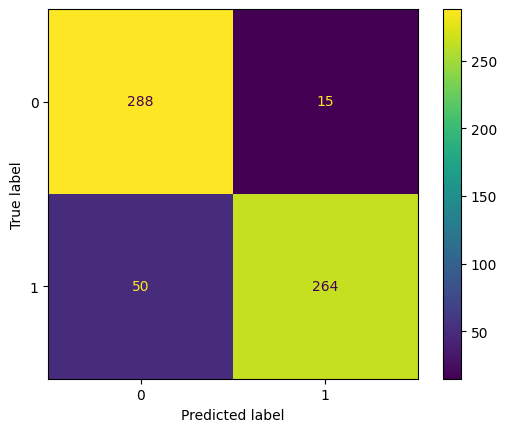

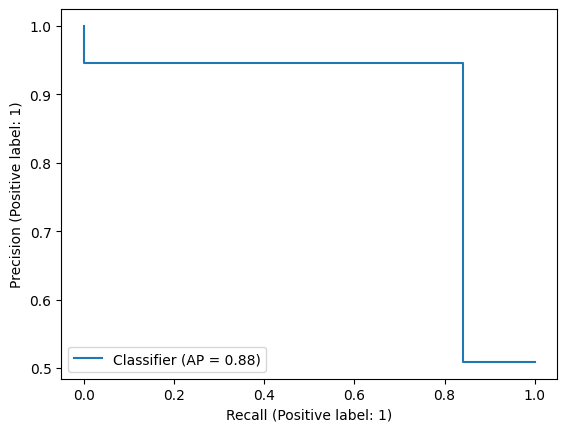

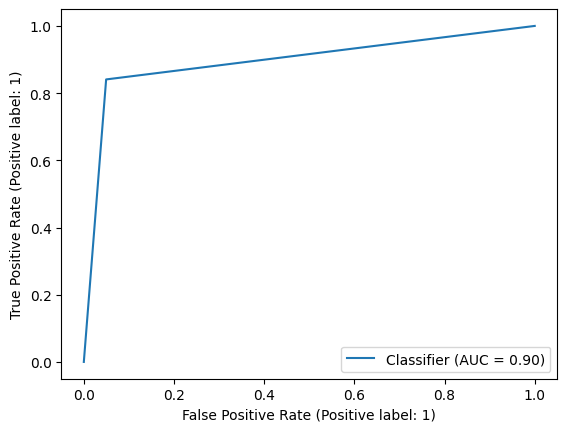

In [96]:
train_and_evaluate_model(LGBMClassifier())

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.96      0.90       303
           1       0.95      0.85      0.90       314

    accuracy                           0.90       617
   macro avg       0.91      0.90      0.90       617
weighted avg       0.91      0.90      0.90       617

--------------------------------------------------


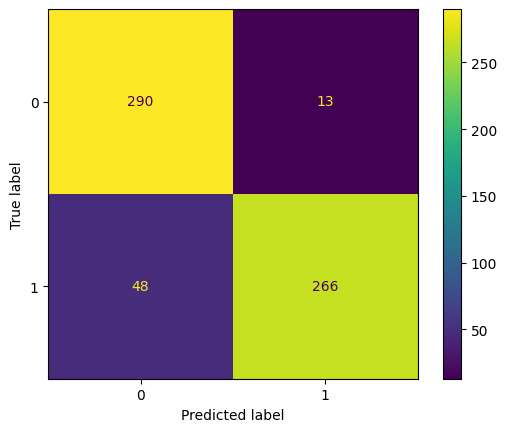

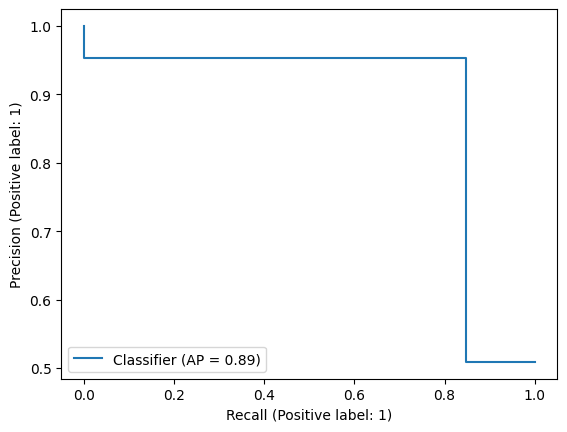

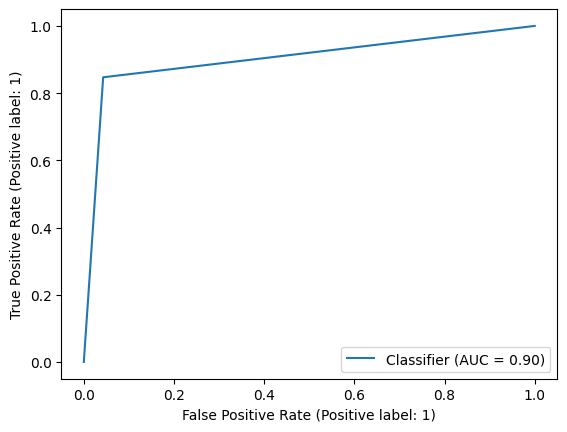

In [97]:
train_and_evaluate_model(CatBoostClassifier(silent=True))

[Voting] ...................... (1 of 3) Processing CAT, total=   3.6s
[Voting] ...................... (2 of 3) Processing XGB, total=   0.1s
[Voting] ....................... (3 of 3) Processing ET, total=   0.3s
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.96      0.92       303
           1       0.96      0.87      0.91       314

    accuracy                           0.91       617
   macro avg       0.92      0.91      0.91       617
weighted avg       0.92      0.91      0.91       617

--------------------------------------------------


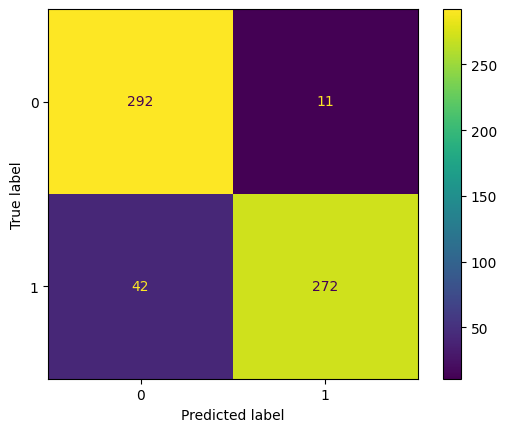

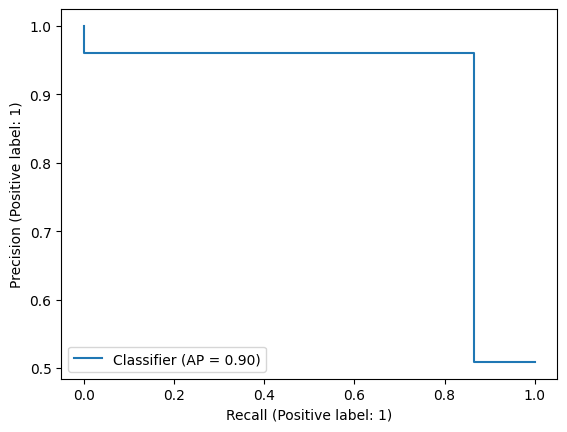

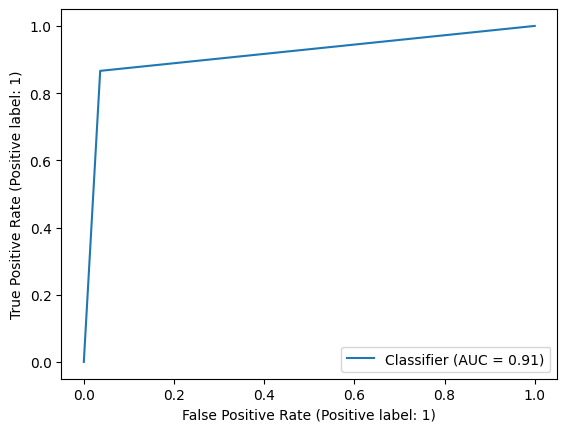

In [98]:
train_and_evaluate_model(VotingClassifier(estimators=[
    ('CAT',CatBoostClassifier(silent=True)),
    ('XGB',XGBClassifier()),
    ('ET',ExtraTreesClassifier())
],verbose=3))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    7.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.9s finished


Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.96      0.92       303
           1       0.96      0.87      0.91       314

    accuracy                           0.91       617
   macro avg       0.92      0.91      0.91       617
weighted avg       0.92      0.91      0.91       617

--------------------------------------------------


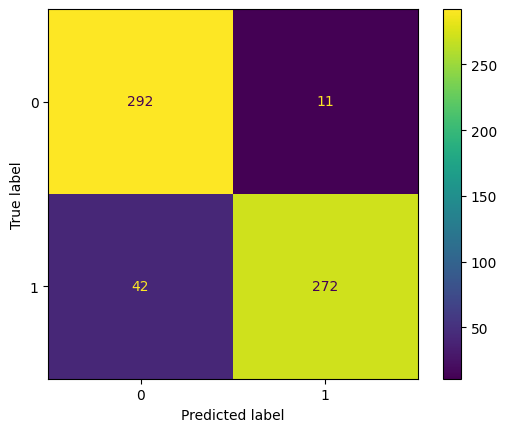

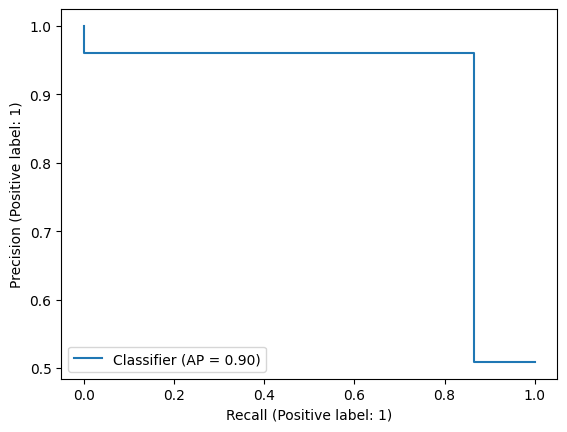

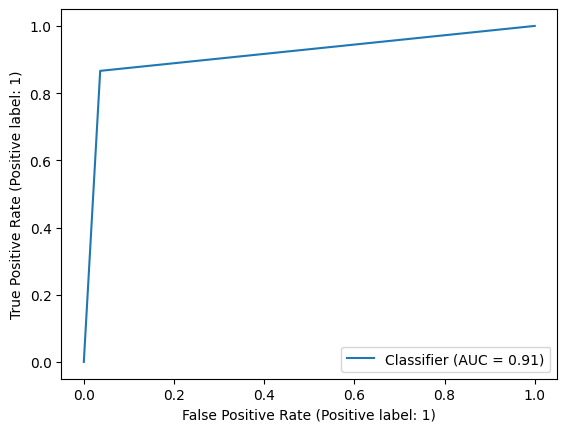

In [99]:
train_and_evaluate_model(StackingClassifier(estimators=[
    ('CAT',CatBoostClassifier(silent=True)),
    ('XGB',XGBClassifier()),
    ('ET',ExtraTreesClassifier())
],final_estimator=LGBMClassifier(),verbose=3))

## Baseline Models Performance Comparison

In [100]:
model_perfs = pd.DataFrame({'Model': models, 
                            'Accuracy': accuracy_scores, 
                            'Precision': precision_scores,
                            'Recall': recall_scores,
                            'F1': f1_scores}).sort_values('Accuracy',ascending=False).reset_index(drop=True)
model_perfs

,Model,Accuracy,Precision,Recall,F1
0,"(ExtraTreeClassifier(random_state=951098263), ...",0.917342,0.918534,0.917865,0.917328
1,"StackingClassifier(estimators=[('CAT',\n ...",0.914100,0.917691,0.914969,0.914010
2,"VotingClassifier(estimators=[('CAT',\n ...",0.914100,0.917691,0.914969,0.914010
3,HistGradientBoostingClassifier(),0.909238,0.913592,0.910192,0.909112
4,"XGBClassifier(base_score=None, booster=None, c...",0.905997,0.908392,0.906718,0.905941
5,"(DecisionTreeClassifier(max_features='auto', r...",0.905997,0.909786,0.906892,0.905888
6,<catboost.core.CatBoostClassifier object at 0x...,0.901135,0.905697,0.902115,0.900985
7,LGBMClassifier(),0.894652,0.899154,0.895630,0.894492
8,([DecisionTreeRegressor(criterion='friedman_ms...,0.893031,0.897800,0.894037,0.892855
9,"XGBRFClassifier(base_score=None, booster=None,...",0.875203,0.880075,0.876232,0.874981


## Hyperparameter Optimization & Cross Validation

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END C=0.1, l1_ratio=0.8, multi_class=multinomial, penalty=l1, solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, l1_ratio=0.8, multi_class=multinomial, penalty=l1, solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, l1_ratio=0.8, multi_class=multinomial, penalty=l1, solver=liblinear;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, l1_ratio=0.8, multi_class=multinomial, penalty=l1, solver=liblinear;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, l1_ratio=0.8, multi_class=multinomial, penalty=l1, solver=liblinear;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, l1_ratio=0.2, multi_class=ovr, penalty=elasticnet, solver=liblinear;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, l1_ratio=0.2, multi_class=ovr, penalty=elasticnet, solver=liblinear;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, l1_ratio=0.2, multi_class=ovr, penalty=elasticnet, solver=liblinear;, score=nan total 

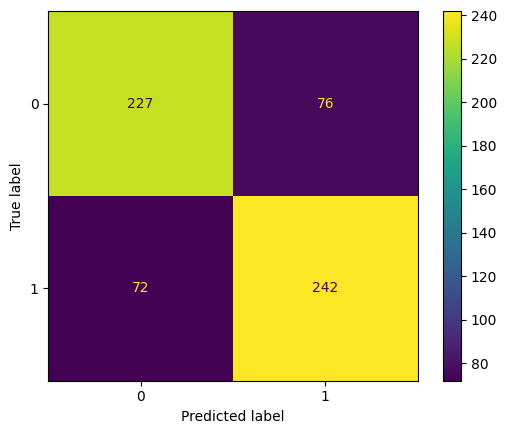

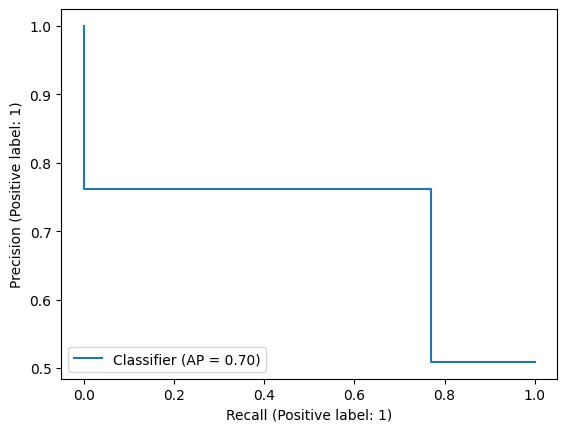

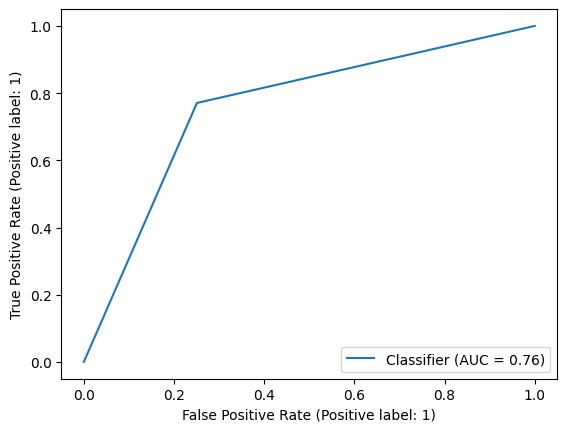

In [101]:
param_grid = {'penalty': ['l1','l2','elasticnet'],
              'C': [0.001,0.01,0.1,0.5],
              'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'multi_class': ['ovr', 'multinomial'],
              'l1_ratio': [0.2,0.5,0.8]
             }

grid_lr = RandomizedSearchCV(LogisticRegression(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ...C=0.001, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END ...C=0.001, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END ...C=0.001, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END ...C=0.001, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END ...C=0.001, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END .....C=0.1, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END .....C=0.1, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END .....C=0.1, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END .....C=0.1, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END .....C=0.1, loss=hinge, multi_class=ovr, penalty=l2; total time=   0.0s
[CV] END C=0.1, loss=squared_hinge, multi_class=crammer_singer, penalty=l1; total time=   0.0s
[CV] END C=0.1, loss=squared_hinge

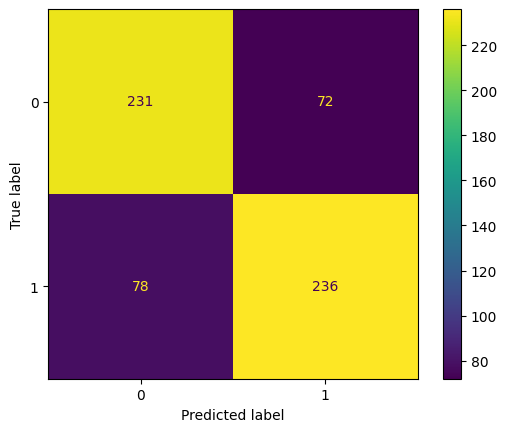

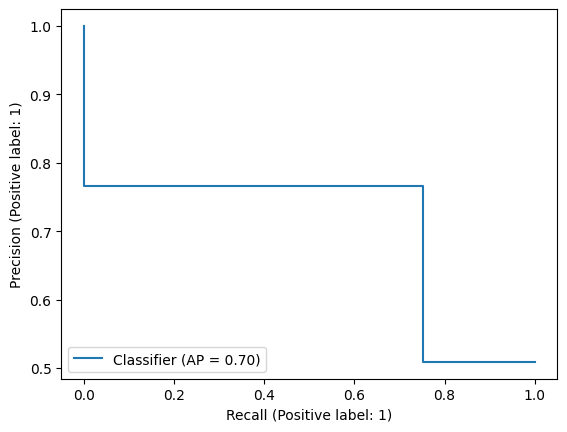

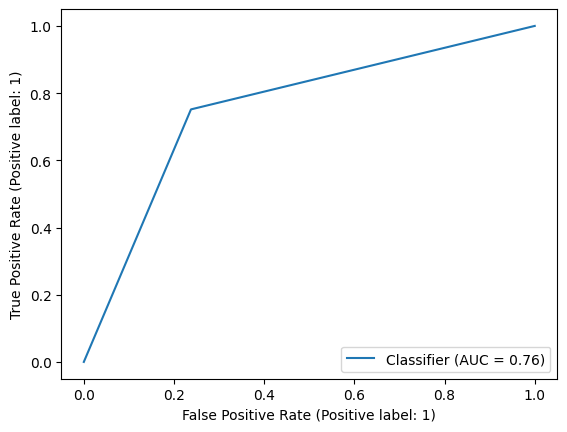

In [102]:
param_grid = {'penalty': ['l1','l2'],
             'loss': ['hinge','squared_hinge'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'multi_class': ['ovr','crammer_singer']}

grid_lsvc = RandomizedSearchCV(LinearSVC(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_lsvc)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=log_loss, max_features=log2, splitter=best;, score=0.773 total time=   0.0s
[CV 2/5] END criterion=log_loss, max_features=log2, splitter=best;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=log_loss, max_features=log2, splitter=best;, score=0.824 total time=   0.0s
[CV 4/5] END criterion=log_loss, max_features=log2, splitter=best;, score=0.851 total time=   0.0s
[CV 5/5] END criterion=log_loss, max_features=log2, splitter=best;, score=0.846 total time=   0.0s
[CV 1/5] END criterion=gini, max_features=log2, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=gini, max_features=log2, splitter=random;, score=0.803 total time=   0.0s
[CV 3/5] END criterion=gini, max_features=log2, splitter=random;, score=0.765 total time=   0.0s
[CV 4/5] END criterion=gini, max_features=log2, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=gini, max_features=log2, splitter

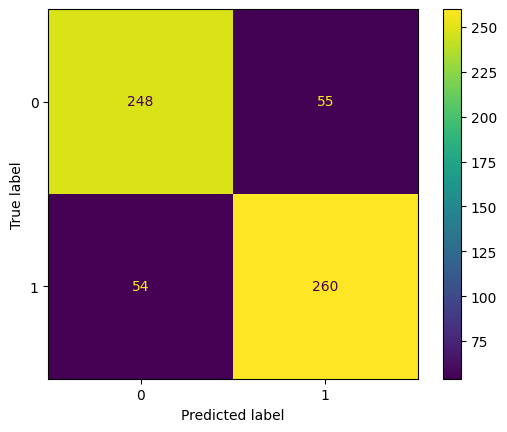

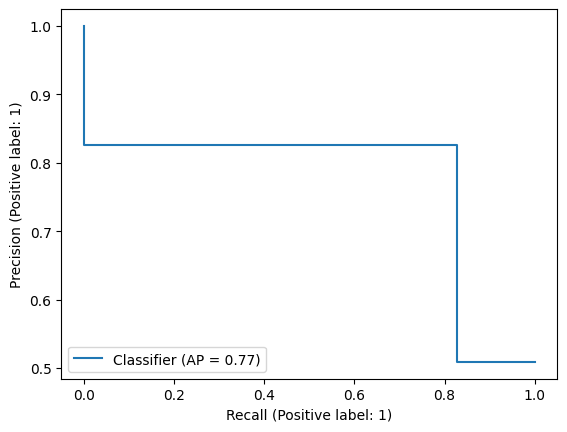

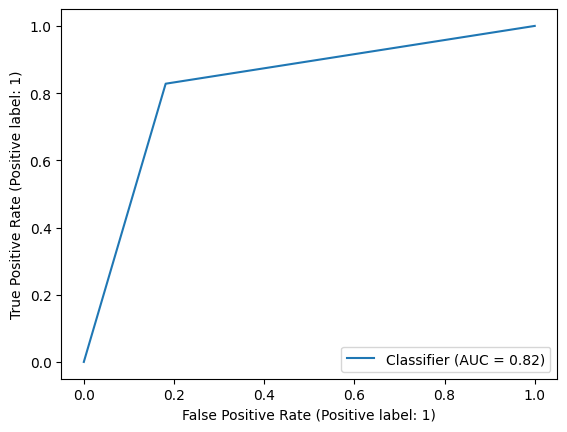

In [103]:
param_grid = {'criterion': ['gini','entropy','log_loss'],
              'splitter': ['best','random'],
              'max_features': ['sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeClassifier(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END C=1, degree=2, gamma=auto, kernel=rbf, shrinking=False;, score=0.846 total time=   0.0s
[CV 2/5] END C=1, degree=2, gamma=auto, kernel=rbf, shrinking=False;, score=0.841 total time=   0.0s
[CV 3/5] END C=1, degree=2, gamma=auto, kernel=rbf, shrinking=False;, score=0.819 total time=   0.0s
[CV 4/5] END C=1, degree=2, gamma=auto, kernel=rbf, shrinking=False;, score=0.819 total time=   0.0s
[CV 5/5] END C=1, degree=2, gamma=auto, kernel=rbf, shrinking=False;, score=0.829 total time=   0.0s
[CV 1/5] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=True;, score=0.503 total time=   0.0s
[CV 2/5] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=True;, score=0.503 total time=   0.0s
[CV 3/5] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=True;, score=0.503 total time=   0.0s
[CV 4/5] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=True;, score=0.503 total time=   0.0s
[CV 5/5] E

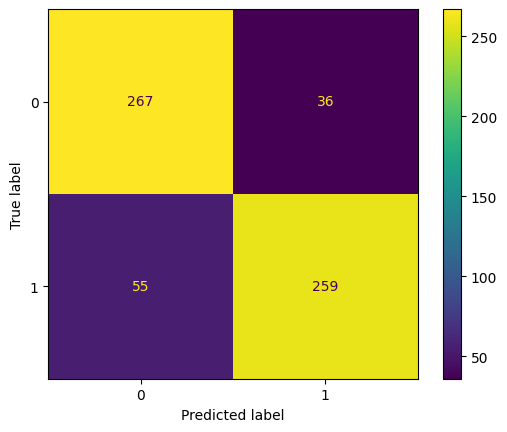

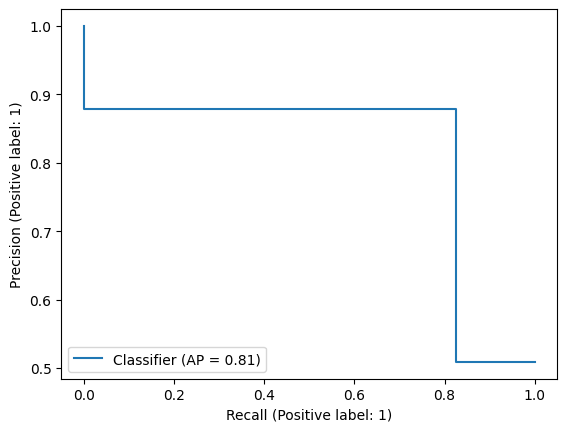

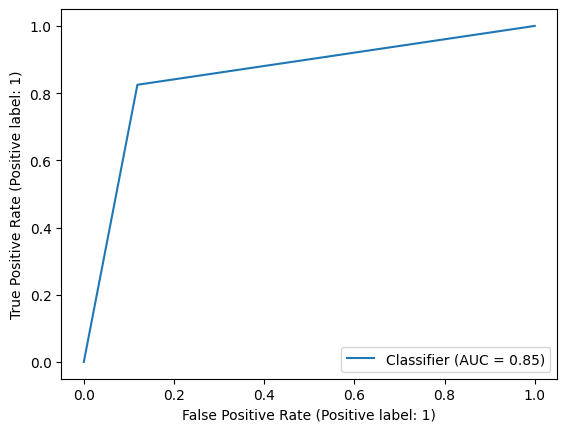

In [104]:
param_grid = {'C': [0.001,0.01,0.1,1,5],
             'gamma': ['scale','auto'],
             'kernel': ['linear','poly','rbf','sigmoid'],
             'degree': [2,3,4,5],
             'shrinking': [True,False]
             }

grid_svm = RandomizedSearchCV(SVC(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_svm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ........learning_rate=0.2, loss=binary_crossentropy; total time=   0.7s
[CV] END ........learning_rate=0.2, loss=binary_crossentropy; total time=   1.3s
[CV] END ........learning_rate=0.2, loss=binary_crossentropy; total time=   0.6s
[CV] END ........learning_rate=0.2, loss=binary_crossentropy; total time=   0.7s
[CV] END ........learning_rate=0.2, loss=binary_crossentropy; total time=   0.7s
[CV] END ...learning_rate=0.2, loss=categorical_crossentropy; total time=   0.0s
[CV] END ...learning_rate=0.2, loss=categorical_crossentropy; total time=   0.0s
[CV] END ...learning_rate=0.2, loss=categorical_crossentropy; total time=   0.0s
[CV] END ...learning_rate=0.2, loss=categorical_crossentropy; total time=   0.0s
[CV] END ...learning_rate=0.2, loss=categorical_crossentropy; total time=   0.0s
[CV] END ........learning_rate=0.4, loss=binary_crossentropy; total time=   0.6s
[CV] END ........learning_rate=0.4, loss=binary_

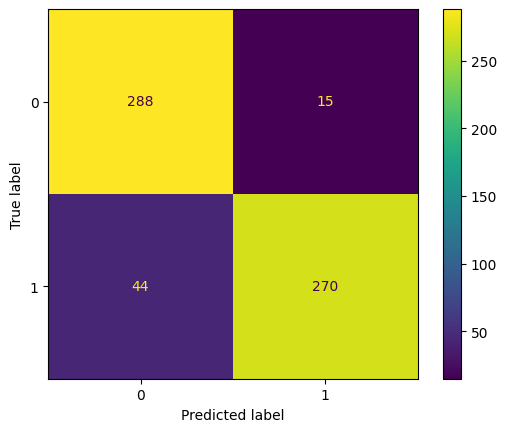

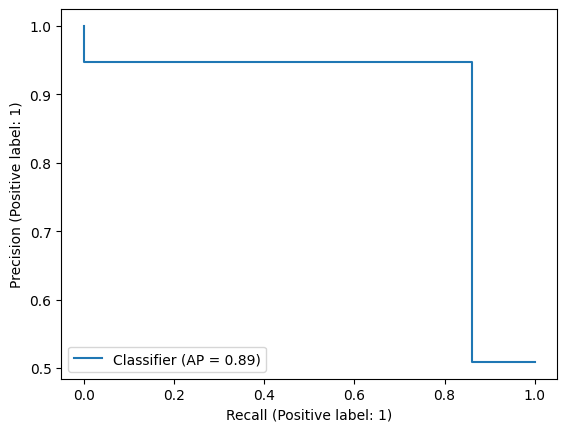

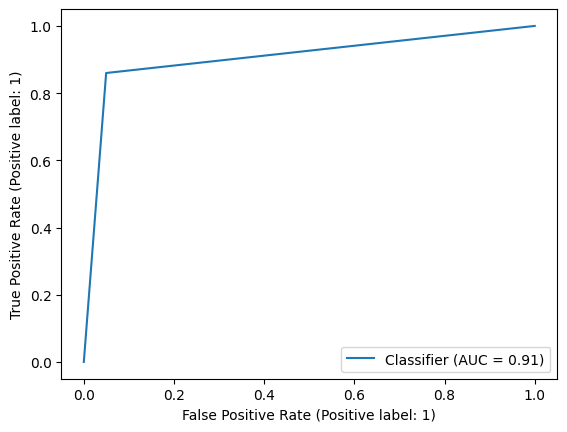

In [105]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['binary_crossentropy', 'categorical_crossentropy']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingClassifier(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=manhattan, n_neighbors=2, weights=uniform; total time=   0.5s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=chebyshev, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=chebyshev, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=chebyshev, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=chebyshev, n_neighbors=20, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=chebyshev, n_neighbors=20, weights=uniform; tot

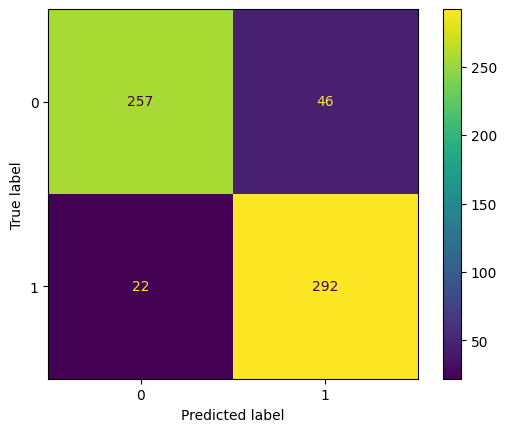

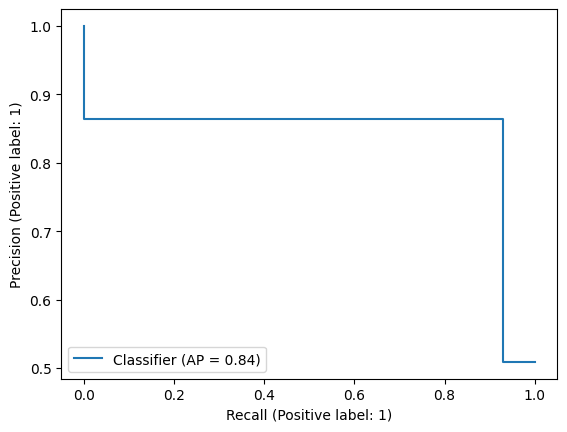

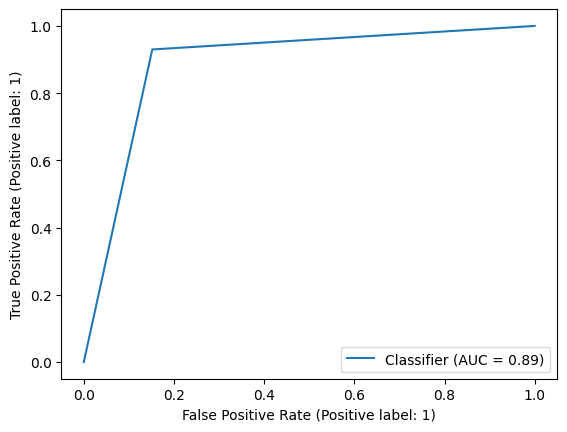

In [106]:
param_grid = {'n_neighbors': [2,5,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'kd_tree', 'brute'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev']
             }

grid_knn = RandomizedSearchCV(KNeighborsClassifier(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_features=log2, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_features=log2, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_features=log2, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_features=log2, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_features=log2, n_estimators=200, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, n_estimators=800, oob_score=False; total time=   0.6s
[CV] END bootstrap=True, class_weight=balanced, criterion=gini, max

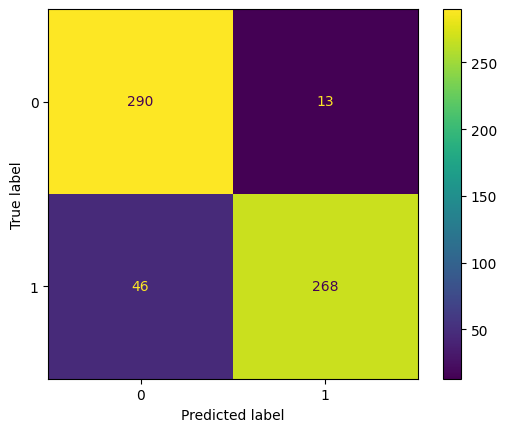

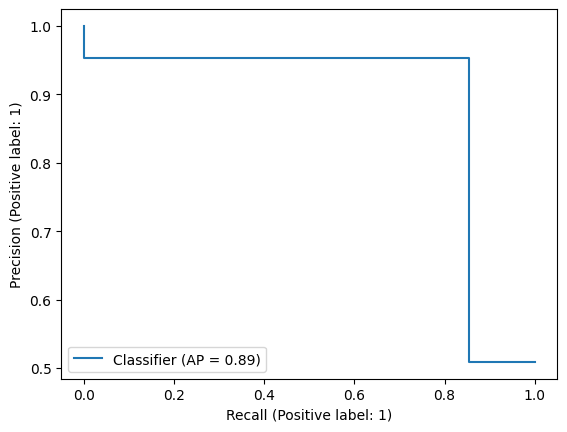

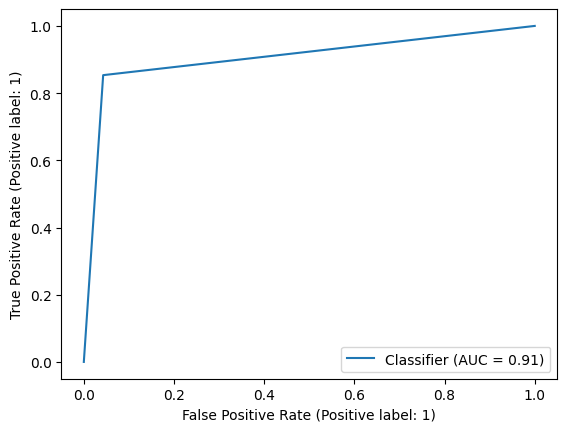

In [107]:
param_grid = {'n_estimators': [200,400,600,800,1000], 
              'criterion': ['gini','entropy','log_loss'],
              'max_features': ['sqrt','log2'],
              'bootstrap': [True,False],
              'oob_score': [True,False],
              'class_weight': ['balanced','balanced_subsample']}

grid_rf = RandomizedSearchCV(RandomForestClassifier(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_rf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=friedman_mse, learning_rate=0.7, loss=log_loss, max_features=sqrt, n_estimators=1000;, score=0.897 total time=   2.0s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.7, loss=log_loss, max_features=sqrt, n_estimators=1000;, score=0.881 total time=   2.1s
[CV 3/5] END criterion=friedman_mse, learning_rate=0.7, loss=log_loss, max_features=sqrt, n_estimators=1000;, score=0.903 total time=   2.3s
[CV 4/5] END criterion=friedman_mse, learning_rate=0.7, loss=log_loss, max_features=sqrt, n_estimators=1000;, score=0.895 total time=   2.2s
[CV 5/5] END criterion=friedman_mse, learning_rate=0.7, loss=log_loss, max_features=sqrt, n_estimators=1000;, score=0.900 total time=   2.2s
[CV 1/5] END criterion=squared_error, learning_rate=0.2, loss=log_loss, max_features=sqrt, n_estimators=100;, score=0.895 total time=   0.1s
[CV 2/5] END criterion=squared_error, learning_rate=0.2, loss=log_loss, max_features=sqrt, n_

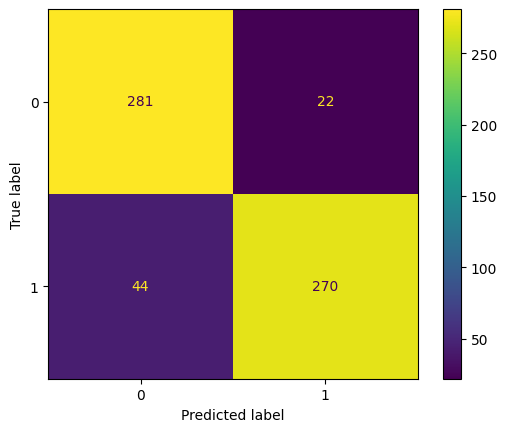

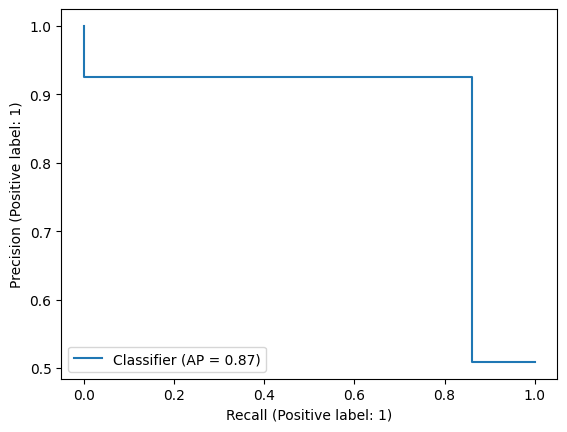

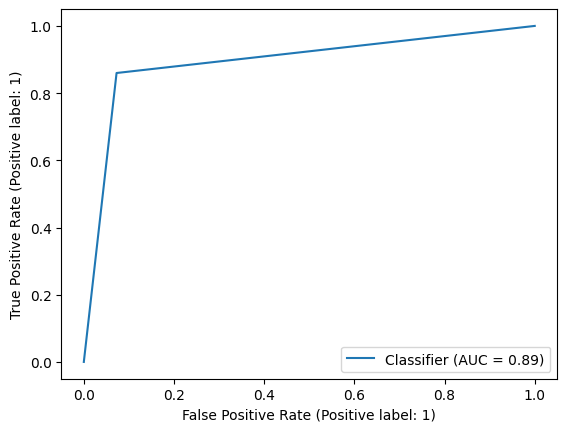

In [108]:
param_grid = {'loss': ['log_loss','deviance','exponential'],
              'n_estimators': [100,400,800,1000],
              'learning_rate': [0.2,0.4,0.7,1],
              'criterion': ['absolute_error','friedman_mse', 'squared_error'],
              'max_features': ['sqrt','log2']
             }

grid_gb = RandomizedSearchCV(GradientBoostingClassifier(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ...............learning_rate=0.4, n_estimators=1000; total time=   2.9s
[CV] END ...............learning_rate=0.4, n_estimators=1000; total time=   2.8s
[CV] END ...............learning_rate=0.4, n_estimators=1000; total time=   2.9s
[CV] END ...............learning_rate=0.4, n_estimators=1000; total time=   2.6s
[CV] END ...............learning_rate=0.4, n_estimators=1000; total time=   2.6s
[CV] END ..................learning_rate=1, n_estimators=200; total time=   1.0s
[CV] END ..................learning_rate=1, n_estimators=200; total time=   1.0s
[CV] END ..................learning_rate=1, n_estimators=200; total time=   1.0s
[CV] END ..................learning_rate=1, n_estimators=200; total time=   1.0s
[CV] END ..................learning_rate=1, n_estimators=200; total time=   1.0s
[CV] END ................learning_rate=0.2, n_estimators=200; total time=   1.1s
[CV] END ................learning_rate=0.2, n_es

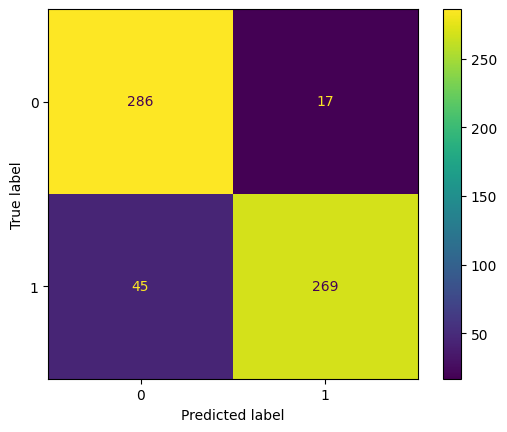

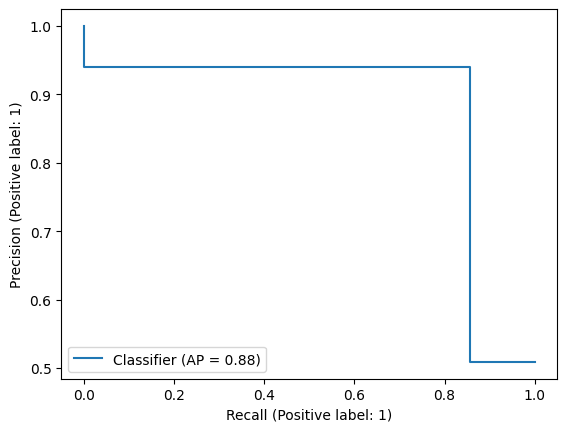

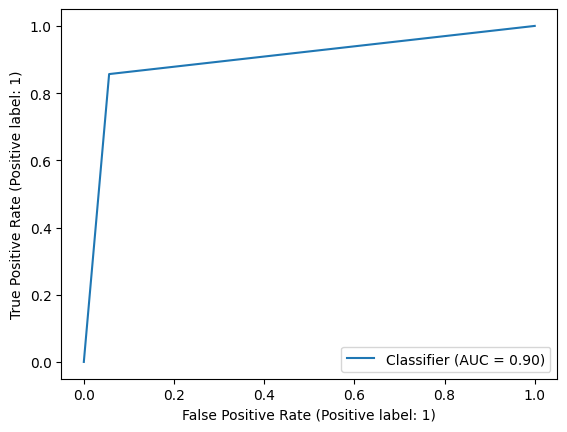

In [109]:
param_grid = {'learning_rate': [0.2,0.4,0.7,1],
              'n_estimators': [200,500,1000]
             }

grid_cat = RandomizedSearchCV(CatBoostClassifier(silent=True),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=True, max_features=0.25, max_samples=0.25, n_estimators=200, oob_score=False;, score=0.892 total time=   0.5s
[CV 2/5] END bootstrap=True, max_features=0.25, max_samples=0.25, n_estimators=200, oob_score=False;, score=0.870 total time=   0.5s
[CV 3/5] END bootstrap=True, max_features=0.25, max_samples=0.25, n_estimators=200, oob_score=False;, score=0.886 total time=   0.5s
[CV 4/5] END bootstrap=True, max_features=0.25, max_samples=0.25, n_estimators=200, oob_score=False;, score=0.895 total time=   0.6s
[CV 5/5] END bootstrap=True, max_features=0.25, max_samples=0.25, n_estimators=200, oob_score=False;, score=0.892 total time=   0.5s
[CV 1/5] END bootstrap=True, max_features=0.5, max_samples=1.0, n_estimators=500, oob_score=True;, score=0.897 total time=   3.4s
[CV 2/5] END bootstrap=True, max_features=0.5, max_samples=1.0, n_estimators=500, oob_score=True;, score=0.889 total time=   3.3s
[CV 3/5] END b

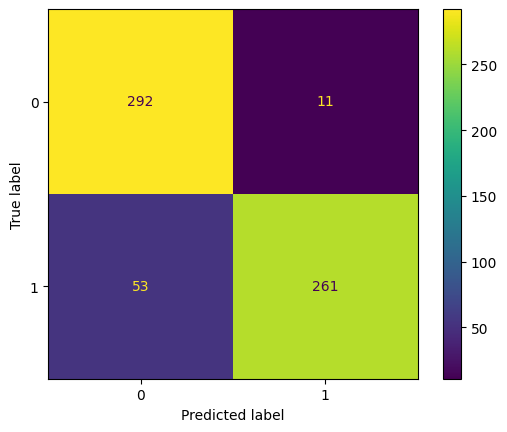

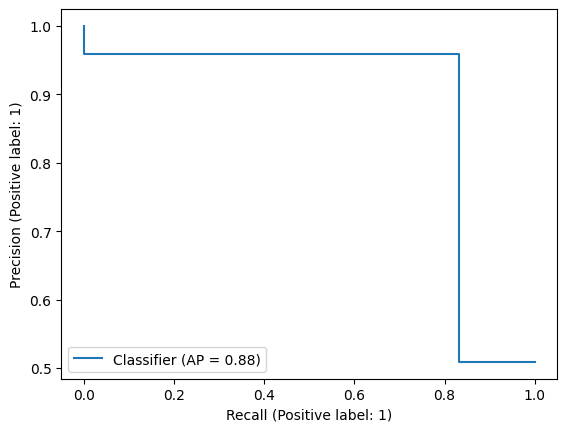

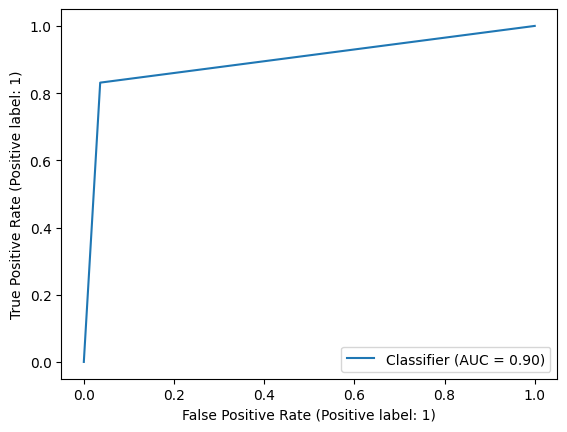

In [110]:
param_grid = {'n_estimators': [200,500,800,1000],
              'max_samples': [0.24,0.58,0.71,0.96],
              'max_features': np.linspace(0,1,5),
              'max_samples': np.linspace(0,1,5),
              'bootstrap': [True,False],
              'oob_score': [True,False]
             }

grid_bag = RandomizedSearchCV(BaggingClassifier(),param_grid,verbose=4)
train_and_evaluate_model(grid_bag)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END boosting_type=goss, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=500;, score=0.876 total time=   0.0s
[CV 2/5] END boosting_type=goss, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=500;, score=0.841 total time=   0.0s
[CV 3/5] END boosting_type=goss, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=500;, score=0.846 total time=   0.0s
[CV 4/5] END boosting_type=goss, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=500;, score=0.857 total time=   0.0s
[CV 5/5] END boosting_type=goss, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=500;, score=0.897 total time=   0.0s
[CV 1/5] END boosting_type=dart, importance_type=split, learning_rate=1.0, min_split_gain=0.68, n_estimators=1000;, score=0.889 total time=   0.9s
[CV 2/5] END boosting_type=dart, importance_type=split, learning_rate=1.0, min_spl

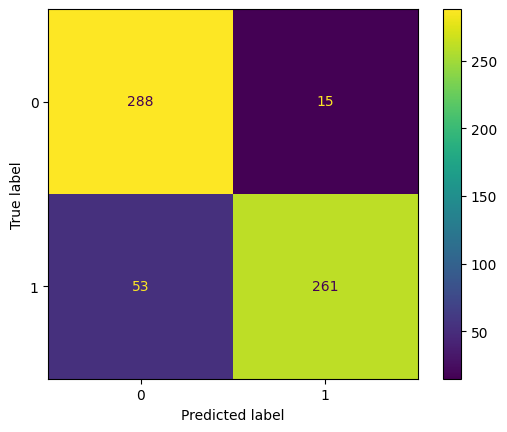

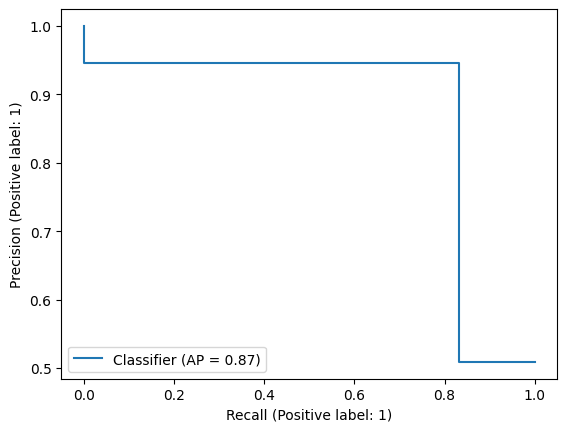

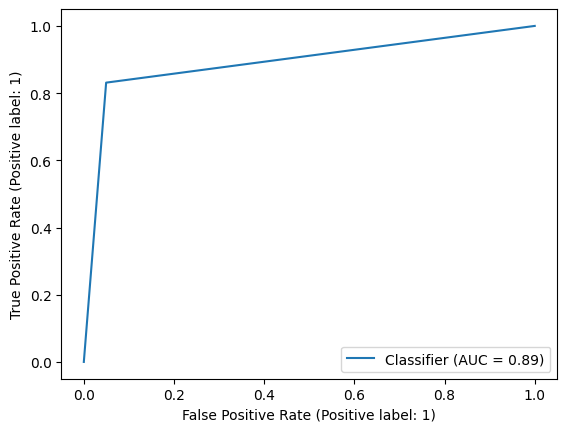

In [111]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
              'learning_rate': np.linspace(0,1,6)[1:],
              'n_estimators': [200,500,600,1000],
              'importance_type': ['split','gain'],
              'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMClassifier(),param_grid,verbose=3)
train_and_evaluate_model(grid_lgbm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, n_estimators=600, oob_score=False, warm_start=False;, score=0.884 total time=   2.0s
[CV 2/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, n_estimators=600, oob_score=False, warm_start=False;, score=0.865 total time=   2.0s
[CV 3/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, n_estimators=600, oob_score=False, warm_start=False;, score=0.857 total time=   1.8s
[CV 4/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, n_estimators=600, oob_score=False, warm_start=False;, score=0.868 total time=   1.7s
[CV 5/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, n_estimators=6

[CV 1/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, n_estimators=100, oob_score=True, warm_start=False;, score=0.878 total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, n_estimators=100, oob_score=True, warm_start=False;, score=0.851 total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, n_estimators=100, oob_score=True, warm_start=False;, score=0.849 total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, n_estimators=100, oob_score=True, warm_start=False;, score=0.865 total time=   0.3s
[CV 5/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, n_estimators=100, oob_score=True, warm_start=False;, score=0.864 total time=   0.3s
Classification Report:
              precision    recall  f1

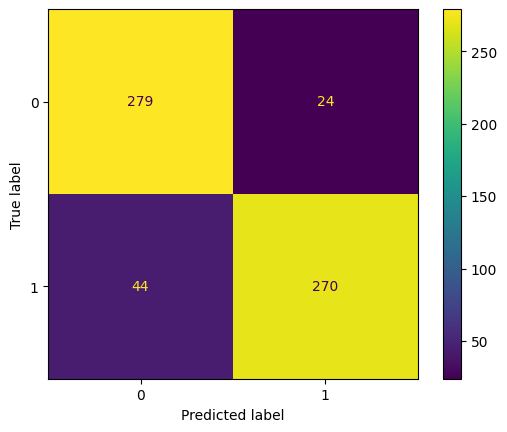

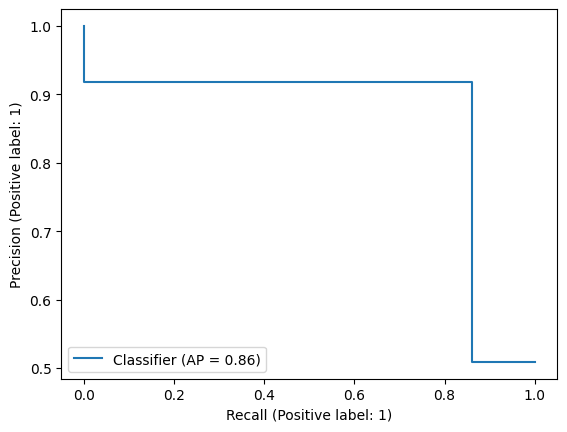

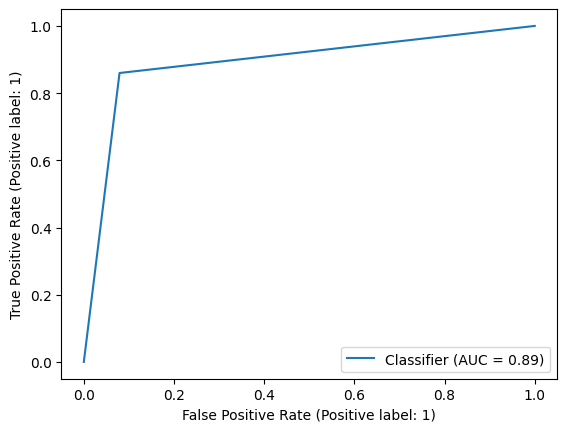

In [112]:
param_grid = {'n_estimators': [100,300,600,1000],
             'criterion': ['gini','entropy','log_loss'],
             'max_features': ['auto','sqrt','log2'],
             'bootstrap': [True,False],
             'class_weight': ['balanced','balanced_subsample'],
             'oob_score': [True,False],
             'warm_start': [True,False],
             'max_samples': [0.2,0.4,0.7,1]
             }

grid_et = RandomizedSearchCV(ExtraTreesClassifier(),param_grid,verbose=4)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.0, binarize=1.0, fit_prior=False;, score=0.641 total time=   0.0s
[CV 2/5] END alpha=0.0, binarize=1.0, fit_prior=False;, score=0.651 total time=   0.0s
[CV 3/5] END alpha=0.0, binarize=1.0, fit_prior=False;, score=0.638 total time=   0.0s
[CV 4/5] END alpha=0.0, binarize=1.0, fit_prior=False;, score=0.605 total time=   0.0s
[CV 5/5] END alpha=0.0, binarize=1.0, fit_prior=False;, score=0.656 total time=   0.0s
[CV 1/5] END alpha=1.0, binarize=0.5, fit_prior=False;, score=0.695 total time=   0.0s
[CV 2/5] END alpha=1.0, binarize=0.5, fit_prior=False;, score=0.670 total time=   0.0s
[CV 3/5] END alpha=1.0, binarize=0.5, fit_prior=False;, score=0.665 total time=   0.0s
[CV 4/5] END alpha=1.0, binarize=0.5, fit_prior=False;, score=0.657 total time=   0.0s
[CV 5/5] END alpha=1.0, binarize=0.5, fit_prior=False;, score=0.678 total time=   0.0s
[CV 1/5] END alpha=0.2, binarize=0.75, fit_prior=False;, score=0.673 

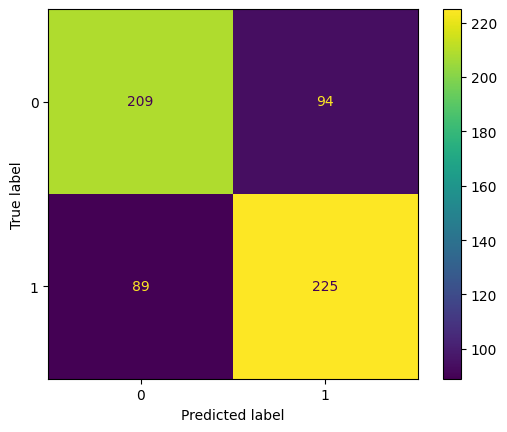

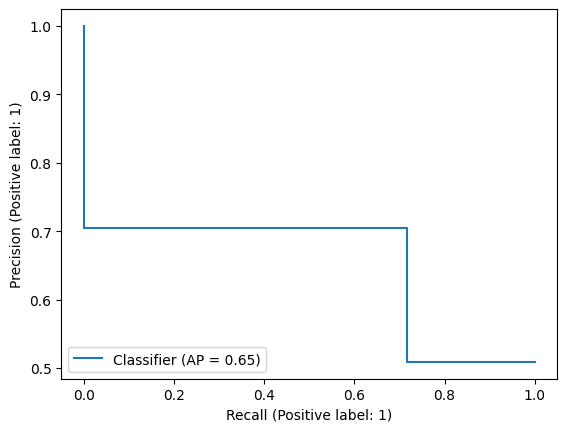

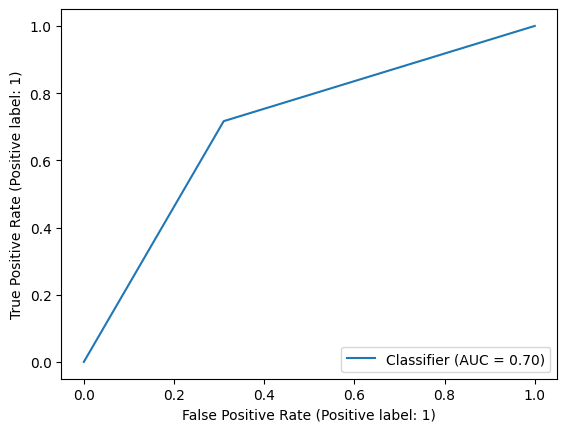

In [113]:
param_grid = {'alpha': np.linspace(0,1,6),
              'binarize': np.linspace(0,1,5),
              'fit_prior': [True,False]
             }

grid_bnb = RandomizedSearchCV(BernoulliNB(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_bnb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.5, fit_intercept=False, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=False, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=False, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=False, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=False, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.5, fit_intercept=True, positive=False, solver=cholesky; total time=   0.0s
[CV] END alpha=0.0, fit_intercept=

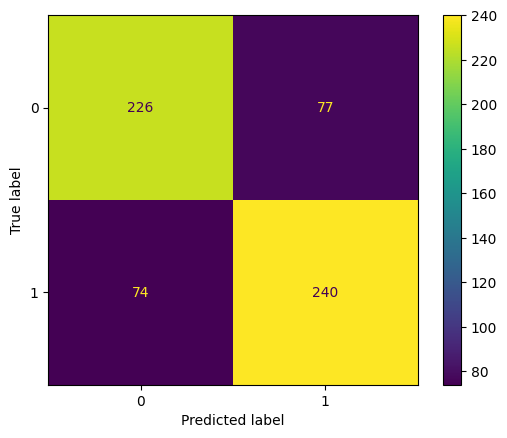

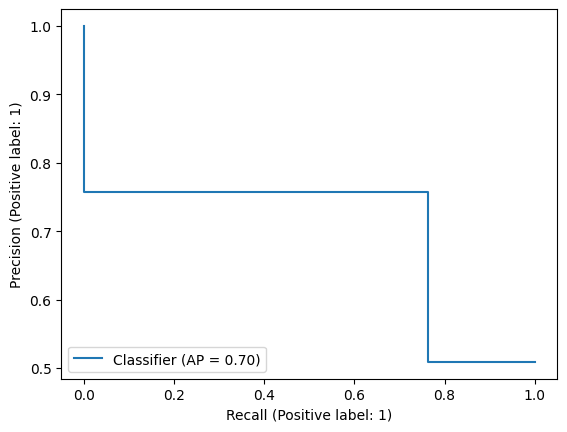

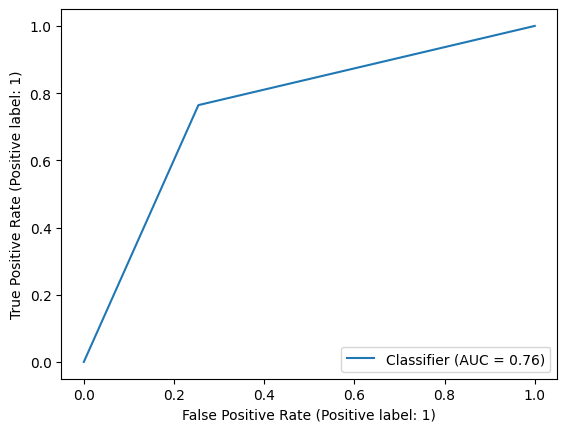

In [114]:
param_grid = {'alpha': np.linspace(0,1,5),
              'fit_intercept': [True,False],
              'positive': [True,False],
              'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']}

grid_ridge = RandomizedSearchCV(RidgeClassifier(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=500; total time=   2.5s
[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=500; total time=   2.1s
[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=500; total time=   2.2s
[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=500; total time=   1.8s
[CV] END .algorithm=SAMME, learning_rate=1, n_estimators=500; total time=   2.0s
[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=800; total time=   4.0s
[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=800; total time=   4.4s
[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=800; total time=   4.2s
[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=800; total time=   4.0s
[CV] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=800; total time=   4.3s
[CV] END algorithm=SAMME.R, learning_rate=0.4, n_estimators=200; total time=   0.9s
[CV] END algorithm=SAMME.R, le

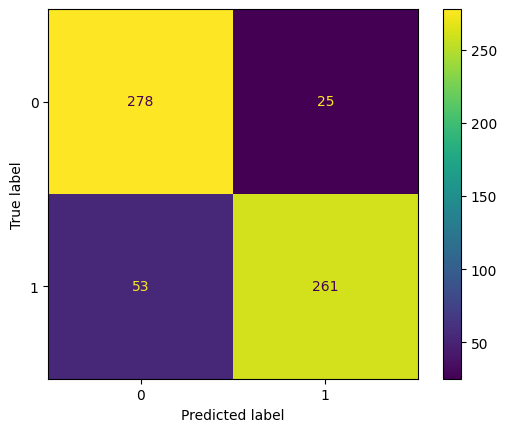

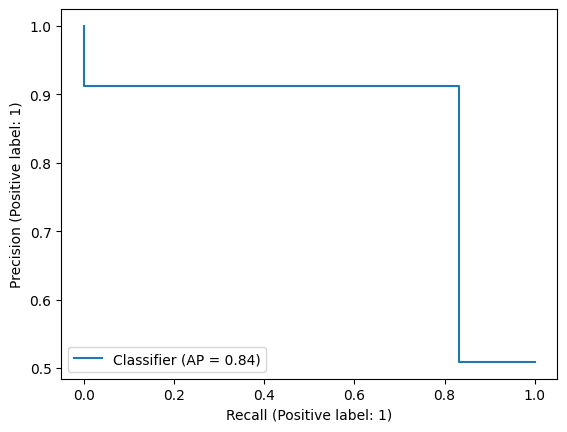

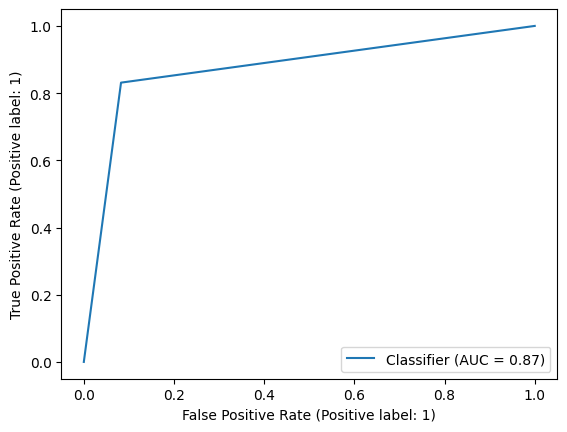

In [118]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.1,0.4,0.7,1],
    'algorithm': ['SAMME','SAMME.R']
}

grid_ab = RandomizedSearchCV(AdaBoostClassifier(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=gbtree, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=800, sampling_method=gradient_based;, score=nan total time=   0.2s
[CV 2/5] END booster=gbtree, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=800, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=800, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=800, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=800, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, grow_policy=0, importance_type=cover, learning_rate=1, n_estimators=200, sampling_metho

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       303
           1       0.76      0.76      0.76       314

    accuracy                           0.76       617
   macro avg       0.76      0.76      0.76       617
weighted avg       0.76      0.76      0.76       617

--------------------------------------------------


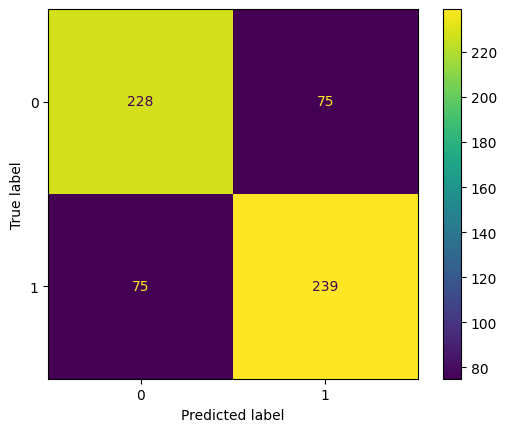

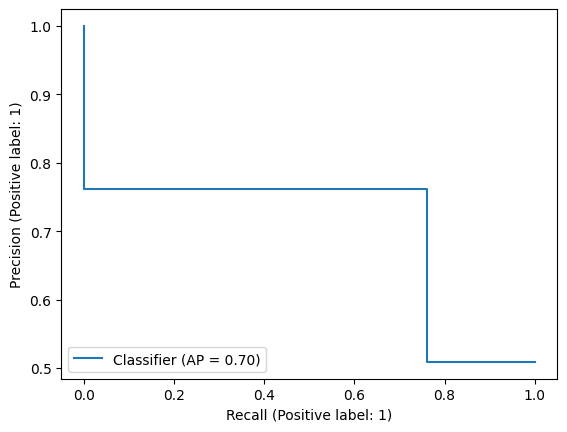

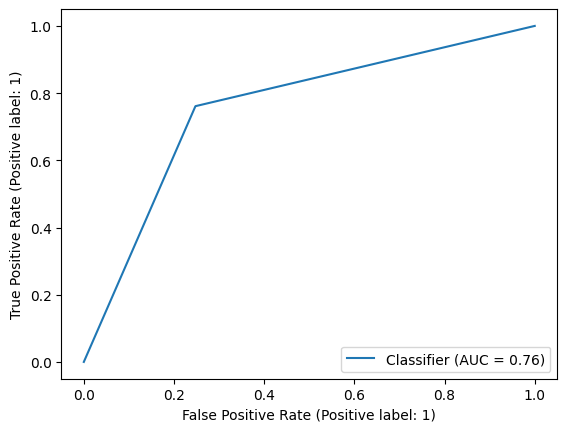

In [120]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.2,0.5,0.8,1],
    'booster': ['gbtree','gblinear','dart'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover'],
    'sampling_method': ['uniform','gradient_based'],
    'grow_policy': [0,1]
}

grid_xgb = RandomizedSearchCV(XGBClassifier(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

## Optimized Models Performance Comparison

In [121]:
model_perfs = pd.DataFrame({'Model': models, 
                            'Accuracy': accuracy_scores, 
                            'Precision': precision_scores,
                            'Recall': recall_scores,
                            'F1': f1_scores}).sort_values('Accuracy',ascending=False).reset_index(drop=True)
model_perfs

,Model,Accuracy,Precision,Recall,F1
0,"(ExtraTreeClassifier(random_state=951098263), ...",0.917342,0.918534,0.917865,0.917328
1,"StackingClassifier(estimators=[('CAT',\n ...",0.914100,0.917691,0.914969,0.914010
2,"VotingClassifier(estimators=[('CAT',\n ...",0.914100,0.917691,0.914969,0.914010
3,HistGradientBoostingClassifier(),0.909238,0.913592,0.910192,0.909112
4,"XGBClassifier(base_score=None, booster=None, c...",0.905997,0.908392,0.906718,0.905941
5,"(DecisionTreeClassifier(max_features='auto', r...",0.905997,0.909786,0.906892,0.905888
6,"RandomizedSearchCV(cv=5, estimator=RandomFores...",0.904376,0.908416,0.905299,0.904254
7,"RandomizedSearchCV(cv=5, estimator=HistGradien...",0.904376,0.907419,0.905184,0.904295
8,<catboost.core.CatBoostClassifier object at 0x...,0.901135,0.905697,0.902115,0.900985
9,"RandomizedSearchCV(cv=5,\n e...",0.899514,0.902304,0.900291,0.899437


The Extra Trees Classifier model has outperformed all other models by achieving a superb accuracy of almost 92% on the test set.

In [122]:
best_model = model_perfs.iloc[0]['Model']
best_model

ExtraTreesClassifier()

In [123]:
avg_cv_scores = cross_val_score(best_model,final_X_test,y_test,scoring='accuracy',cv=5,verbose=2)
mean_score = round(np.mean(avg_cv_scores),4)
print(f"Mean Cross Validation Performance of Extra Trees Classifier: {mean_score*100}%")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END .................................................... total time=   0.1s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.1s
Mean Cross Validation Performance of Extra Trees Classifier: 84.44%


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.1s finished


The cross validation performance of the Extra Trees Classifier model is not bad either. 

## Saving the best performing model for deployment into production

In [125]:
pipeline = Pipeline([
    ('scaler',scaler),
    ('model',best_model)
])
pipeline

Pipeline(steps=[('scaler', StandardScaler()),
                ('model', ExtraTreesClassifier())])

In [126]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [127]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('scaler', StandardScaler()),
                ('model', ExtraTreesClassifier())])

In [129]:
gc.collect()

0

In [130]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

Min value of Age: 18
Max value of Age: 60
Min value of DailyRate: 102
Max value of DailyRate: 1499
Min value of DistanceFromHome: 1
Max value of DistanceFromHome: 29
Min value of JobLevel: 1
Max value of JobLevel: 5
Min value of MonthlyRate: 2094
Max value of MonthlyRate: 26999
Min value of OverTime_Yes: 0.0
Max value of OverTime_Yes: 1.0
Min value of YearsAtCompany: 0
Max value of YearsAtCompany: 18
Min value of TotalWorkingYears: 0.0
Max value of TotalWorkingYears: 28.5
Min value of MaritalStatus_Single: 0.0
Max value of MaritalStatus_Single: 1.0
Min value of StockOptionLevel: 0.0
Max value of StockOptionLevel: 2.5
